## Raw data location, cleaning and processing

### How does an estuary microbial community responds to disturbances and what environmental factors drive the response?

In [1]:
import sys
import os

sys.path.append(os.path.abspath('..')) #utils is in the project repo
from scripts.utils import *

%matplotlib inline

In [ ]:
import plotly.offline as pyo
import plotly.graph_objs as go
import plotly.io as pio
pyo.init_notebook_mode()
pio.renderers.default='notebook'

## Methods
Data formatted + cleaned for 2014-2021 (2022 to come)
- Ran through the pipeline splitting 16S/18S
> Focus on bacteria/archaea and chloroplast
- We have 5 depths
> Vertical connectivity

#### What are the observable physical/chemical disturbances based off metadata, and define their scale.
Environmental metadata

**I think we should focus on 1 or 2 disturbances first: the most frequent or impactful events**

Known list of events:
- Tropical storm Arthur Jul2014 (Cat1, heavy rains)
- Hurricane Matthew Oct2016 (Heavy rains)
- Post-tropical storm Gert Sept2017 
- Hurricane Dorian Sep2019 (Category 2)
- Post-tropical storm Teddy Sep2020 (+- Rains)
- Hurricane Fiona Sep2022 (Cat2 5x more damage than Dorian)
- Extratropical cyclone Lee Sep 2023 (Mild rains and winds)

Disturbances via metadata
+ Plot time series of each variable of interest
+ Identify large deviations
> Storm-associated changes only

#### EDA of metadata

- large temperature shifts (heatwaves, cold snaps)

In [2]:
all_depths('temperature')

- extreme salinity shifts
    - may 2017 drop

In [3]:
all_depths('sigmaTheta', hidden=[10]) #salinity, Salinity, sigmaTheta

- nutrient spikes or eutrophication events?
    - Sept 2019/2017: Nitrite spike in depth 60 post-Dorian post-Gert, not at 1m as expected after fall bloom
    - Nov 2019 (nitrification at 60m), and Nov 2021 N2O peaks (Martha)

In [4]:
all_depths('Nitrite', hidden=[60]) #temperature, Nitrate, Nitrite, Phosphate, Silicate, Ammonia, Salinity

In [5]:
make_int_plot('Nitrite',5)

/Users/Diana/Documents/escuela/phd/ch2/bedfordbasinTS/functions.py:350: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



- storms, heavy rainfall
    - I need to download the rainfall data from Env. Canada
> If we are interested in storms, this is probably what I need and identify major rainfall as disturbances

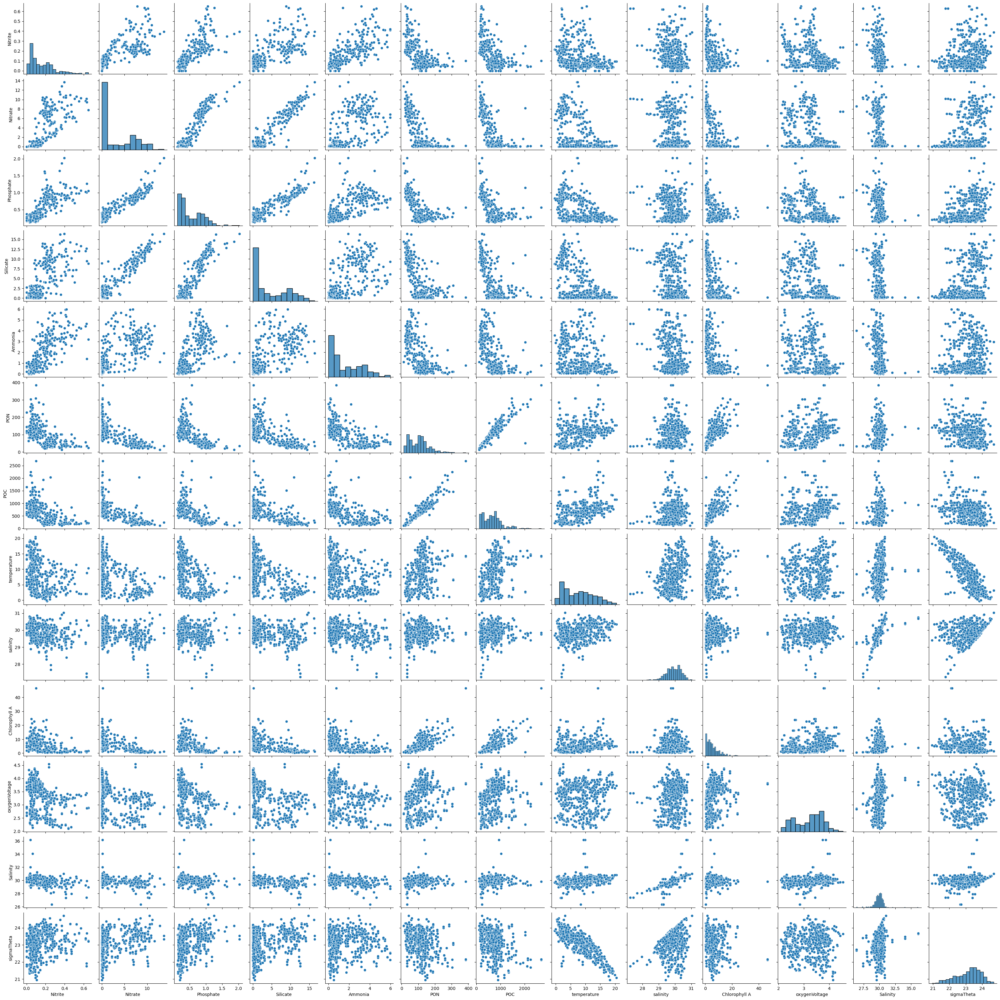

In [ ]:
correlation_pairplot(lab_md, selected_columns, 5)
#PON, POC correlated

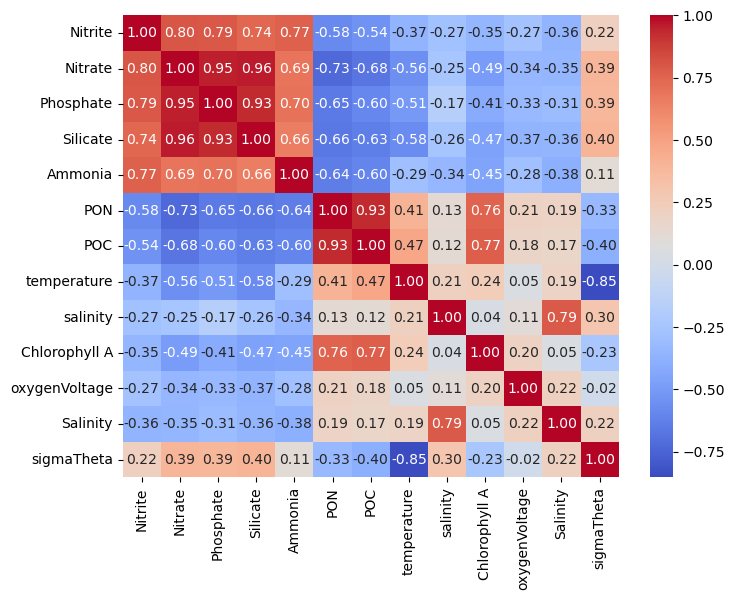

In [3]:
lab_md = pd.read_csv("/Users/Diana/Downloads/allmetadata_edit_Oct17_2024(allmetadata).csv")
selected_columns=['Nitrite', 'Nitrate', 'Phosphate', 'Silicate', 'Ammonia','PON', 'POC','temperature', 'salinity', 'Chlorophyll A', 'oxygenVoltage', 'Salinity', 'sigmaTheta']
pca_result, corr_matrix = pca_and_correlation_analysis(lab_md, selected_columns, n_components=3, plot=True, depth=5)

Nutrients are correlated (Nitrite, Nitrate, Phosphate, Silicate, Ammonia)

Look directly for community shifts:
- Plot alpha diversity over time
- Plot ordination plots
- Indicator species

#### Describe the temporal succession of the community to disturbances
Years: 2014-2022

#### Can we identify disturbances based off changes in the microbial community (i.e. does change in community = disturbance?)


#### Did the community change in response to disturbances?

How much time for the community to revert? (Disturbances in september 2019-2022)
Focus on which type of disturbances? precipitations
How do we define the scope?

#### Metadata __md__ is formatted. It contains 38 columns.
__md__ is the lab's metadata for sampling, extraction and sequencing. \
__dfo_md__ is BBMP remote sensing data (salinity, pH, temperature, density..) \
__bio_niskin__ is nutrient data \
Format __bio_niskin__ data to merge with __md__. __bio_niskin__ is 32 columns, including year, month, day, and depth. __dfo_md__ also has 32 columns, including year_time, month_time, day_time. To merge these data with __md__, we will change the time stamps columns to the same name, and generate a time_string column.

CERC Lab nutrient data?

In [212]:
#here import the lab metadata
md = load_df()
#typo in names
md.replace({'BB18. 50AL': 'BB18.50AL',
            'BB18..16CL': 'BB18.16CL',
           'BB18.13.BS': 'BB18.13BS',
           'BB18.13.CL': 'BB18.13CL',
           'BB18.13CDS': 'BB18.13DS'}, inplace=True)
all_md = reformat_md(md)

/Users/Diana/Documents/escuela/phd/ch2/bb_data/2014/METADATA.txt
/Users/Diana/Documents/escuela/phd/ch2/bb_data/2022/METADATA.txt
/Users/Diana/Documents/escuela/phd/ch2/bb_data/2015/METADATA.txt
/Users/Diana/Documents/escuela/phd/ch2/bb_data/2017/METADATA.txt
/Users/Diana/Documents/escuela/phd/ch2/bb_data/2019/METADATA.txt
/Users/Diana/Documents/escuela/phd/ch2/bb_data/2021/METADATA.txt
/Users/Diana/Documents/escuela/phd/ch2/bb_data/2020/METADATA.txt
/Users/Diana/Documents/escuela/phd/ch2/bb_data/2018/METADATA.txt
/Users/Diana/Documents/escuela/phd/ch2/bb_data/2016/METADATA.txt


/Users/Diana/Documents/escuela/phd/ch2/bedfordbasinTS/scripts/utils.py:600: UserWarning:

You are merging on int and float columns where the float values are not equal to their int representation.

/Users/Diana/Documents/escuela/phd/ch2/bedfordbasinTS/scripts/utils.py:601: UserWarning:

You are merging on int and float columns where the float values are not equal to their int representation.

/Users/Diana/Documents/escuela/phd/ch2/bedfordbasinTS/scripts/utils.py:605: UserWarning:

You are merging on int and float columns where the float values are not equal to their int representation.

/Users/Diana/Documents/escuela/phd/ch2/bedfordbasinTS/scripts/utils.py:614: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



problematique = ['BB17.28B', 'BB19.a35BS','BB19.a35CS', 'BB21.16AL', 'BB18.13.BS','BB18.13.CL', 'BB18.13CDS', 'BB18.45ALb', 'BB18.45ASb', 'BB18.45BLb', 'BB18.45BSb', 'BB18.45CLb', 'BB18.45CSb','BB18.45DLb', 'BB18.45DSb', 'BB16.12A', 'BB16.12B', 'BB16.12C','BB16.12D'] #anything after week 32 in year 2021 #weeks 12 to 37 are missing from 2020 #BB17 _ 28B is missing; no notes in the metadata file #BB19 a35BS and CS were accidently combined #no idea why BB21-16AL is missing #all the BB18 45__b were extracted by accident #BB16 week 12 no samples

From March 25, change in the METADATA file; use the file generated by the LAB (Ella, Martha, Becca)

In [4]:
#becca, martha and ella reformatted the dataset 
os.chdir("/Users/Diana/Documents/escuela/phd/ch2/bedfordbasinTS")
bbmp_updated = pd.read_csv("data/BBMP_all_enviro_and_DNA.csv")

In [3]:
df = consolidate_tables(year=all)

Found all yearly tables
Successfully saved all tables.


In [4]:
copy = df.copy()

In [6]:
copy["year"] = '20' + copy['nouveau'].str.extract(r'BB(\d{2})(?=\.)')

In [18]:
depth_num = {
    "A": 1,
    "B": 5,
    "C": 10,
    "D": 60,
    "E": 30
}


df = copy[['nouveau', 'feature_id', 'feature_frequency']].copy()
df.rename(columns={'nouveau':'sample_name'}, inplace=True)
df['sample_name'] = df['sample_name'].str.replace(r'\.0(\d)', r'.\1', regex=True) #remove the leading zero

df = df[df.feature_frequency != 0] #remove null rows
df

,sample_name,feature_id,feature_frequency
0,BB14.10A,df29deb0aff9e983f503e7471e71f4ec,3295.0
1,BB14.10B,df29deb0aff9e983f503e7471e71f4ec,4254.0
2,BB14.10C,df29deb0aff9e983f503e7471e71f4ec,3931.0
3,BB14.10D,df29deb0aff9e983f503e7471e71f4ec,654.0
4,BB14.11A,df29deb0aff9e983f503e7471e71f4ec,585.0
...,...,...,...
2339576,BB16.51A,c8c7844e0054e3c5c4e806c7e002fd67,1.0
2339776,BB16.51A,798d78f37dc777bf25d384de54157806,1.0
2339979,BB16.51D,533452b626d38498d9846e0c614206c0,1.0
2340179,BB16.51D,c7c37ee82988c77d5ac0e4e14c907c6a,1.0


In [19]:
samplecol = 'sample_name'
# This regex first looks for 'SL', then 'S', then 'L'. If none is found, we fill with 'W'.
df["size_code"] = df[samplecol].str.extract(r'(SL|S|L)')
df["size_code"] = df["size_code"].fillna('W')

df["depth_code"] = df[samplecol].str.extract(r'[1-9][0-9]?([A-E])')
df['depth']= df['depth_code'].map(depth_num)
df["weekn"] = df[samplecol].str.extract(r'\.([1-9][0-9]?)[A-E]')
df['weekn'] = pd.to_numeric(df['weekn'])
df['depth'] = pd.to_numeric(df['depth'])

In [21]:
df['Total'] = df['feature_frequency'].groupby(df[samplecol]).transform('sum')
df['ratio'] = df['feature_frequency']/df['Total']
df['nASVs'] = df['feature_id'].groupby(df[samplecol]).transform('count')
df['weekdepth'] = df["weekn"].astype(str) + df["depth"].astype(str)
df['avg'] = df['nASVs'].groupby(df['weekdepth']).transform('mean')
df['diff'] = df['nASVs'] - df['avg']

df["year"] = '20' + df[samplecol].str.extract(r'BB(\d{2})(?=\.)')
df['datetime'] = pd.to_datetime(
df['year'].astype(str) + '-W' + df['weekn'].astype(int).astype(str) + '-1',
format='%Y-W%W-%w')

df=df.rename(columns={samplecol: "sampleid"})

df

,sampleid,feature_id,feature_frequency,size_code,depth_code,depth,weekn,Total,ratio,nASVs,weekdepth,avg,diff,year,datetime
0,BB14.10A,df29deb0aff9e983f503e7471e71f4ec,3295.0,W,A,1,10,30101.0,0.109465,292,101,334.799808,-42.799808,2014,2014-03-10
1,BB14.10B,df29deb0aff9e983f503e7471e71f4ec,4254.0,W,B,5,10,27296.0,0.155847,285,105,304.940902,-19.940902,2014,2014-03-10
2,BB14.10C,df29deb0aff9e983f503e7471e71f4ec,3931.0,W,C,10,10,22612.0,0.173846,256,1010,310.122587,-54.122587,2014,2014-03-10
3,BB14.10D,df29deb0aff9e983f503e7471e71f4ec,654.0,W,D,60,10,22063.0,0.029642,364,1060,418.308014,-54.308014,2014,2014-03-10
4,BB14.11A,df29deb0aff9e983f503e7471e71f4ec,585.0,W,A,1,11,5771.0,0.101369,123,111,297.703956,-174.703956,2014,2014-03-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2339576,BB16.51A,c8c7844e0054e3c5c4e806c7e002fd67,1.0,W,A,1,51,72687.0,0.000014,949,511,609.610425,339.389575,2016,2016-12-19
2339776,BB16.51A,798d78f37dc777bf25d384de54157806,1.0,W,A,1,51,72687.0,0.000014,949,511,609.610425,339.389575,2016,2016-12-19
2339979,BB16.51D,533452b626d38498d9846e0c614206c0,1.0,W,D,60,51,68282.0,0.000015,746,5160,509.423419,236.576581,2016,2016-12-19
2340179,BB16.51D,c7c37ee82988c77d5ac0e4e14c907c6a,1.0,W,D,60,51,68282.0,0.000015,746,5160,509.423419,236.576581,2016,2016-12-19


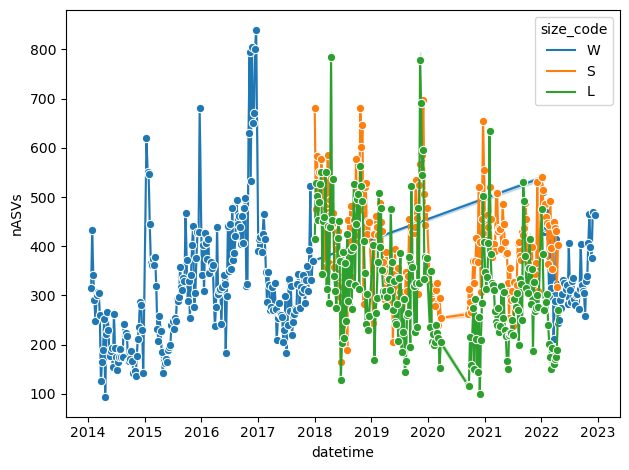

In [22]:
#sanity check for all my samples
sns.lineplot(data=df.sort_values('datetime'), x='datetime', y='nASVs', marker='o', hue='size_code')
plt.tight_layout()
plt.show()

In my initial analyses, the latest sample I had was:
Last sample: 2021-08-02 00:00:00

In [27]:
separated = pick_metadata(df) #here I add the taxonomy

Appended all taxonomies to taxos
Saved separated by metadata dataframe.


In [28]:
separated.head()

,sampleid,feature_id,feature_frequency,size_code,depth_code,depth,weekn,Total,ratio,nASVs,weekdepth,avg,diff,year,datetime,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species
0,BB14.10A,df29deb0aff9e983f503e7471e71f4ec,3295.0,W,A,1,10,30101.0,0.109465,292,101,334.799808,-42.799808,2014,2014-03-10,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.945295,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Sulfitobacter,Unassigned
1,BB14.10A,df29deb0aff9e983f503e7471e71f4ec,3295.0,W,A,1,10,30101.0,0.109465,292,101,334.799808,-42.799808,2014,2014-03-10,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.989359,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Sulfitobacter,Unassigned
2,BB14.10B,df29deb0aff9e983f503e7471e71f4ec,4254.0,W,B,5,10,27296.0,0.155847,285,105,304.940902,-19.940902,2014,2014-03-10,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.945295,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Sulfitobacter,Unassigned
3,BB14.10B,df29deb0aff9e983f503e7471e71f4ec,4254.0,W,B,5,10,27296.0,0.155847,285,105,304.940902,-19.940902,2014,2014-03-10,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.989359,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Sulfitobacter,Unassigned
4,BB14.10C,df29deb0aff9e983f503e7471e71f4ec,3931.0,W,C,10,10,22612.0,0.173846,256,1010,310.122587,-54.122587,2014,2014-03-10,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.945295,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Sulfitobacter,Unassigned


In [26]:
df.to_csv('merged_may12.csv')

In [29]:
separated.sampleid = separated.sampleid.replace({'BB19.35CSb': 'BB19.35CS', 'BB19.35BSb': 'BB19.35BS'})

In [213]:
#i a going to need the DNA concentration of size fractionated samples to make the si
dnaconc = md[['sampleid', '[DNA]ng/uL']].copy()

In [214]:
dnaconc['sampleid'] = dnaconc['sampleid'].str.replace(r'\.a(\d{1,2}[A-Za-z]{1,2})', r'.\1', regex=True)

In [215]:
dfinal = separated.merge(dnaconc, on="sampleid", how = 'left')

In [194]:
#sanity check
dfinaltest = dfinal[dfinal.size_code != 'W']
dfinaltest[dfinaltest.isnull().any(axis=1)]

,sampleid,feature_id,feature_frequency,size_code,depth_code,depth,weekn,Total,ratio,nASVs,weekdepth,avg,diff,year,datetime,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species,[DNA]ng/uL
639145,BB19.10CL,43a02950db89fdd2652d4969d6b25a02,88.0,L,C,10,10,21310.0,0.004130,233,1010,310.122587,-77.122587,2019,2019-03-11,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,19.9
639146,BB19.11AL,43a02950db89fdd2652d4969d6b25a02,136.0,L,A,1,11,47261.0,0.002878,278,111,297.703956,-19.703956,2019,2019-03-18,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,25.9
639147,BB19.11BS,43a02950db89fdd2652d4969d6b25a02,56.0,S,B,5,11,31096.0,0.001801,221,115,308.398398,-87.398398,2019,2019-03-18,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,52.3
639148,BB19.12BL,43a02950db89fdd2652d4969d6b25a02,154.0,L,B,5,12,14523.0,0.010604,212,125,293.187462,-81.187462,2019,2019-03-25,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,32.4
639149,BB19.12CL,43a02950db89fdd2652d4969d6b25a02,131.0,L,C,10,12,47058.0,0.002784,294,1210,304.410465,-10.410465,2019,2019-03-25,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,10.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1434368,BB18.5AL,01e398788eb02f1001714ed3b575bde0,1.0,L,A,1,5,34299.0,0.000029,688,51,486.757662,201.242338,2018,2018-01-29,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,13.0
1434369,BB18.5DS,9ccbc4dd1d0b20027261de36938930e6,1.0,S,D,60,5,84946.0,0.000012,725,560,452.162728,272.837272,2018,2018-01-29,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,24.2
1434371,BB18.7CL,68ba1d6dca35badd9b2c6133c2cc3a90,1.0,L,C,10,7,9738.0,0.000103,314,710,364.872712,-50.872712,2018,2018-02-12,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,9.8
1434373,BB18.8DS,b79a88263ae65bbcfc700a592229c142,1.0,S,D,60,8,66930.0,0.000015,707,860,439.021151,267.978849,2018,2018-02-19,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,20.7


In [198]:
dfinal[dfinal['sampleid']=='BB22.1A']

,sampleid,feature_id,feature_frequency,size_code,depth_code,depth,weekn,Total,ratio,nASVs,weekdepth,avg,diff,year,datetime,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species,[DNA]ng/uL
71667,BB22.1A,b9f32166331c95006dcc8caa2e5048de,1435.0,W,A,1,1,42910.0,0.033442,605,11,523.970971,81.029029,2022,2022-01-03,d__Archaea; p__Crenarchaeota; c__Nitrososphaer...,0.997738,d__Archaea,p__Crenarchaeota,c__Nitrososphaeria,o__Nitrosopumilales,f__Nitrosopumilaceae,g__Candidatus_Nitrosopumilus,Unassigned,NaN
71668,BB22.1A,b9f32166331c95006dcc8caa2e5048de,1435.0,W,A,1,1,42910.0,0.033442,605,11,523.970971,81.029029,2022,2022-01-03,d__Archaea; p__Crenarchaeota; c__Nitrososphaer...,0.999781,d__Archaea,p__Crenarchaeota,c__Nitrososphaeria,o__Nitrosopumilales,f__Nitrosopumilaceae,g__Candidatus_Nitrosopumilus,Unassigned,NaN
72335,BB22.1A,af4ec853b8f3af897984b19fd4b71d91,1399.0,W,A,1,1,42910.0,0.032603,605,11,523.970971,81.029029,2022,2022-01-03,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.961687,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Planktomarina,Unassigned,NaN
72336,BB22.1A,af4ec853b8f3af897984b19fd4b71d91,1399.0,W,A,1,1,42910.0,0.032603,605,11,523.970971,81.029029,2022,2022-01-03,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.955860,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Planktomarina,Unassigned,NaN
73073,BB22.1A,c497da3b39f30aceede6bec3b03cd100,550.0,W,A,1,1,42910.0,0.012818,605,11,523.970971,81.029029,2022,2022-01-03,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.974485,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__SAR11_clade,f__Clade_I,g__Clade_Ia,Unassigned,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
321374,BB22.1A,5df14b3a23beff53a08e44a15361d800,2.0,W,A,1,1,42910.0,0.000047,605,11,523.970971,81.029029,2022,2022-01-03,d__Bacteria; p__Bacteroidota; c__Bacteroidia; ...,0.984393,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Bacteroidales,f__Paludibacteraceae,g__uncultured,s__uncultured_Bacteroidetes,NaN
321375,BB22.1A,50d177480757d76c07a7d8d8e68624a6,2.0,W,A,1,1,42910.0,0.000047,605,11,523.970971,81.029029,2022,2022-01-03,d__Bacteria; p__Bacteroidota; c__Bacteroidia; ...,0.960498,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Bacteroidales,f__Bacteroidetes_BD2-2,g__Bacteroidetes_BD2-2,s__uncultured_bacterium,NaN
321376,BB22.1A,e351872a096af6ec740b5a889be5e012,2.0,W,A,1,1,42910.0,0.000047,605,11,523.970971,81.029029,2022,2022-01-03,d__Bacteria; p__Bdellovibrionota; c__Oligoflex...,1.000000,d__Bacteria,p__Bdellovibrionota,c__Oligoflexia,o__0319-6G20,f__0319-6G20,g__0319-6G20,Unassigned,NaN
321377,BB22.1A,3ebc9532833e50387fb0f8065d34c3b0,2.0,W,A,1,1,42910.0,0.000047,605,11,523.970971,81.029029,2022,2022-01-03,d__Bacteria; p__Desulfobacterota; c__Desulfobu...,0.995782,d__Bacteria,p__Desulfobacterota,c__Desulfobulbia,o__Desulfobulbales,f__Desulfobulbaceae,g__uncultured,s__uncultured_gamma,NaN


In [203]:
sl_only = newseparated[newseparated['size_code'] == 'SL']

# Check unique years among SL samples
print("Years present in SL samples:")
print(sl_only['year'].dropna().unique())


Years present in SL samples:
[], Categories (9, object): ['2014', '2015', '2016', '2017', ..., '2019', '2020', '2021', '2022']


In [216]:
newseparated = make_news_memory_efficient(dfinal)

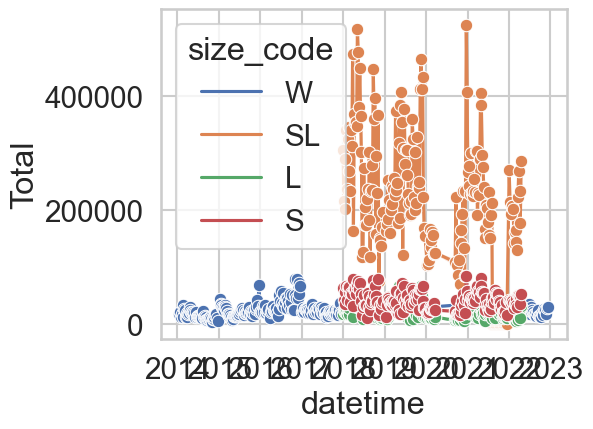

In [202]:
#sanity check for all my samples
#print y=Total to check library depth, and y=nASVs
sns.lineplot(data=newseparated.sort_values('datetime'), x='datetime', y='Total', marker='o', hue='size_code')
plt.tight_layout()
plt.show()

In [69]:
newseparated.to_csv('updated_newseparated_with_sl.csv')

repeat rarefaction

In [56]:
#pivot
feature_table = newseparated.pivot_table(index='sampleid', columns='feature_id', values='feature_frequency', fill_value=0)

In [80]:
summary_stats10k = repeat_rarefy(feature_table, depth=10000, n_iter=100)

In [81]:
summary_stats_flat = summary_stats10k.copy()
summary_stats_flat.columns = ['_'.join(col) + '_10k' for col in summary_stats_flat.columns]
summary_stats_flat = summary_stats_flat.reset_index()

In [82]:
df2 = df2.merge(summary_stats_flat, on='sampleid', how='left')
df2.to_csv('with10krarefaction_may13.csv')

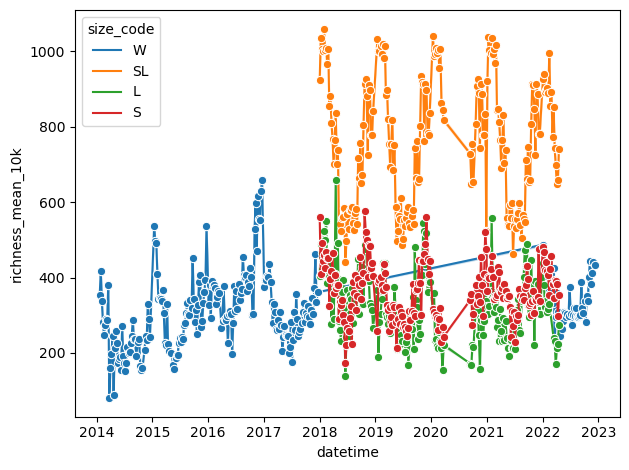

In [83]:
#sanity check for all my samples
#print y=Total to check library depth, and y=nASVs
sns.lineplot(data=df2.sort_values('datetime'), x='datetime', y='richness_mean_10k', marker='o', hue='size_code')
plt.tight_layout()
plt.show()

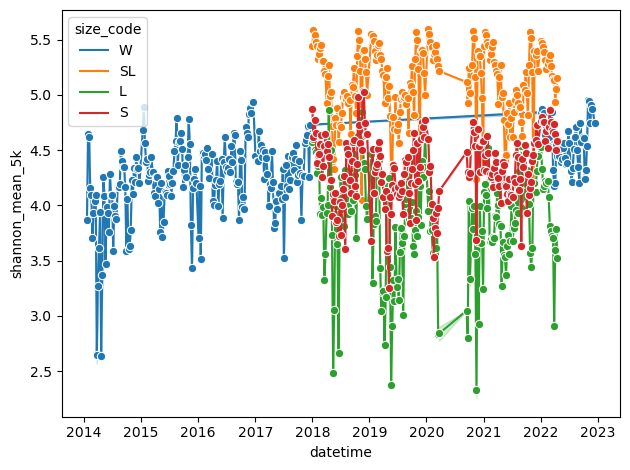

In [69]:
#sanity check for all my samples
#print y=Total to check library depth, and y=nASVs
sns.lineplot(data=df2.sort_values('datetime'), x='datetime', y='shannon_mean_5k', marker='o', hue='size_code')
plt.tight_layout()
plt.show()

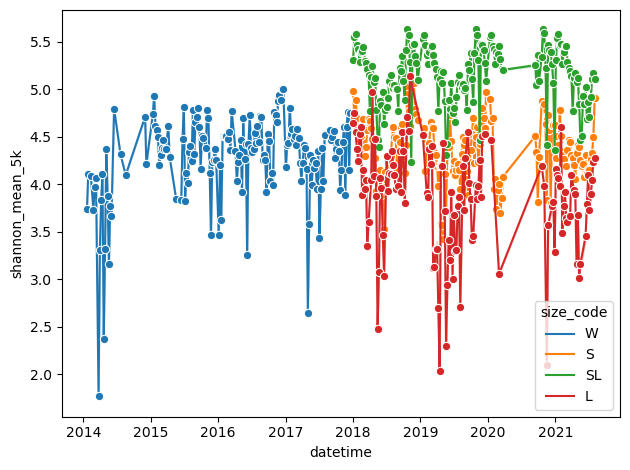

In [86]:
#sanity check for all my samples
#print y=Total to check library depth, and y=nASVs
sns.lineplot(data=df2.sort_values('datetime'), x='datetime', y='shannon_mean_5k', marker='o', hue='size_code')
plt.tight_layout()
plt.show()

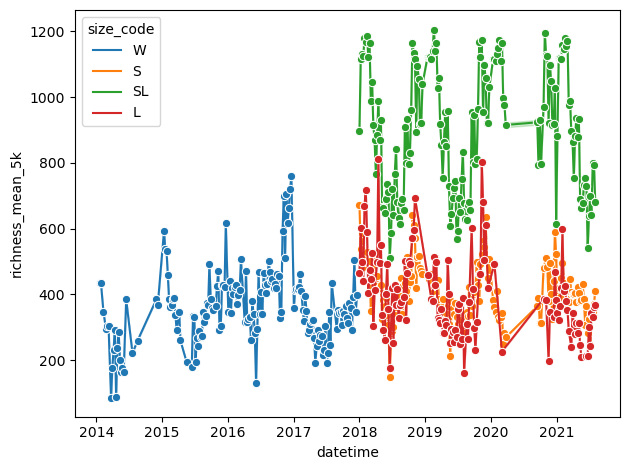

In [87]:
#sanity check for all my samples
#print y=Total to check library depth, and y=nASVs
sns.lineplot(data=df2.sort_values('datetime'), x='datetime', y='richness_mean_5k', marker='o', hue='size_code')
plt.tight_layout()
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'figures/depth10m_alpha_div_10krare.png'

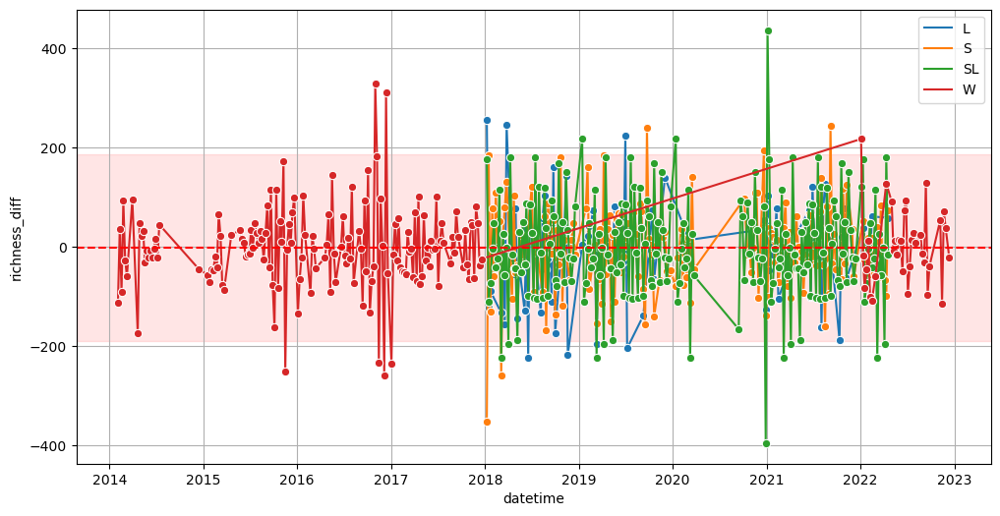

In [84]:
df2_1m = df2[df2['depth'] == 10]
collapsed = df2_1m[['size_code', 'datetime', 'richness_mean_10k']].drop_duplicates()

collapsed = collapsed.sort_values(['size_code', 'datetime'])
collapsed['richness_diff'] = collapsed.groupby('size_code')['richness_mean_10k'].diff()

mean_diff = collapsed['richness_diff'].mean()
std_diff = collapsed['richness_diff'].std()
lower_bound = mean_diff - 2 * std_diff
upper_bound = mean_diff + 2 * std_diff

plt.figure(figsize=(12, 6))
sns.lineplot(data=collapsed, x='datetime', y='richness_diff', hue='size_code', marker='o')

plt.axhline(mean_diff, color='red', linestyle='--', linewidth=1.5)

plt.axhspan(lower_bound, upper_bound, color='red', alpha=0.1)
plt.legend()
plt.grid(True)
plt.savefig('figures/depth10m_alpha_div_10krare.png', bbox_inches='tight')
plt.show()

In [254]:
newseparated

,sampleid,feature_id,size_code,depth_code,depth,weekn,datetime,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species,DNApr,[DNAt],feature_frequency,Total,ratio,nASVs,weekdepth,avg,diff,year,[DNA]ng/uL,rank,ranktot,shannon_diversity
0,BB22.18ASL,75ceeaa937c64399438614ca3706cf2a,SL,A,1,19,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.518519,35.1,246.296296,222269.539190,0.001108,1469,181,869.375560,599.624440,2019,NaN,191.0,0.130020,8.757472
1,BB22.18BSL,75ceeaa937c64399438614ca3706cf2a,SL,B,5,19,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.574074,37.8,4570.055556,250615.859519,0.018235,1308,185,780.497482,527.502518,2019,NaN,3.5,0.002676,8.491775
2,BB22.18BSL,75ceeaa937c64399438614ca3706cf2a,SL,B,5,19,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.425926,37.8,4570.055556,250615.859519,0.018235,1308,185,780.497482,527.502518,2019,NaN,3.5,0.002676,8.491775
3,BB22.18CSL,75ceeaa937c64399438614ca3706cf2a,SL,C,10,19,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.824176,45.5,1923.318681,181488.024830,0.010597,1002,1810,588.251292,413.748708,2019,NaN,13.5,0.013473,8.220470
4,BB22.18CSL,75ceeaa937c64399438614ca3706cf2a,SL,C,10,19,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.175824,45.5,1923.318681,181488.024830,0.010597,1002,1810,588.251292,413.748708,2019,NaN,13.5,0.013473,8.220470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072833,BB18.47BS,cd1c78b74af80f29c42521cc5560532a,S,B,5,47,2018-11-19,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,26567.000000,0.000038,487,475,826.008729,-339.008729,2018,24.2,483.5,0.992813,7.227867
1072834,BB18.48AS,c6df4cd74a21372a43bf3b4a3b4e5ef8,S,A,1,48,2018-11-26,d__Bacteria; p__Proteobacteria; c__Gammaproteo...,0.737806,d__Bacteria,p__Proteobacteria,c__Gammaproteobacteria,o__Enterobacterales,f__Yersiniaceae,g__Serratia,Unassigned,NaN,NaN,1.000000,44691.000000,0.000022,670,481,966.594962,-296.594962,2018,25.2,666.5,0.994776,7.549046
1072835,BB18.5DS,9ccbc4dd1d0b20027261de36938930e6,S,D,60,5,2018-01-29,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,84946.000000,0.000012,725,560,826.428390,-101.428390,2018,24.2,721.0,0.994483,6.608167
1072836,BB18.8DS,b79a88263ae65bbcfc700a592229c142,S,D,60,8,2018-02-19,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,66930.000000,0.000015,707,860,980.103193,-273.103193,2018,20.7,704.0,0.995757,7.051237


In [122]:
outliers = collapsed[(collapsed['richness_diff'] < lower_bound) |
                     (collapsed['richness_diff'] > upper_bound)]
outliers

,size_code,datetime,richness_mean,richness_diff
769045,L,2018-03-26,549.83,320.85
989185,S,2018-03-05,224.98,-320.22
955798,S,2020-12-21,685.66,257.95
260148,SL,2018-03-05,837.27,-355.33
260177,SL,2018-04-02,588.96,-278.14
...,...,...,...,...
131713,SL,2021-04-12,846.39,257.43
131909,SL,2021-07-19,787.08,268.29
576270,W,2016-11-07,892.87,253.80
576274,W,2016-11-14,560.38,-332.49


In [123]:
outliers['datetime'].unique()

array(['2018-03-26T00:00:00.000000000', '2018-03-05T00:00:00.000000000',
       '2020-12-21T00:00:00.000000000', '2018-04-02T00:00:00.000000000',
       '2018-04-09T00:00:00.000000000', '2018-07-16T00:00:00.000000000',
       '2019-03-11T00:00:00.000000000', '2019-04-08T00:00:00.000000000',
       '2019-04-15T00:00:00.000000000', '2019-07-22T00:00:00.000000000',
       '2020-03-09T00:00:00.000000000', '2020-12-28T00:00:00.000000000',
       '2021-01-04T00:00:00.000000000', '2021-03-08T00:00:00.000000000',
       '2021-04-05T00:00:00.000000000', '2021-04-12T00:00:00.000000000',
       '2021-07-19T00:00:00.000000000', '2016-11-07T00:00:00.000000000',
       '2016-11-14T00:00:00.000000000', '2017-01-02T00:00:00.000000000'],
      dtype='datetime64[ns]')

In [452]:
rarefied = pd.read_csv("/Users/Diana/Documents/escuela/phd/ch2/bedfordbasinTS/data/rarefied_output_new_20000.csv")

In [453]:
rarefied_long = rarefied.reset_index().melt(id_vars='Unnamed: 0', 
                                     var_name='feature_id', 
                                     value_name='feature_frequency')
rarefied_long = rarefied_long[rarefied_long["feature_frequency"].notna()]
rarefied_long

,Unnamed: 0,feature_id,feature_frequency
0,BB14.10A,index,0
1,BB14.10B,index,1
2,BB14.10C,index,2
3,BB14.10D,index,3
4,BB14.12C,index,4
...,...,...,...
66050435,BB22.8DSL,ffff59853df9ae7b03cfc0ca533fc40b,3
66050436,BB22.9ASL,ffff59853df9ae7b03cfc0ca533fc40b,0
66050437,BB22.9BSL,ffff59853df9ae7b03cfc0ca533fc40b,0
66050438,BB22.9CSL,ffff59853df9ae7b03cfc0ca533fc40b,0


In [456]:
rarefied_long = rarefied_long.rename(columns={"sample_name":"sampleid"})

In [457]:
rarefied_df = decorticate_sampleid(rarefied_long)

/var/folders/kv/yq6jygk116l27q2bwnk25k0w0000gn/T/ipykernel_70626/1024508002.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/kv/yq6jygk116l27q2bwnk25k0w0000gn/T/ipykernel_70626/1024508002.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/kv/yq6jygk116l27q2bwnk25k0w0000gn/T/ipykernel_70626/1024508002.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

In [98]:
#verify if any of the samples are empty (i.e. failed)
tiprob = newseparated[newseparated['feature_id'].isnull()]
tiprob['sampleid'].unique()

array([], dtype=object)

In [205]:
newseparated['Total'] = newseparated['feature_frequency'].groupby(newseparated['sampleid']).transform('sum')
newseparated['ratio'] = newseparated['feature_frequency']/newseparated['Total']
newseparated['nASVs'] = newseparated['feature_id'].groupby(newseparated['sampleid']).transform('nunique')

In [206]:
newseparated["year"] = '20' + newseparated["sampleid"].str.extract(r'BB(\d{2})(?=\.)')

In [207]:
problematic_rows = newseparated[newseparated['year'].isna() | newseparated['weekn'].isna()]

In [208]:
newseparated['datetime'] = pd.to_datetime(
    newseparated['year'].astype(str) + '-W' + newseparated['weekn'].astype(int).astype(str) + '-1',format='%Y-W%W-%w')

In [458]:
tableid = rarefied_df

depth1 = tableid[tableid.depth_code == 'A']
#depth1 = depth1[depth1.size_code != 'SL']

sizecodes = ['S', 'L', 'W', 'SL']
palette_colors = sns.color_palette()
palette_dict = {sizecode: color for sizecode, color in zip(sizecodes, palette_colors)}

In [459]:
rarefied_df['size_code'].unique()

array(['W', 'L', 'S', 'SL'], dtype=object)

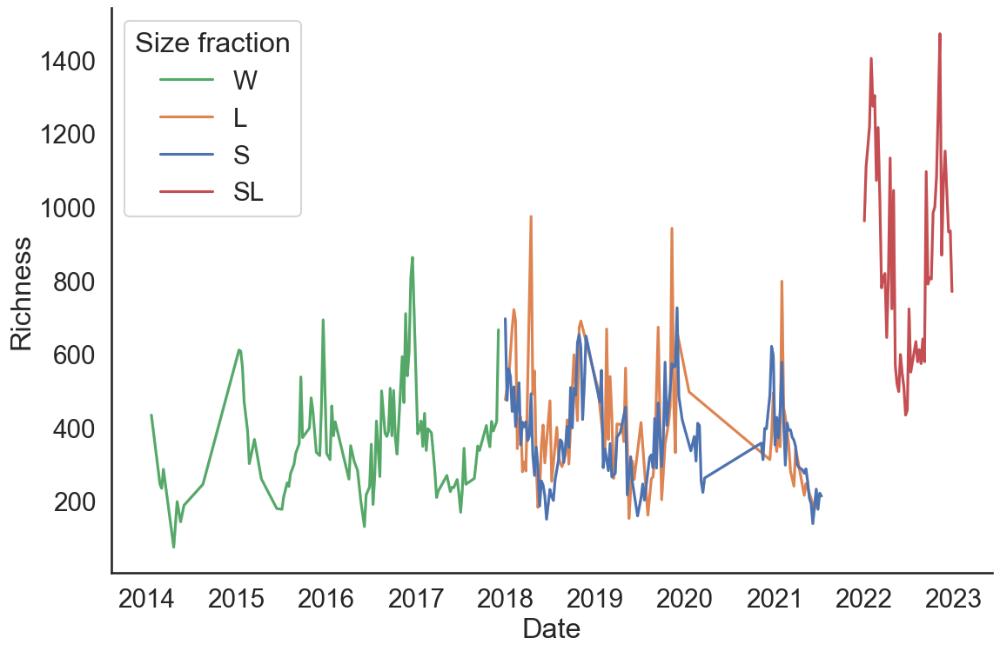

In [460]:
sns.reset_defaults()
sns.set_theme(context="talk", style="white", font_scale=1.3)

plt.figure(figsize=(12, 8))

sns.lineplot(
    data=depth1,
    x='datetime',
    y='nASVs',
    hue='size_code',
    markers=True,
    dashes=False,
    palette=palette_dict
)


sns.despine()
plt.legend(title='Size fraction', loc='upper left')
plt.rc("axes", titlesize=18, labelsize=16)
plt.rc("xtick", labelsize=14)
plt.rc("ytick", labelsize=14)
plt.rc("legend", fontsize=14)
plt.rc("figure", titlesize=20)
plt.xlabel('Date')
plt.ylabel('Richness')
plt.tight_layout()
#plt.savefig('figures/n_of_asvs_depthA_noSL.png', bbox_inches='tight')
plt.show()

let's extract the table and rarefy it in compute canada at 5000, 10000 and 20000
https://docs.alliancecan.ca/wiki/Python#Loading_an_interpreter for instructions on how to run python functions in compute can

In [128]:
newseparated.to_csv('df_with_SL.csv')

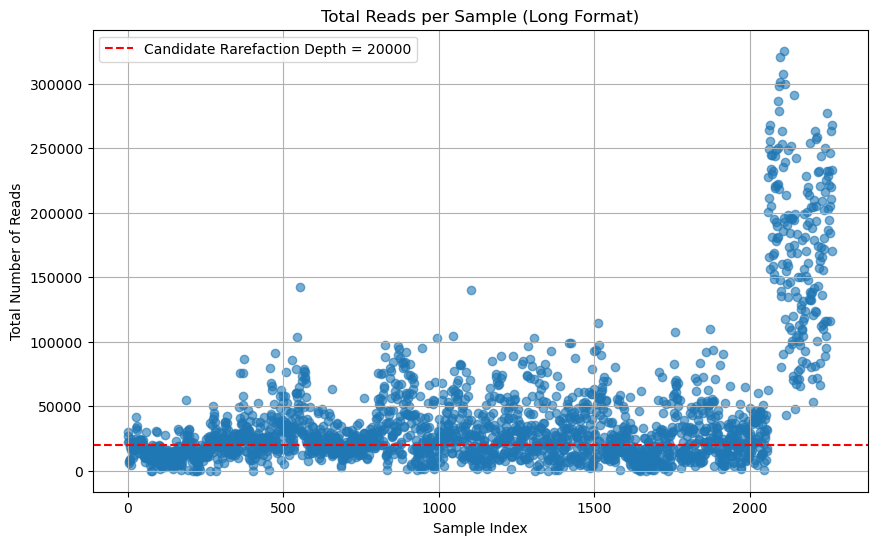

In [129]:
sample_totals = newseparated.groupby('sampleid')['feature_frequency'].sum()

# Plot the total reads per sample
plt.figure(figsize=(10, 6))
plt.scatter(range(len(sample_totals)), sample_totals, alpha=0.6)
plt.xlabel('Sample Index')
plt.ylabel('Total Number of Reads')
plt.title('Total Reads per Sample (Long Format)')
plt.grid(True)

# Set a candidate rarefaction depth (e.g., 20,000 reads)
candidate_depth = 20000
plt.axhline(y=candidate_depth, color='red', linestyle='--', label=f'Candidate Rarefaction Depth = {candidate_depth}')
plt.legend()
plt.show()

In [73]:
rarefied_df = repeat_rarefy_df(newseparated, sampling_depth=5000, repeat_times=100, random_state=42)

Removed 329 samples below the rarefaction depth of 5000.


In [75]:
rarefied_df.to_csv('rarefied_5000.csv')

In [77]:
dfm = rarefied_df.melt(ignore_index=False).reset_index()

In [79]:
dfm= dfm[dfm['value'] != 0]

In [82]:
dfm = dfm.rename(columns={"index":"sampleid", "value":"rarefied_count"})


In [88]:
dfm = dfm.rename(columns={"rarefied_count":"feature_frequency"})

In [105]:
mask = ~separated['size_code'].isin(["W", "P"])
sep_SL = separated.loc[mask].copy()

In [106]:
sample_dna = sep_SL[['sampleid', 'weekn', 'depth', 'year', '[DNA]ng/uL']].drop_duplicates('sampleid')

group_sum = sample_dna.groupby(['year', 'weekn', 'depth'], observed=True)['[DNA]ng/uL'].sum().reset_index()

group_sum.rename(columns={'[DNA]ng/uL': '[DNAt]'}, inplace=True)

sep_SL = sep_SL.merge(group_sum, on=['year', 'weekn', 'depth'], how='left')
sep_SL['DNApr'] = sep_SL['[DNA]ng/uL'] / sep_SL['[DNAt]']

In [107]:
sep_SL = sep_SL.merge(group_sum, on=['year', 'weekn', 'depth'], how='left')

In [108]:
sep_SL['DNApr'] = sep_SL['[DNA]ng/uL'] / sep_SL['[DNAt]']

In [109]:
sep_SL

,sampleid,feature_id,feature_frequency,size_code,depth_code,depth,weekn,Total,ratio,nASVs,weekdepth,avg,diff,year,datetime,[DNA]ng/uL,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species,[DNAt],DNApr
0,BB19.18AS,75ceeaa937c64399438614ca3706cf2a,475.0,S,A,1,18,30588.0,0.015529,464,181,404.590331,59.409669,2019,2019-05-06,18.2,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.00000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,35.1,0.518519
1,BB19.18BL,75ceeaa937c64399438614ca3706cf2a,117.0,L,B,5,18,85128.0,0.001374,477,185,381.110128,95.889872,2019,2019-05-06,21.7,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.00000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,37.8,0.574074
2,BB19.18BS,75ceeaa937c64399438614ca3706cf2a,10572.0,S,B,5,18,21688.0,0.487459,304,185,381.110128,-77.110128,2019,2019-05-06,16.1,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.00000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,37.8,0.425926
3,BB19.18CL,75ceeaa937c64399438614ca3706cf2a,858.0,L,C,10,18,19216.0,0.044650,211,1810,299.416794,-88.416794,2019,2019-05-06,37.5,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.00000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,45.5,0.824176
4,BB19.18CS,75ceeaa937c64399438614ca3706cf2a,6917.0,S,C,10,18,11805.0,0.585938,213,1810,299.416794,-86.416794,2019,2019-05-06,8.0,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.00000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,45.5,0.175824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
416769,BB18.6AL,df3fb7732343cb3de9bae7bfed0e1c4d,1.0,L,A,1,6,26389.0,0.000038,723,61,445.378231,277.621769,2018,2018-02-05,11.8,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,52.1,0.226488
416770,BB18.7CL,68ba1d6dca35badd9b2c6133c2cc3a90,1.0,L,C,10,7,9738.0,0.000103,314,710,365.472200,-51.472200,2018,2018-02-12,9.8,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,33.6,0.291667
416771,BB18.7DL,ca9dca774620a9caebd54483853920b1,1.0,L,D,60,7,20527.0,0.000049,499,760,430.323646,68.676354,2018,2018-02-12,12.1,d__Bacteria; p__Planctomycetota; c__Planctomyc...,0.99999,d__Bacteria,p__Planctomycetota,c__Planctomycetes,o__Pirellulales,f__Pirellulaceae,Unassigned,Unassigned,29.6,0.408784
416772,BB18.8DS,b79a88263ae65bbcfc700a592229c142,1.0,S,D,60,8,66930.0,0.000015,707,860,448.135250,258.864750,2018,2018-02-19,20.7,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,30.8,0.672078


In [109]:
sl_only = newseparated[newseparated['size_code'] == 'SL']
top_rows_sl = sl_only.sort_values(by='datetime', ascending=True).head(10)
top_rows_sl

,sampleid,feature_id,size_code,depth_code,depth,weekn,datetime,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species,DNApr,[DNAt],feature_frequency,Total,ratio,nASVs,weekdepth,avg,diff,year,[DNA]ng/uL,rank,ranktot,shannon_diversity
815631,BB22.1BSL,b8d552c1bbcbfd52c245a1733baf6397,SL,B,5,1,2022-01-03,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,Unassigned,0.258065,18.6,4.129032,623026.388977,0.000007,4849,15,2458.406570,2390.593430,2022,NaN,4022.5,2.791464,10.201447
858262,BB22.1ASL,7c6caf692f6158fa656244f9d6ec015f,SL,A,1,1,2022-01-03,d__Bacteria; p__Proteobacteria; c__Gammaproteo...,0.924718,d__Bacteria,p__Proteobacteria,c__Gammaproteobacteria,o__Alteromonadales,f__Alteromonadaceae,g__Alteromonas,Unassigned,0.245902,24.4,1.475410,850015.033047,0.000002,5777,11,2955.512485,2821.487515,2022,NaN,5524.0,3.378593,10.323984
858261,BB22.1ASL,7c6caf692f6158fa656244f9d6ec015f,SL,A,1,1,2022-01-03,d__Bacteria; p__Proteobacteria; c__Gammaproteo...,0.962860,d__Bacteria,p__Proteobacteria,c__Gammaproteobacteria,o__Enterobacterales,f__Alteromonadaceae,g__Alteromonas,Unassigned,0.245902,24.4,1.475410,850015.033047,0.000002,5777,11,2955.512485,2821.487515,2022,NaN,5524.0,3.378593,10.323984
421153,BB22.1DSL,e03add4a28829427234f61d8fefefdb5,SL,D,60,1,2022-01-03,d__Bacteria; p__Chloroflexi; c__Dehalococcoidi...,0.999699,d__Bacteria,p__Chloroflexi,c__Dehalococcoidia,o__SAR202_clade,f__SAR202_clade,g__SAR202_clade,Unassigned,0.717988,65.6,551.875000,966927.468710,0.000571,4724,160,2440.202208,2283.797792,2022,NaN,300.5,0.200601,8.969261
421152,BB22.1DSL,e03add4a28829427234f61d8fefefdb5,SL,D,60,1,2022-01-03,d__Bacteria; p__Chloroflexi; c__Dehalococcoidi...,0.973517,d__Bacteria,p__Chloroflexi,c__Dehalococcoidia,o__SAR202_clade,f__SAR202_clade,g__SAR202_clade,s__hydrothermal_vent,0.282012,65.6,551.875000,966927.468710,0.000571,4724,160,2440.202208,2283.797792,2022,NaN,300.5,0.200601,8.969261
421151,BB22.1DSL,e03add4a28829427234f61d8fefefdb5,SL,D,60,1,2022-01-03,d__Bacteria; p__Chloroflexi; c__Dehalococcoidi...,0.999699,d__Bacteria,p__Chloroflexi,c__Dehalococcoidia,o__SAR202_clade,f__SAR202_clade,g__SAR202_clade,Unassigned,0.282012,65.6,551.875000,966927.468710,0.000571,4724,160,2440.202208,2283.797792,2022,NaN,300.5,0.200601,8.969261
421150,BB22.1CSL,e03add4a28829427234f61d8fefefdb5,SL,C,10,1,2022-01-03,d__Bacteria; p__Chloroflexi; c__Dehalococcoidi...,0.973517,d__Bacteria,p__Chloroflexi,c__Dehalococcoidia,o__SAR202_clade,f__SAR202_clade,g__SAR202_clade,s__hydrothermal_vent,0.686544,65.4,13.730887,845702.852628,0.000016,5276,110,2682.289460,2593.710540,2022,NaN,3548.5,2.471100,10.227693
421149,BB22.1CSL,e03add4a28829427234f61d8fefefdb5,SL,C,10,1,2022-01-03,d__Bacteria; p__Chloroflexi; c__Dehalococcoidi...,0.999699,d__Bacteria,p__Chloroflexi,c__Dehalococcoidia,o__SAR202_clade,f__SAR202_clade,g__SAR202_clade,Unassigned,0.686544,65.4,13.730887,845702.852628,0.000016,5276,110,2682.289460,2593.710540,2022,NaN,3548.5,2.471100,10.227693
421148,BB22.1BSL,e03add4a28829427234f61d8fefefdb5,SL,B,5,1,2022-01-03,d__Bacteria; p__Chloroflexi; c__Dehalococcoidi...,0.973517,d__Bacteria,p__Chloroflexi,c__Dehalococcoidia,o__SAR202_clade,f__SAR202_clade,g__SAR202_clade,s__hydrothermal_vent,0.859200,62.5,12.028800,623026.388977,0.000019,4849,15,2458.406570,2390.593430,2022,NaN,3134.5,2.175226,10.201447
421147,BB22.1BSL,e03add4a28829427234f61d8fefefdb5,SL,B,5,1,2022-01-03,d__Bacteria; p__Chloroflexi; c__Dehalococcoidi...,0.999699,d__Bacteria,p__Chloroflexi,c__Dehalococcoidia,o__SAR202_clade,f__SAR202_clade,g__SAR202_clade,Unassigned,0.859200,62.5,12.028800,623026.388977,0.000019,4849,15,2458.406570,2390.593430,2022,NaN,3134.5,2.175226,10.201447


In [ ]:
#newseparated = make_defract(all_md, separated)

In [18]:
del df

In [120]:
def make_news_memory_efficient(separated):
    
    # Convert key columns to categorical to save memory
    for col in ['size_code', 'weekn', 'depth', 'year']:
        if separated[col].dtype != 'category':
            separated[col] = separated[col].astype('category')
    
    # Filter rows that are used in subsequent operations and drop unwanted columns early
    mask = ~separated['size_code'].isin(["W", "P"])
    sep_SL = separated.loc[mask].copy()
    
    sample_dna = sep_SL[['sampleid', 'weekn', 'depth', 'year', '[DNA]ng/uL']].drop_duplicates('sampleid')

    group_sum = sample_dna.groupby(['year', 'weekn', 'depth'], observed=True)['[DNA]ng/uL'].sum().reset_index()

    group_sum.rename(columns={'[DNA]ng/uL': '[DNAt]'}, inplace=True)

    sep_SL = sep_SL.merge(group_sum, on=['year', 'weekn', 'depth'], how='left')
    sep_SL['DNApr'] = sep_SL['[DNA]ng/uL'] / sep_SL['[DNAt]']
    
    # Prepare a minimal lookup DataFrame for merging; drop duplicates immediately
    merge_df = sep_SL[['sampleid', 'DNApr', '[DNAt]']].drop_duplicates()
    
    # Free memory from sep_SL if not needed further
    del sep_SL
    
    # Merge back with the original DataFrame using a lightweight lookup table
    sepSLRA = separated.merge(merge_df, on='sampleid', how='left')
    
    # Drop rows not needed and filter further in place
    sepSLRA = sepSLRA.loc[~sepSLRA['size_code'].isin(["W", "P"])].copy()
    
    # Compute corrected feature frequency with groupby, then drop the intermediate column
    sepSLRA['Newfeature_frequency'] = sepSLRA['feature_frequency'] * sepSLRA['DNApr']
    sepSLRA['Newff'] = sepSLRA.groupby(['feature_id', 'weekn', 'depth', 'year'], observed=True)['Newfeature_frequency'].transform('sum')
    
    # Update sampleid and set size_code in one step
    sepSLRA['sampleid'] = (
    "BB" + sepSLRA['year'].astype(str).str[-2:] + "." + 
    sepSLRA['weekn'].astype(str) + 
    sepSLRA['depth_code'] + "SL")
    sepSLRA['size_code'] = 'SL'
    
    # Drop unneeded columns early
    cols_to_drop = ['feature_frequency', 'Total', 'ratio', 'nASVs', 'weekdepth', 'avg', 'year',
                    'diff', '[DNA]ng/uL', 'Newfeature_frequency']
    sepSLRA.drop(columns=cols_to_drop, inplace=True, errors='ignore')
    sepSLRA.rename(columns={'Newff': 'feature_frequency'}, inplace=True)
    sepSLRA.drop_duplicates(inplace=True)
    
    # Calculate totals and ratios in place
    sepSLRA['Total'] = sepSLRA.groupby('sampleid', observed=True)['feature_frequency'].transform('sum')
    sepSLRA['ratio'] = sepSLRA['feature_frequency'] / sepSLRA['Total']
    sepSLRA['nASVs'] = sepSLRA.groupby('sampleid', observed=True)['feature_id'].transform('nunique')
    sepSLRA.drop_duplicates(inplace=True)
    
    # Process other groups; filtering only when needed
    sep_WO = separated.loc[separated['size_code'] == "W"].drop_duplicates().copy()
    sep_PO = separated.loc[separated['size_code'] == "P"].drop_duplicates().copy()
    sep_S  = separated.loc[separated['size_code'] == "S"].copy()
    sep_L  = separated.loc[separated['size_code'] == "L"].copy()
    
    # Reset indices without creating extra copies
    sep_WO.reset_index(drop=True, inplace=True)
    sepSLRA.reset_index(drop=True, inplace=True)
    
    # Concatenate all parts at once
    newseparated = pd.concat([sepSLRA, sep_WO, sep_PO, sep_L, sep_S], ignore_index=True)
    
    # Compute combined columns and group statistics
    newseparated['weekdepth'] = newseparated["weekn"].astype(str) + newseparated["depth"].astype(str)
    newseparated['avg'] = newseparated.groupby('weekdepth', observed=True)['nASVs'].transform('mean')
    newseparated['diff'] = newseparated['nASVs'] - newseparated['avg']
    newseparated["rank"] = newseparated.groupby("sampleid", observed=True)["ratio"].rank(method="average", ascending=False)
    newseparated["ranktot"] = newseparated['rank'] / newseparated['nASVs']
    
    # Calculate shannon diversity index per sample (assuming shannon is defined)
    diversity = newseparated.groupby('sampleid', observed=True)['feature_frequency'].apply(lambda freqs: shannon(freqs))
    newseparated['shannon_diversity'] = newseparated['sampleid'].map(diversity)
    
    # For DNA concentration in SL, compute and merge as needed
    cleaned_data = newseparated.drop_duplicates(subset=["weekn", "depth", 'year', "size_code", "[DNA]ng/uL"])
    sl_fill_values = (
        cleaned_data.loc[cleaned_data["size_code"].isin(["S", "L"])]
        .groupby(["weekn", "depth", 'year'], observed=True)["[DNA]ng/uL"]
        .sum()
        .reset_index()
    )
    sl_fill_values["size_code"] = "SL"
    
    newseparated = newseparated.merge(
        sl_fill_values,
        on=["weekn", "depth", 'year', "size_code"],
        how="left",
        suffixes=('', '_fill')
    )
    newseparated.loc[newseparated["[DNA]ng/uL"].isna(), "[DNA]ng/uL"] = newseparated.loc[newseparated["[DNA]ng/uL"].isna(), "[DNA]ng/uL_fill"]
    newseparated.drop(columns=["[DNA]ng/uL_fill"], inplace=True)
    
    return newseparated

In [416]:
newseparated = make_news_memory_efficient(separated)

In [417]:
newseparated

,sampleid,feature_id,size_code,depth_code,depth,weekn,datetime,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species,DNApr,[DNAt],feature_frequency,Total,ratio,nASVs,weekdepth,avg,diff,year,[DNA]ng/uL,rank,ranktot,shannon_diversity
0,BB22.18ASL,75ceeaa937c64399438614ca3706cf2a,SL,A,1,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.518519,35.1,246.296296,222269.539190,0.001108,1469,181,869.375560,599.624440,NaN,NaN,191.0,0.130020,8.757472
1,BB22.18BSL,75ceeaa937c64399438614ca3706cf2a,SL,B,5,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.574074,37.8,4570.055556,250615.859519,0.018235,1308,185,780.497482,527.502518,NaN,NaN,3.5,0.002676,8.491775
2,BB22.18BSL,75ceeaa937c64399438614ca3706cf2a,SL,B,5,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.425926,37.8,4570.055556,250615.859519,0.018235,1308,185,780.497482,527.502518,NaN,NaN,3.5,0.002676,8.491775
3,BB22.18CSL,75ceeaa937c64399438614ca3706cf2a,SL,C,10,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.824176,45.5,1923.318681,181488.024830,0.010597,1002,1810,588.251292,413.748708,NaN,NaN,13.5,0.013473,8.220470
4,BB22.18CSL,75ceeaa937c64399438614ca3706cf2a,SL,C,10,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.175824,45.5,1923.318681,181488.024830,0.010597,1002,1810,588.251292,413.748708,NaN,NaN,13.5,0.013473,8.220470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072833,BB18.47BS,cd1c78b74af80f29c42521cc5560532a,S,B,5,47,2018-11-19,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,26567.000000,0.000038,487,475,826.008729,-339.008729,2018,24.2,483.5,0.992813,7.227867
1072834,BB18.48AS,c6df4cd74a21372a43bf3b4a3b4e5ef8,S,A,1,48,2018-11-26,d__Bacteria; p__Proteobacteria; c__Gammaproteo...,0.737806,d__Bacteria,p__Proteobacteria,c__Gammaproteobacteria,o__Enterobacterales,f__Yersiniaceae,g__Serratia,Unassigned,NaN,NaN,1.000000,44691.000000,0.000022,670,481,966.594962,-296.594962,2018,25.2,666.5,0.994776,7.549046
1072835,BB18.5DS,9ccbc4dd1d0b20027261de36938930e6,S,D,60,5,2018-01-29,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,84946.000000,0.000012,725,560,826.428390,-101.428390,2018,24.2,721.0,0.994483,6.608167
1072836,BB18.8DS,b79a88263ae65bbcfc700a592229c142,S,D,60,8,2018-02-19,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,66930.000000,0.000015,707,860,980.103193,-273.103193,2018,20.7,704.0,0.995757,7.051237


In [418]:
newseparated.to_csv('newseparated_SL.csv', index=False)

In [407]:
# Convert key columns to categorical to save memory
for col in ['size_code', 'weekn', 'depth', 'year']:
    if separated[col].dtype != 'category':
        separated[col] = separated[col].astype('category')

# Filter rows that are used in subsequent operations and drop unwanted columns early
mask = ~separated['size_code'].isin(["W", "P"])
sep_SL = separated.loc[mask].copy()

# Compute the total DNA sum per group; use in-place assignment to save memory
sep_SL['[DNAt]'] = sep_SL.groupby(['weekn', 'depth', 'year'], observed=True)['[DNA]ng/uL'].transform('sum')
sep_SL['DNApr'] = sep_SL['[DNA]ng/uL'] / sep_SL['[DNAt]']

# Prepare a minimal lookup DataFrame for merging; drop duplicates immediately
merge_df = sep_SL[['sampleid', 'DNApr', '[DNAt]']].drop_duplicates()

# Free memory from sep_SL if not needed further
del sep_SL

In [408]:
# Merge back with the original DataFrame using a lightweight lookup table
sepSLRA = separated.merge(merge_df, on='sampleid', how='left')

# Drop rows not needed and filter further in place
sepSLRA = sepSLRA.loc[~sepSLRA['size_code'].isin(["W", "P"])].copy()

# Compute corrected feature frequency with groupby, then drop the intermediate column
sepSLRA['Newfeature_frequency'] = sepSLRA['feature_frequency'] * sepSLRA['DNApr']
sepSLRA['Newff'] = sepSLRA.groupby(['feature_id', 'weekn', 'depth', 'year'], observed=True)['Newfeature_frequency'].transform('sum')

In [409]:
# Update sampleid and set size_code in one step
sepSLRA['sampleid'] = (
    "BB" 
    + sepSLRA['year'].astype(str).str[-2:] 
    + "." 
    + sepSLRA['weekn'].astype(str) 
    + sepSLRA['depth_code'] 
    + "SL"
)
sepSLRA['size_code'] = 'SL'

# Drop unneeded columns early
cols_to_drop = ['feature_frequency', 'Total', 'ratio', 'nASVs', 'weekdepth', 'avg',
                'diff', '[DNA]ng/uL', 'Newfeature_frequency', 'year']
sepSLRA.drop(columns=cols_to_drop, inplace=True, errors='ignore')
sepSLRA.rename(columns={'Newff': 'feature_frequency'}, inplace=True)
sepSLRA.drop_duplicates(inplace=True)

In [410]:
# Calculate totals and ratios in place
sepSLRA['Total'] = sepSLRA.groupby('sampleid', observed=True)['feature_frequency'].transform('sum')
sepSLRA['ratio'] = sepSLRA['feature_frequency'] / sepSLRA['Total']
sepSLRA['nASVs'] = sepSLRA.groupby('sampleid', observed=True)['feature_id'].transform('nunique')
sepSLRA.drop_duplicates(inplace=True)

# Process other groups; filtering only when needed
sep_WO = separated.loc[separated['size_code'] == "W"].drop_duplicates().copy()
sep_PO = separated.loc[separated['size_code'] == "P"].drop_duplicates().copy()
sep_S  = separated.loc[separated['size_code'] == "S"].copy()
sep_L  = separated.loc[separated['size_code'] == "L"].copy()

In [411]:
# Reset indices without creating extra copies
sep_WO.reset_index(drop=True, inplace=True)
sepSLRA.reset_index(drop=True, inplace=True)

# Concatenate all parts at once
newseparated = pd.concat([sepSLRA, sep_WO, sep_PO, sep_L, sep_S], ignore_index=True)

In [412]:
# Compute combined columns and group statistics
newseparated['weekdepthyr'] = newseparated["weekn"].astype(str) + newseparated["depth"].astype(str) + newseparated["year"].astype(str)
newseparated['avg'] = newseparated.groupby('weekdepthyr', observed=True)['nASVs'].transform('mean')
newseparated['diff'] = newseparated['nASVs'] - newseparated['avg']
newseparated["rank"] = newseparated.groupby("sampleid", observed=True)["ratio"].rank(method="average", ascending=False)
newseparated["ranktot"] = newseparated['rank'] / newseparated['nASVs']

# Calculate shannon diversity index per sample (assuming shannon is defined)
diversity = newseparated.groupby('sampleid', observed=True)['feature_frequency'].apply(lambda freqs: shannon(freqs))
newseparated['shannon_diversity'] = newseparated['sampleid'].map(diversity)

In [413]:
# For DNA concentration in SL, compute and merge as needed
cleaned_data = newseparated.drop_duplicates(subset=["weekn", "depth", "year","size_code", "[DNA]ng/uL"])
sl_fill_values = (
    cleaned_data.loc[cleaned_data["size_code"].isin(["S", "L"])]
    .groupby(["weekn", "depth", "year"], observed=True)["[DNA]ng/uL"]
    .sum()
    .reset_index()
)
sl_fill_values["size_code"] = "SL"

newseparated = newseparated.merge(
    sl_fill_values,
    on=["weekn", "depth", "year", "size_code"],
    how="left",
    suffixes=('', '_fill')
)
newseparated.loc[newseparated["[DNA]ng/uL"].isna(), "[DNA]ng/uL"] = newseparated.loc[newseparated["[DNA]ng/uL"].isna(), "[DNA]ng/uL_fill"]
newseparated.drop(columns=["[DNA]ng/uL_fill"], inplace=True)

In [414]:
newseparated

,sampleid,feature_id,size_code,depth_code,depth,weekn,datetime,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species,DNApr,[DNAt],feature_frequency,Total,ratio,nASVs,weekdepth,avg,diff,year,[DNA]ng/uL,weekdepthyr,rank,ranktot,shannon_diversity
0,BB19.18ASL,75ceeaa937c64399438614ca3706cf2a,SL,A,1,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.000946,19243.9,0.449233,181.521313,0.002475,890,NaN,716.312269,173.687731,NaN,NaN,181nan,85.0,0.095506,7.668060
1,BB19.18BSL,75ceeaa937c64399438614ca3706cf2a,SL,B,5,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.001423,15245.3,11.331237,263.327885,0.043031,648,NaN,648.507359,-0.507359,NaN,NaN,185nan,1.5,0.002315,6.606150
2,BB19.18BSL,75ceeaa937c64399438614ca3706cf2a,SL,B,5,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.001056,15245.3,11.331237,263.327885,0.043031,648,NaN,648.507359,-0.507359,NaN,NaN,185nan,1.5,0.002315,6.606150
3,BB19.18CSL,75ceeaa937c64399438614ca3706cf2a,SL,C,10,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.003900,9616.5,9.100088,157.011283,0.057958,342,NaN,527.674139,-185.674139,NaN,NaN,1810nan,1.5,0.004386,6.283266
4,BB19.18CSL,75ceeaa937c64399438614ca3706cf2a,SL,C,10,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.000832,9616.5,9.100088,157.011283,0.057958,342,NaN,527.674139,-185.674139,NaN,NaN,1810nan,1.5,0.004386,6.283266
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072833,BB18.47BS,cd1c78b74af80f29c42521cc5560532a,S,B,5,47,2018-11-19,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,26567.000000,0.000038,487,475,408.450667,78.549333,2018,24.2,4752018,483.5,0.992813,7.227867
1072834,BB18.48AS,c6df4cd74a21372a43bf3b4a3b4e5ef8,S,A,1,48,2018-11-26,d__Bacteria; p__Proteobacteria; c__Gammaproteo...,0.737806,d__Bacteria,p__Proteobacteria,c__Gammaproteobacteria,o__Enterobacterales,f__Yersiniaceae,g__Serratia,Unassigned,NaN,NaN,1.000000,44691.000000,0.000022,670,481,612.605938,57.394062,2018,25.2,4812018,666.5,0.994776,7.549046
1072835,BB18.5DS,9ccbc4dd1d0b20027261de36938930e6,S,D,60,5,2018-01-29,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,84946.000000,0.000012,725,560,608.942959,116.057041,2018,24.2,5602018,721.0,0.994483,6.608167
1072836,BB18.8DS,b79a88263ae65bbcfc700a592229c142,S,D,60,8,2018-02-19,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,66930.000000,0.000015,707,860,589.776119,117.223881,2018,20.7,8602018,704.0,0.995757,7.051237


In [99]:
#verify if any of the samples are empty (i.e. failed)
tiprob = separated[separated['feature_id'].isnull()]
tiprob['sampleid'].unique()

array([], dtype=object)

In [31]:
plot_adiv(newseparated, 1)

KeyError: "['month', 'day', 'season', 'time_string_x', 'time_string', 'temperature', 'Chlorophyll A', 'date'] not in index"

In [37]:
newseparated

,sampleid,feature_id,year,size_code,depth_code,depth,weekn,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species,DNApr,[DNAt],feature_frequency,Total,ratio,nASVs,weekdepth,avg,diff,[DNA]ng/uL,rank,ranktot,shannon_diversity
0,BB22.18ASL,75ceeaa937c64399438614ca3706cf2a,2019,SL,A,1,18,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.000246,73841.5,0.156973,516.510225,0.000304,1469,18.01,869.375560,599.624440,224.1,451.0,0.307012,8.691805
1,BB22.18BSL,75ceeaa937c64399438614ca3706cf2a,2019,SL,B,5,18,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.000379,57206.7,3.624755,585.503798,0.006191,1308,18.05,780.497482,527.502518,161.6,30.5,0.023318,8.738391
2,BB22.18BSL,75ceeaa937c64399438614ca3706cf2a,2019,SL,B,5,18,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.000281,57206.7,3.624755,585.503798,0.006191,1308,18.05,780.497482,527.502518,161.6,30.5,0.023318,8.738391
3,BB22.18CSL,75ceeaa937c64399438614ca3706cf2a,2019,SL,C,10,18,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.000866,43297.1,2.138527,533.565232,0.004008,1002,18.010,588.251292,413.748708,143.4,64.5,0.064371,8.341248
4,BB22.18CSL,75ceeaa937c64399438614ca3706cf2a,2019,SL,C,10,18,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.000185,43297.1,2.138527,533.565232,0.004008,1002,18.010,588.251292,413.748708,143.4,64.5,0.064371,8.341248
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043136,BB18.47BS,cd1c78b74af80f29c42521cc5560532a,2018,S,B,5,47,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,26567.000000,0.000038,487,47.05,826.008729,-339.008729,24.2,483.5,0.992813,7.227867
1043137,BB18.48AS,c6df4cd74a21372a43bf3b4a3b4e5ef8,2018,S,A,1,48,d__Bacteria; p__Proteobacteria; c__Gammaproteo...,0.737806,d__Bacteria,p__Proteobacteria,c__Gammaproteobacteria,o__Enterobacterales,f__Yersiniaceae,g__Serratia,Unassigned,NaN,NaN,1.000000,44691.000000,0.000022,670,48.01,966.594962,-296.594962,25.2,666.5,0.994776,7.549046
1043138,BB18.5DS,9ccbc4dd1d0b20027261de36938930e6,2018,S,D,60,5,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,84946.000000,0.000012,725,5.060,826.428390,-101.428390,24.2,721.0,0.994483,6.608167
1043139,BB18.8DS,b79a88263ae65bbcfc700a592229c142,2018,S,D,60,8,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,66930.000000,0.000015,707,8.060,980.103193,-273.103193,20.7,704.0,0.995757,7.051237


In [38]:
for df in [newseparated]:
    df["weekn"] = df["sampleid"].str.extract(r'\.([1-9][0-9]?)[A-E]')
    df['sampleid'] = df['sampleid'].str.replace(r'\.0', '', regex=True)
    df['sampleid'] = df['sampleid'].str.replace('.a', '.', regex=False)
    df["weekn"] = df["sampleid"].str.extract(r'\.([1-9][0-9]?)[A-E]')
    df_weekn_nan = df[df['weekn'].isna()]

In [39]:
df_weekn_nan['sampleid'].unique()

array(['BB22.nanDSL', 'BB22.nanASL', 'BB22.nanBSL', 'BB22.nanCSL'],
      dtype=object)

In [41]:
newseparated = newseparated.dropna(subset=['weekn'])

In [42]:
def adiv_plots(df_clean):
    #drop any null rows
    df_clean = df_clean.dropna(subset=['feature_id'])

    #make sure the feature asv count per sample is accurate
    df_clean['unique_feature_count'] = df_clean.groupby('sampleid')['feature_id'].transform('nunique')
    # for plotting make datetime:
    df_clean["weekn"] = df_clean["sampleid"].str.extract(r'\.([1-9][0-9]?)[A-E]')
    df_clean['datetime'] = pd.to_datetime(
        df_clean['year'].astype(str) + '-W' + df_clean['weekn'].astype(int).astype(str) + '-1',
        format='%Y-W%W-%w'
    )
    df_clean = df_clean[df_clean.depth == 1]

    ts_data = df_clean.groupby(['datetime', 'depth_code', 'size_code'])['feature_id'].nunique().reset_index(name='unique_feature_count')
    plt.figure(figsize=(12, 6))
    sns.lineplot(
        data=ts_data,
        x='datetime',
        y='unique_feature_count',
        hue='size_code',
        markers=True,
        dashes=False
    )

    plt.xlabel('Date')
    plt.ylabel('nASVs')
    plt.tight_layout()
    plt.show()

In [46]:
newseparated["weekn"] = newseparated["sampleid"].str.extract(r'\.([1-9][0-9]?)[A-E]')
newseparated['datetime'] = pd.to_datetime(
    newseparated['year'].astype(str) + '-W' + newseparated['weekn'].astype(int).astype(str) + '-1',
    format='%Y-W%W-%w'
)

/var/folders/kv/yq6jygk116l27q2bwnk25k0w0000gn/T/ipykernel_3197/2905585323.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/kv/yq6jygk116l27q2bwnk25k0w0000gn/T/ipykernel_3197/2905585323.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [100]:
depth1 = newdf[newdf.depth == 1]

In [103]:
depth1SL = depth1[depth1.size_code == 'W']

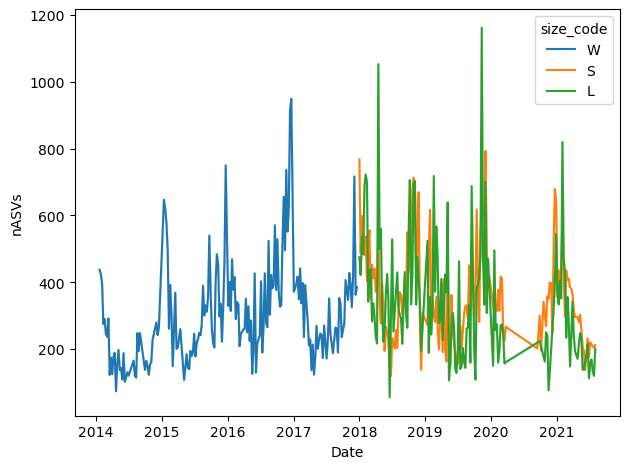

In [105]:
sns.lineplot(
    data=depth1,
    x='datetime',
    y='nASVs',
    hue='size_code',
    markers=True,
    dashes=False
)

plt.xlabel('Date')
plt.ylabel('nASVs')
plt.tight_layout()
plt.show()

In [50]:
#find the missing SL files, and why?
groups = depth1.groupby(['year', 'weekn'])

missing_SL = [
    group_name 
    for group_name, group in groups 
    if group['size_code'].isin(['S', 'L']).any() and not group['size_code'].eq('SL').any()
]

missing_SL_df = pd.DataFrame(missing_SL, columns=['year', 'weekn'])
print(missing_SL_df)

    year weekn
0   2019    27
1   2019    28
2   2019    29
3   2019    30
4   2019    31
..   ...   ...
12  2019    39
13  2019    40
14  2019    41
15  2019    42
16  2019    43

[17 rows x 2 columns]


In [61]:
separated['weekn'] = pd.to_numeric(separated['weekn'])

In [67]:
filtered = separated.loc[
    (separated['year'] == '2019'),
    ['sampleid', '[DNA]ng/uL', 'weekn']
]
filtered['weekn'].unique()

array([18., 19., 20., 21., 22., 23., 24., 26., 44., 46., 47., nan, 10.,
       11., 12., 13., 14., 15., 16., 17.,  2.,  3.,  4.,  5.,  6.,  7.,
        8.,  9., 25., 45., 48., 49., 50., 51.])

In [63]:
separated

,sampleid,feature_id,feature_frequency,year,size_code,depth_code,depth,weekn,Total,ratio,nASVs,weekdepth,avg,diff,[DNA]ng/uL,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species
0,BB14.10A,df29deb0aff9e983f503e7471e71f4ec,3295.0,2014,W,A,1,10.0,30101.0,0.109465,292,10.01,347.243346,-55.243346,4.5,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.945295,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Sulfitobacter,Unassigned
1,BB14.10B,df29deb0aff9e983f503e7471e71f4ec,4254.0,2014,W,B,5,10.0,27296.0,0.155847,285,10.05,320.359042,-35.359042,3.8,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.945295,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Sulfitobacter,Unassigned
2,BB14.10C,df29deb0aff9e983f503e7471e71f4ec,3931.0,2014,W,C,10,10.0,22612.0,0.173846,256,10.010,304.737695,-48.737695,2.9,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.945295,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Sulfitobacter,Unassigned
3,BB14.10D,df29deb0aff9e983f503e7471e71f4ec,654.0,2014,W,D,60,10.0,22063.0,0.029642,364,10.060,420.329776,-56.329776,3.7,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.945295,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Sulfitobacter,Unassigned
4,BB14.11A,df29deb0aff9e983f503e7471e71f4ec,585.0,2014,W,A,1,11.0,5771.0,0.101369,123,11.01,303.271335,-180.271335,3.4,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.945295,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rhodobacterales,f__Rhodobacteraceae,g__Sulfitobacter,Unassigned
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
656208,BB16.51A,c8c7844e0054e3c5c4e806c7e002fd67,1.0,2016,W,A,1,51.0,72687.0,0.000014,949,51.01,609.610425,339.389575,14.3,d__Bacteria; p__Firmicutes; c__Clostridia; o__...,0.964142,d__Bacteria,p__Firmicutes,c__Clostridia,o__Lachnospirales,f__Lachnospiraceae,g__Blautia,Unassigned
656209,BB16.51A,798d78f37dc777bf25d384de54157806,1.0,2016,W,A,1,51.0,72687.0,0.000014,949,51.01,609.610425,339.389575,14.3,d__Bacteria; p__Proteobacteria; c__Gammaproteo...,0.740310,d__Bacteria,p__Proteobacteria,c__Gammaproteobacteria,o__Aeromonadales,f__Aeromonadaceae,g__Aeromonas,Unassigned
656210,BB16.51D,533452b626d38498d9846e0c614206c0,1.0,2016,W,D,60,51.0,68282.0,0.000015,746,51.060,509.423419,236.576581,18.3,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned
656211,BB16.51D,c7c37ee82988c77d5ac0e4e14c907c6a,1.0,2016,W,D,60,51.0,68282.0,0.000015,746,51.060,509.423419,236.576581,18.3,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.999973,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Sphingomonadales,f__Sphingomonadaceae,Unassigned,Unassigned


In [45]:
newseparated.loc[newseparated['nASVs'].isna(), 'sampleid']

Series([], Name: sampleid, dtype: object)

In [100]:
adiv_plots(newseparated)

NameError: name 'adiv_plots' is not defined

In [ ]:
def repeat_rarefaction(df, sample_col='sampleid', feature_col='feature_id', count_col='feature_frequency', depth=20000, repeats=100, random_state=None):
    """
    Perform repeat-rarefaction on a long-format DataFrame.
    
    Parameters:
      df: long-format DataFrame.
      sample_col: column name for sample IDs.
      feature_col: column name for feature IDs.
      count_col: column name for counts.
      depth: rarefaction depth.
      repeats: number of rarefaction iterations.
      random_state: optional random seed.
      
    Returns:
      A DataFrame of the average rarefied counts (samples x features) across repeats.
    """
    df_wide = df.pivot_table(index=sample_col, columns=feature_col, values=count_col, fill_value=0)
    
    all_reps = []
    for i in range(repeats):
        # Optionally vary the random seed for each repeat.
        rep = df_wide.apply(lambda row: rarefy_sample(row.values, depth, random_state=(random_state+i if random_state is not None else None)), axis=1)
        all_reps.append(rep)
    
    # Convert each replicate (a DataFrame) into a list and then average across replicates.
    rep_dfs = [pd.DataFrame(list(rep), index=df_wide.index, columns=df_wide.columns) for rep in all_reps]
    mean_rarefied = sum(rep_dfs) / repeats
    return mean_rarefied

# Example usage:
# mean_rarefied_df = repeat_rarefaction(your_df, sample_col='sampleid', feature_col='feature_id',
#                                       count_col='feature_frequency', depth=20000, repeats=100, random_state=42)

In [407]:
df_y = df_clean[df_clean['year']== '2019']
#df_y = df_y[df_y['size_code']== 'S']
#df_y = df_y[df_y['depth_code']== 'A']

In [101]:
df_clean["weekn"] = pd.to_numeric(df_clean["weekn"])
df_y = df_clean[df_clean['weekn'] > 30]
## ADD REPEAT RAREFY STEP!
ts_data = df_y.groupby(['datetime', 'year', 'weekn', 'depth_code', 'size_code'])['feature_id'].nunique().reset_index(name='unique_feature_count')
sns.lineplot(
    data=ts_data,
    x='weekn',
    y='unique_feature_count',
    hue='year'
)

plt.ylabel('nASVs')
plt.axvline(x=36.5, color='r', linestyle='--')
plt.tight_layout()
plt.show()

NameError: name 'df_clean' is not defined

In [307]:
df_clean["year"] = '20' + df_clean["sampleid"].str.extract(r'BB(\d{2})(?=\.)')
df_clean["depth_code"] = df_clean["sampleid"].str.extract(r'[1-9][0-9]?([A-E])')
df_clean['depth']= df_clean['depth_code'].map(depth_num)

In [171]:
from skbio.stats.composition import multiplicative_replacement, clr
from skbio.stats.distance import DistanceMatrix
from scipy.spatial.distance import pdist, squareform

In [402]:
df_y = df_clean[df_clean['year']== '2019']
df_y = df_y[df_y['size_code']== 'L']
df_y = df_y[df_y['depth_code']== 'A']

In [298]:
#first move your df to samples x features (filled with f frequency)
df_wide = df_y.pivot_table(
    index='sampleid',
    columns='feature_id',
    values='feature_frequency',
    fill_value=0
)

In [299]:
#extract the data for CLR transformation
data = df_wide.values
#add value to 0 for transformation
data_replaced = multiplicative_replacement(data)

#transform the data
data_clr = clr(data_replaced)

#this the new data in a clrtransformation
df_clr = pd.DataFrame(data_clr, index=df_wide.index, columns=df_wide.columns)

ZeroDivisionError: float division by zero

In [264]:
#calculate euclidean distances for clr transformed
euclidean_dists = squareform(pdist(df_clr.values, metric='euclidean'))
dist_matrix = DistanceMatrix(euclidean_dists, ids=df_clr.index)

In [232]:
#calculate betadiv with bray curtis if data is not clr transformed
from skbio.diversity import beta_diversity
dist_matrix = beta_diversity(
    metric='braycurtis',
    counts=df_wide.values,
    ids=df_wide.index
)

In [265]:
dist_df = dist_matrix.to_data_frame()

#reformat the df to a column format so each pair of column (sample against sample) has its distance value
dist_long = dist_df.reset_index().melt(
    id_vars='index',
    var_name='sample2',
    value_name='distance'
)
dist_long.rename(columns={'index': 'sample1'}, inplace=True)
dist_long = dist_long.query("sample1 != sample2").copy() #remove sample against themselves (diagonale)

In [266]:
#extract only the weekn from the original dataframe so we can compare consecutive weeks
metadata_df = df_y[['sampleid', 'weekn']].drop_duplicates()

#add the appropriate weekn to the samples (left column)
dist_long = dist_long.merge(
    metadata_df.rename(columns={'sampleid': 'sample1', 'weekn': 'week1'}),
    on='sample1', 
    how='left'
)

#add the appropriate weekn to the sample being compared with the left column
dist_long = dist_long.merge(
    metadata_df.rename(columns={'sampleid': 'sample2', 'weekn': 'week2'}),
    on='sample2', 
    how='left'
)

In [267]:
#make sure they are NUMERICAL so the plot is en ordre chronologique
dist_long['week1'] = pd.to_numeric(dist_long['week1'], errors='coerce')
dist_long['week2'] = pd.to_numeric(dist_long['week2'], errors='coerce')

In [268]:
#here we filter all the distance so we only keep consecutive comparisons
#(i.e. compare week 1 with week 2, week 2 with 3, etc.)
dist_consecutive = dist_long.loc[dist_long['week2'] == dist_long['week1'] + 1].copy()

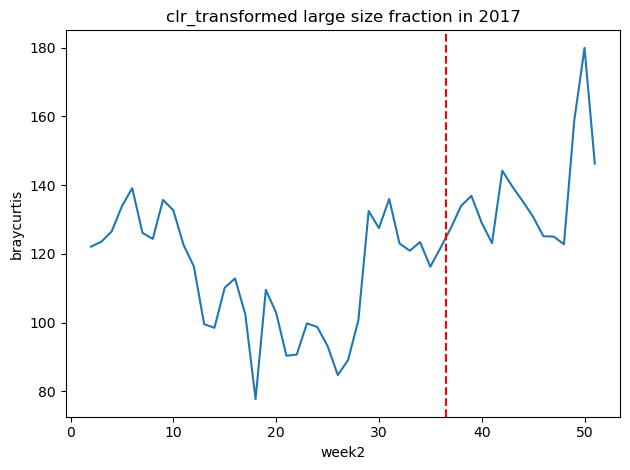

In [270]:
#plot the consecutive distances
sns.lineplot(data=dist_consecutive, x="week2", y="distance", markers=True)
plt.title('clr_transformed large size fraction in 2017')
plt.tight_layout()
plt.axvline(x=36.5, color='r', linestyle='--')
plt.show()

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.composition import multiplicative_replacement, clr
from skbio.stats.distance import DistanceMatrix
from scipy.spatial.distance import pdist, squareform
from skbio.diversity import beta_diversity

# Filter the dataframe in a single step
df_y = newseparated.query("year == '2019' and size_code == 'SL' and depth_code == 'A'")

# Pivot the data to have samples x features
df_wide = df_y.pivot_table(
    index='sampleid',
    columns='feature_id',
    values='feature_frequency',
    fill_value=0
)

# Replace zeros for the CLR transformation
data_replaced = multiplicative_replacement(df_wide.values)
data_clr = clr(data_replaced)
df_clr = pd.DataFrame(data_clr, index=df_wide.index, columns=df_wide.columns)

# Choose the distance metric to use: 'euclidean' for CLR data or 'braycurtis' for raw counts.
metric = 'euclidean'  # change to 'braycurtis' if preferred

if metric == 'euclidean':
    # Compute Euclidean distances on CLR-transformed data
    dists = squareform(pdist(df_clr.values, metric='euclidean'))
    dist_ids = df_clr.index
else:
    # Compute Bray-Curtis distances on the raw count data
    bc_dm = beta_diversity(metric='braycurtis', counts=df_wide.values, ids=df_wide.index)
    dists = bc_dm.data
    dist_ids = bc_dm.ids

# Create a distance matrix and convert it to a DataFrame
dist_matrix = DistanceMatrix(dists, ids=dist_ids)
dist_df = dist_matrix.to_data_frame()

# Convert the square distance matrix to a long format DataFrame
dist_long = dist_df.reset_index().melt(
    id_vars='index', var_name='sample2', value_name='distance'
)
dist_long.rename(columns={'index': 'sample1'}, inplace=True)
dist_long = dist_long[dist_long['sample1'] != dist_long['sample2']].copy()  # remove self-comparisons

# Extract week information from metadata and merge
metadata_df = df_y[['sampleid', 'weekn']].drop_duplicates()
dist_long = dist_long.merge(
    metadata_df.rename(columns={'sampleid': 'sample1', 'weekn': 'week1'}),
    on='sample1', how='left'
).merge(
    metadata_df.rename(columns={'sampleid': 'sample2', 'weekn': 'week2'}),
    on='sample2', how='left'
)

# Ensure week numbers are numeric for proper sorting
dist_long['week1'] = pd.to_numeric(dist_long['week1'], errors='coerce')
dist_long['week2'] = pd.to_numeric(dist_long['week2'], errors='coerce')

# Filter to keep only consecutive week comparisons (week2 = week1 + 1)
dist_consecutive = dist_long[dist_long['week2'] == dist_long['week1'] + 1].copy()

# Normalize the distance metric to the interval [-1, 1]
min_d = dist_consecutive['distance'].min()
max_d = dist_consecutive['distance'].max()
dist_consecutive['norm_distance'] = 2 * (dist_consecutive['distance'] - min_d) / (max_d - min_d) - 1

ZeroDivisionError: float division by zero

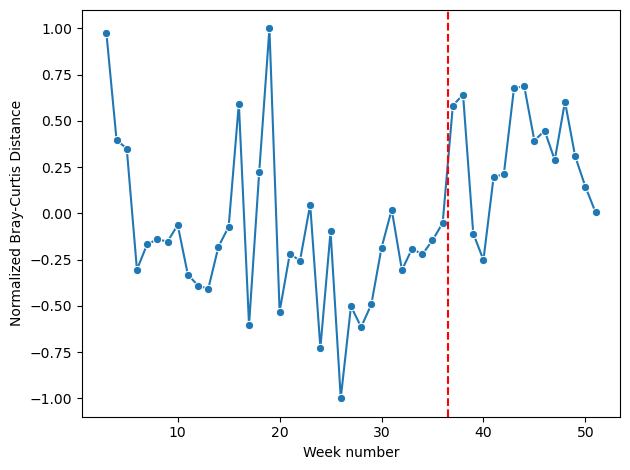

In [154]:
# Plot the normalized consecutive distances
sns.lineplot(data=dist_consecutive, x="week2", y="norm_distance", marker="o")
plt.axvline(x=36.5, color='r', linestyle='--')

plt.xlabel('Week number')
plt.ylabel('Normalized Bray-Curtis Distance')
plt.tight_layout()
plt.savefig('figures/norm_BC_depthA_SL_2019.png', bbox_inches='tight')
plt.show()

In [246]:
newseparated["weekn"] = newseparated["sampleid"].str.extract(r'\.([1-9][0-9]?)[A-E]')
newseparated["year"] = '20' + newseparated["sampleid"].str.extract(r'BB(\d{2})(?=\.)')
newseparated['datetime'] = pd.to_datetime(
newseparated['year'].astype(str) + '-W' + newseparated['weekn'].astype(int).astype(str) + '-1',
format='%Y-W%W-%w')

In [263]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.composition import multiplicative_replacement, clr
from skbio.stats.distance import DistanceMatrix
from scipy.spatial.distance import pdist, squareform
from skbio.diversity import beta_diversity

# Filter the dataframe in a single step
df_y = newseparated.query("year == '2019' and size_code == 'SL' and depth_code == 'A'")

# Pivot the data to have samples x features
df_wide = df_y.pivot_table(
    index='sampleid',
    columns='feature_id',
    values='feature_frequency',
    fill_value=0
)

# Replace zeros for the CLR transformation
data_replaced = multiplicative_replacement(df_wide.values)
data_clr = clr(data_replaced)
df_clr = pd.DataFrame(data_clr, index=df_wide.index, columns=df_wide.columns)

# Choose the distance metric to use: 'euclidean' for CLR data or 'braycurtis' for raw counts.
metric = 'euclidean'  # change to 'braycurtis' if preferred

if metric == 'euclidean':
    # Compute Euclidean distances on CLR-transformed data
    dists = squareform(pdist(df_clr.values, metric='euclidean'))
    dist_ids = df_clr.index
else:
    # Compute Bray-Curtis distances on the raw count data
    bc_dm = beta_diversity(metric='braycurtis', counts=df_wide.values, ids=df_wide.index)
    dists = bc_dm.data
    dist_ids = bc_dm.ids

# Create a distance matrix and convert it to a DataFrame
dist_matrix = DistanceMatrix(dists, ids=dist_ids)
dist_df = dist_matrix.to_data_frame()

# Convert the square distance matrix to a long format DataFrame
dist_long = dist_df.reset_index().melt(
    id_vars='index', var_name='sample2', value_name='distance'
)
dist_long.rename(columns={'index': 'sample1'}, inplace=True)
dist_long = dist_long[dist_long['sample1'] != dist_long['sample2']].copy()  # remove self-comparisons

# Extract week information from metadata and merge
metadata_df = df_y[['sampleid', 'weekn']].drop_duplicates()
dist_long = dist_long.merge(
    metadata_df.rename(columns={'sampleid': 'sample1', 'weekn': 'week1'}),
    on='sample1', how='left'
).merge(
    metadata_df.rename(columns={'sampleid': 'sample2', 'weekn': 'week2'}),
    on='sample2', how='left'
)

# Ensure week numbers are numeric for proper sorting
dist_long['week1'] = pd.to_numeric(dist_long['week1'], errors='coerce')
dist_long['week2'] = pd.to_numeric(dist_long['week2'], errors='coerce')

# Filter to keep only consecutive week comparisons (week2 = week1 + 1)
dist_consecutive = dist_long[dist_long['week2'] == dist_long['week1'] + 1].copy()

# Normalize the distance metric to the interval [-1, 1]
min_d = dist_consecutive['distance'].min()
max_d = dist_consecutive['distance'].max()
dist_consecutive['norm_distance'] = 2 * (dist_consecutive['distance'] - min_d) / (max_d - min_d) - 1

# -------------------------------
# Compute overall mean and standard deviation for the normalized distances
# -------------------------------
global_mean = dist_consecutive['norm_distance'].mean()
global_std = dist_consecutive['norm_distance'].std()

# -------------------------------
# Plotting: Presentation style lineplot with horizontal mean line and constant ±1 std shading
# -------------------------------
sns.set_theme(context="talk", style="white", font_scale=1.3)
plt.figure(figsize=(12, 8))

# Plot the individual normalized distances as a line plot with markers
sns.lineplot(
    data=dist_consecutive,
    x="week2",
    y="norm_distance",
    marker="o",
    #label="Normalized Distance",
    linewidth=2
)

# Add a horizontal line for the overall mean
plt.axhline(y=global_mean, color='red', linewidth=2, label='Global Mean')

# Shade the area corresponding to ± one standard deviation from the global mean
# Use the x-limits from the data for consistent horizontal shading
x_min = dist_consecutive['week2'].min()
x_max = dist_consecutive['week2'].max()
plt.fill_between(
    [x_min, x_max],
    [global_mean - global_std, global_mean - global_std],
    [global_mean + global_std, global_mean + global_std],
    color='red',
    alpha=0.3,
    label='Std Dev'
)

# Titles and labels

plt.xlabel('Week Number')
plt.ylabel('Normalized Distance')
#plt.legend()
plt.tight_layout()
plt.savefig('figures/braycurtis_depthA_SL_2019.png', bbox_inches='tight')
plt.show()


ZeroDivisionError: float division by zero

In [218]:
problematic_rows = df_newtest[df_newtest['year'].isna() | df_newtest['weekn'].isna()]

In [219]:
problematic_rows

,Unnamed: 0,sampleid,feature_id,size_code,depth_code,depth,weekn,datetime,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species,DNApr,[DNAt],feature_frequency,Total,ratio,nASVs,weekdepth,avg,diff,year,[DNA]ng/uL,rank,ranktot,shannon_diversity


In [217]:
df_newtest["weekn"] = df_newtest["sampleid"].str.extract(r'\.([1-9][0-9]?)[A-E]')
df_newtest["year"] = '20' + df_newtest["sampleid"].str.extract(r'BB(\d{2})(?=\.)')
df_newtest['datetime'] = pd.to_datetime(
df_newtest['year'].astype(str) + '-W' + df_newtest['weekn'].astype(int).astype(str) + '-1',
format='%Y-W%W-%w')

In [250]:
df_newtest = df[df["year"]=='2022']

In [ ]:
df_newtest

In [251]:
df_newtest = pd.read_csv('df_with_SL.csv')

In [289]:
newseparated.to_csv('newseparated_SL.csv')

In [217]:
newseparated = decorticate_sampleid(newseparated)

/var/folders/kv/yq6jygk116l27q2bwnk25k0w0000gn/T/ipykernel_14936/1024508002.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/kv/yq6jygk116l27q2bwnk25k0w0000gn/T/ipykernel_14936/1024508002.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/kv/yq6jygk116l27q2bwnk25k0w0000gn/T/ipykernel_14936/1024508002.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

In [95]:
def decorticate_sampleid (df):
    #define dict for depth_code
    depth_num = {
        "A": 1,
        "B": 5,
        "C": 10,
        "D": 60,
        "E": 30
    }
    
    
    df = df[df.feature_frequency != 0] #remove null rows

    # This regex first looks for 'SL', then 'S', then 'L'. If none is found, we fill with 'W'.
    df["size_code"] = df["sampleid"].str.extract(r'(SL|S|L)')
    df["size_code"] = df["size_code"].fillna('W')
    
    df["depth_code"] = df["sampleid"].str.extract(r'[1-9][0-9]?([A-E])')
    df['depth']= df['depth_code'].map(depth_num)
    df["weekn"] = df["sampleid"].str.extract(r'\.([1-9][0-9]?)[A-E]')
    df['weekn'] = pd.to_numeric(df['weekn'])
    df['depth'] = pd.to_numeric(df['depth'])

    df['Total'] = df['feature_frequency'].groupby(df['sampleid']).transform('sum')
    df['ratio'] = df['feature_frequency']/df['Total']
    df['nASVs'] = df['feature_id'].groupby(df['sampleid']).transform('count')
    df['weekdepth'] = df["weekn"].astype(str) + df["depth"].astype(str)
    df['avg'] = df['nASVs'].groupby(df['weekdepth']).transform('mean')
    df['diff'] = df['nASVs'] - df['avg']
    
    df["weekn"] = df["sampleid"].str.extract(r'\.([1-9][0-9]?)[A-E]')
    df["year"] = '20' + df["sampleid"].str.extract(r'BB(\d{2})(?=\.)')
    df['datetime'] = pd.to_datetime(
    df['year'].astype(str) + '-W' + df['weekn'].astype(int).astype(str) + '-1',
    format='%Y-W%W-%w')
    
    #df=df.rename(columns={"sample_name": "sampleid"})
    
    return df

In [87]:
print(newseparated[['year', 'weekn']].isna().sum())

year     954418
weekn         0
dtype: int64


In [102]:
print(newseparated['size_code'].unique())


['SL' 'W' 'L' 'S']


In [103]:
print(newseparated[['sampleid', 'size_code']].drop_duplicates().head(20))


      sampleid size_code
0   BB22.10ASL        SL
2   BB22.10BSL        SL
4   BB22.10CSL        SL
6   BB22.10DSL        SL
10  BB22.10ESL        SL
..         ...       ...
40  BB22.13ASL        SL
42  BB22.13BSL        SL
44  BB22.13CSL        SL
46  BB22.13DSL        SL
48  BB22.13ESL        SL

[20 rows x 2 columns]


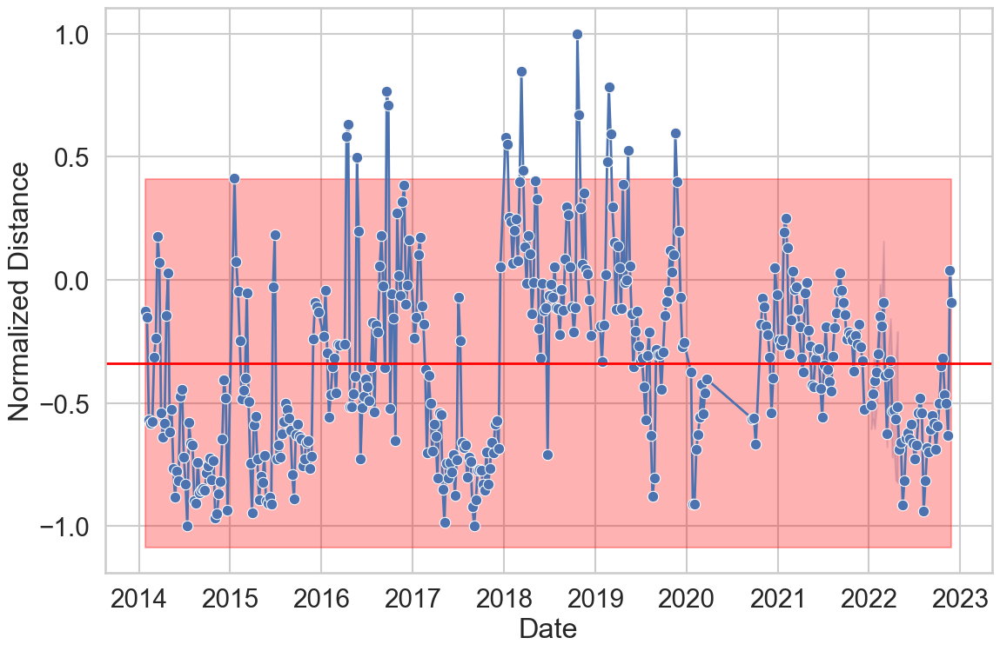

In [218]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.composition import multiplicative_replacement, clr
from skbio.stats.distance import DistanceMatrix
from scipy.spatial.distance import pdist, squareform
from skbio.diversity import beta_diversity
import re

# Convert year to float (or int) before assigning
newseparated['year'] = pd.to_numeric(newseparated['year'], errors='coerce')


# First, find rows where year is missing
missing_years = newseparated['year'].isna()

# Use regex to extract the year suffix from sampleid (e.g., BB22 → 2022)
newseparated.loc[missing_years, 'year'] = (
    newseparated.loc[missing_years, 'sampleid']
    .str.extract(r'BB(\d{2})')[0]   # extract the two digits after 'BB'
    .astype(float) + 2000           # convert to full year
)


depthc='D'

# Filter the dataframe for the desired size and depth only (all years)
df_filtered = newseparated.query("size_code in ['W', 'SL'] and depth_code == 'D'")

# Pivot the data to have samples x features
df_wide = df_filtered.pivot_table(
    index='sampleid',
    columns='feature_id',
    values='ratio',
    fill_value=0
)

# Replace zeros for CLR transformation
data_replaced = multiplicative_replacement(df_wide.values)
data_clr = clr(data_replaced)
df_clr = pd.DataFrame(data_clr, index=df_wide.index, columns=df_wide.columns)

# Choose the distance metric: 'euclidean' for CLR or 'braycurtis' for raw counts.
metric = 'euclidean'  # change to 'braycurtis' if preferred

if metric == 'euclidean':
    # Compute Euclidean distances on CLR-transformed data
    dists = squareform(pdist(df_clr.values, metric='euclidean'))
    dist_ids = df_clr.index
else:
    # Compute Bray-Curtis distances on the raw count data
    bc_dm = beta_diversity(metric='braycurtis', counts=df_wide.values, ids=df_wide.index)
    dists = bc_dm.data
    dist_ids = bc_dm.ids

# Create a distance matrix and convert it to a DataFrame
dist_matrix = DistanceMatrix(dists, ids=dist_ids)
dist_df = dist_matrix.to_data_frame()

# Convert the square distance matrix to long format
dist_long = dist_df.reset_index().melt(
    id_vars='index', var_name='sample2', value_name='distance'
)
dist_long.rename(columns={'index': 'sample1'}, inplace=True)
dist_long = dist_long[dist_long['sample1'] != dist_long['sample2']].copy()  # remove self-comparisons

# Create metadata with sampleid, year, and week number. Compute a date and a numerical timepoint.
metadata_df = df_filtered[['sampleid', 'year', 'weekn']].drop_duplicates().copy()


# Convert year and weekn to numeric types
metadata_df['year'] = pd.to_numeric(metadata_df['year'], errors='coerce')
metadata_df['weekn'] = pd.to_numeric(metadata_df['weekn'], errors='coerce')

# Compute a timepoint that orders the samples chronologically.
# Here we assume each year has 52 weeks.
metadata_df['timepoint'] = metadata_df['year'] * 52 + metadata_df['weekn']

# Also compute a date from year and week number (assuming week starts on Monday)
metadata_df['date'] = metadata_df.apply(
    lambda row: pd.to_datetime(f"{int(row['year'])}-W{int(row['weekn']):02d}-1", format="%Y-W%W-%w"),
    axis=1
)

# Merge metadata into the distance long dataframe for both samples
dist_long = dist_long.merge(
    metadata_df[['sampleid', 'timepoint', 'date']].rename(
        columns={'sampleid': 'sample1', 'timepoint': 'tp1', 'date': 'date1'}
    ),
    on='sample1', how='left'
).merge(
    metadata_df[['sampleid', 'timepoint', 'date']].rename(
        columns={'sampleid': 'sample2', 'timepoint': 'tp2', 'date': 'date2'}
    ),
    on='sample2', how='left'
)

# Filter only consecutive timepoints (i.e. the later sample is exactly one week after the earlier)
dist_consecutive = dist_long[dist_long['tp2'] == dist_long['tp1'] + 1].copy()

# Normalize the distance metric to the interval [-1, 1]
min_d = dist_consecutive['distance'].min()
max_d = dist_consecutive['distance'].max()
dist_consecutive['norm_distance'] = 2 * (dist_consecutive['distance'] - min_d) / (max_d - min_d) - 1

# Compute the global mean and standard deviation for the normalized distances
global_mean = dist_consecutive['norm_distance'].mean()
global_std = dist_consecutive['norm_distance'].std()

# Plotting using Seaborn with presentation settings
sns.set_theme(context="talk", style="whitegrid", font_scale=1.3)
plt.figure(figsize=(12, 8))

# Plot the normalized distances over time (using the date of the second sample)
sns.lineplot(data=dist_consecutive, x="date2", y="norm_distance", marker="o", linewidth=2)
             #label="Normalized Distance")

# Add a horizontal line for the global mean
plt.axhline(y=global_mean, color='red', linewidth=2, label='Global Mean')


# Set the multiplier (1.5 or 2, for instance)
std_multiplier = 2  # change to 1.5 for 1.5*std

# Determine the x-axis range for shading
x_min = dist_consecutive['date2'].min()
x_max = dist_consecutive['date2'].max()

# Add a horizontal shaded region for ± std_multiplier standard deviation from the global mean
plt.fill_between(
    [x_min, x_max],
    [global_mean - std_multiplier * global_std, global_mean - std_multiplier * global_std],
    [global_mean + std_multiplier * global_std, global_mean + std_multiplier * global_std],
    color='red',
    alpha=0.3,
    #label=f'Global ± {std_multiplier} Std Dev'
)

# Define the threshold for outliers (global mean + 2*global_std)
threshold = global_mean + std_multiplier * global_std

# Filter the rows where the normalized distance is above the threshold
above_threshold = dist_consecutive[dist_consecutive['norm_distance'] > threshold]

# Extract unique sample IDs from the "sample2" column that meet the criteria
above_sampleids = above_threshold['sample2'].unique()

# Additional plot formatting
#plt.title('Normalized Distance between Consecutive Weeks (All Years)')
plt.xlabel('Date')
plt.ylabel('Normalized Distance')
#plt.axvline(x=pd.to_datetime("2019-09-12"), color='r', linestyle='--')  # Adjust this date as needed
#plt.legend()
plt.tight_layout()
plt.savefig('figures/braycurtis_depth'+depthc+'_S_all.png', bbox_inches='tight')
plt.show()


In [221]:
result = analyze_depth_distances(newseparated, depth_code='all', size_codes=None, metric='euclidean', #or braycurtis
                            std_multiplier=2, output_dir='figures')

In [222]:
result

{'A': ['BB15.38A',
  'BB16.38A',
  'BB16.39A',
  'BB18.16ASL',
  'BB18.17ASL',
  'BB18.42ASL',
  'BB18.43ASL',
  'BB18.44ASL',
  'BB18.45ASL',
  'BB18.46ASL',
  'BB18.4ASL',
  'BB18.5ASL',
  'BB18.6ASL',
  'BB18.7ASL',
  'BB19.19ASL',
  'BB19.37ASL',
  'BB19.38ASL',
  'BB19.45ASL',
  'BB19.46ASL',
  'BB19.48ASL',
  'BB21.5ASL',
  'BB21.6ASL'],
 'B': ['BB16.49B',
  'BB18.16BSL',
  'BB18.17BSL',
  'BB18.2BSL',
  'BB18.3BSL',
  'BB18.42BSL',
  'BB18.43BSL',
  'BB18.44BSL',
  'BB18.45BSL',
  'BB18.46BSL',
  'BB18.47BSL',
  'BB18.4BSL',
  'BB18.5BSL',
  'BB18.7BSL',
  'BB19.37BSL',
  'BB19.38BSL',
  'BB19.43BSL',
  'BB19.44BSL',
  'BB19.48BSL'],
 'C': ['BB15.3C',
  'BB15.4C',
  'BB16.45C',
  'BB16.46C',
  'BB18.14CSL',
  'BB18.15CSL',
  'BB18.2CSL',
  'BB18.35CSL',
  'BB18.36CSL',
  'BB18.43CSL',
  'BB18.46CSL',
  'BB18.47CSL',
  'BB19.42CSL',
  'BB19.48CSL',
  'BB19.7CSL',
  'BB19.8CSL'],
 'D': ['BB15.3D',
  'BB16.15D',
  'BB16.16D',
  'BB16.21D',
  'BB16.38D',
  'BB16.39D',
  'BB18.11DSL'

In [219]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.composition import multiplicative_replacement, clr
from skbio.stats.distance import DistanceMatrix
from scipy.spatial.distance import pdist, squareform
from skbio.diversity import beta_diversity

def analyze_depth_distances(df, depth_code='all', size_codes=None, metric='euclidean',
                            std_multiplier=2, output_dir='figures'):
    '''
    Analyze normalized distances between consecutive weekly samples for specified depth codes.

    Parameters:
    -----------
    df: pd.DataFrame
        DataFrame containing columns ['sampleid','feature_id','ratio','size_code','depth_code','year','weekn'].
    depth_code: str
        The depth code to filter by, or 'all' to process all depth codes.
    size_codes: list of str, optional
        List of size codes to include (default ['W','SL']).
    metric: str
        Distance metric ('euclidean' or 'braycurtis').
    std_multiplier: float
        Multiplier for standard deviation threshold.
    output_dir: str
        Directory to save figures.

    Returns:
    --------
    dict or list
        If depth_code is 'all', returns dict mapping each depth code to list of sample IDs above threshold.
        If depth_code is specific, returns list of sample IDs above threshold.
    '''
    os.makedirs(output_dir, exist_ok=True)
    df = df.copy()
    # Ensure year is numeric and fill missing years based on sampleid
    df['year'] = pd.to_numeric(df['year'], errors='coerce')
    missing = df['year'].isna()
    if missing.any():
        df.loc[missing, 'year'] = (
            df.loc[missing, 'sampleid'].str.extract(r'BB(\\d{2})')[0]
            .astype(float) + 2000
        )
    # Default size codes
    if size_codes is None:
        size_codes = ['W', 'SL']
    # Determine depths to process
    depths = df['depth_code'].unique() if depth_code == 'all' else [depth_code]
    results = {}
    for d in depths:
        # Filter for size and depth
        df_f = df.query('size_code in @size_codes and depth_code == @d')
        if df_f.empty:
            continue
        # Pivot to samples x features
        df_wide = df_f.pivot_table(index='sampleid', columns='feature_id', values='ratio', fill_value=0)
        # CLR transformation
        data_repl = multiplicative_replacement(df_wide.values)
        data_clr = clr(data_repl)
        df_clr = pd.DataFrame(data_clr, index=df_wide.index, columns=df_wide.columns)
        # Compute distances
        if metric == 'euclidean':
            dists = squareform(pdist(df_clr.values, metric='euclidean'))
            ids = df_clr.index
        else:
            bc_dm = beta_diversity('braycurtis', df_wide.values, ids=df_wide.index)
            dists = bc_dm.data
            ids = bc_dm.ids
        dist_matrix = DistanceMatrix(dists, ids)
        dist_df = dist_matrix.to_data_frame()
        # Convert to long format
        dist_long = (
            dist_df.reset_index()
            .melt(id_vars='index', var_name='sample2', value_name='distance')
        )
        dist_long = dist_long[dist_long['index'] != dist_long['sample2']]
        dist_long.rename(columns={'index': 'sample1'}, inplace=True)
        # Metadata for timepoints and dates
        meta = df_f[['sampleid', 'year', 'weekn']].drop_duplicates().copy()
        meta['year'] = pd.to_numeric(meta['year'], errors='coerce')
        meta['weekn'] = pd.to_numeric(meta['weekn'], errors='coerce')
        meta['timepoint'] = meta['year'] * 52 + meta['weekn']
        meta['date'] = pd.to_datetime(
            meta['year'].astype(int).astype(str) + '-W' +
            meta['weekn'].astype(int).astype(str).str.zfill(2) + '-1',
            format='%Y-W%W-%w'
        )
        # Merge metadata
        merged = (
            dist_long
            .merge(
                meta[['sampleid', 'timepoint', 'date']]
                .rename(columns={'sampleid': 'sample1', 'timepoint': 'tp1', 'date': 'date1'}),
                on='sample1'
            )
            .merge(
                meta[['sampleid', 'timepoint', 'date']]
                .rename(columns={'sampleid': 'sample2', 'timepoint': 'tp2', 'date': 'date2'}),
                on='sample2'
            )
        )
        # Filter consecutive weeks
        df_consec = merged[merged['tp2'] == merged['tp1'] + 1].copy()
        # Normalize distances
        min_d = df_consec['distance'].min()
        max_d = df_consec['distance'].max()
        df_consec['norm_distance'] = 2 * (df_consec['distance'] - min_d) / (max_d - min_d) - 1
        mean = df_consec['norm_distance'].mean()
        std = df_consec['norm_distance'].std()
        # Plot
        sns.set_theme(context='talk', style='whitegrid', font_scale=1.3)
        plt.figure(figsize=(12, 8))
        sns.lineplot(data=df_consec, x='date2', y='norm_distance', marker='o', linewidth=2)
        plt.axhline(mean, color='red', linewidth=2)
        x_min = df_consec['date2'].min()
        x_max = df_consec['date2'].max()
        plt.fill_between([x_min, x_max], [mean - std_multiplier * std] * 2, [mean + std_multiplier * std] * 2, color='red', alpha=0.3)
        # Extract above-threshold sample IDs
        threshold = mean + std_multiplier * std
        above = df_consec[df_consec['norm_distance'] > threshold]
        above_ids = above['sample2'].unique()
        # Save figure
        plt.xlabel('Date')
        plt.ylabel('Normalized Distance')
        plt.tight_layout()
        plt.savefig(os.path.join(output_dir, f'depth_{d}_normalized_distances.png'), bbox_inches='tight')
        plt.close()
        # Store results
        results[d] = list(above_ids)
    # Return results
    return results if depth_code == 'all' else results.get(depth_code, [])


In [133]:
above_sampleids #DEPTH D

array(['BB15.3D', 'BB16.15D', 'BB16.16D', 'BB16.21D', 'BB16.38D',
       'BB16.39D', 'BB18.11DSL', 'BB18.12DSL', 'BB18.2DSL', 'BB18.3DSL',
       'BB18.43DSL', 'BB18.44DSL', 'BB19.19DSL', 'BB19.46DSL',
       'BB19.7DSL', 'BB19.8DSL', 'BB19.9DSL'], dtype=object)

In [131]:
above_sampleids #DEPTH C

array(['BB15.3C', 'BB15.4C', 'BB16.45C', 'BB16.46C', 'BB18.14CSL',
       'BB18.2CSL', 'BB18.35CSL', 'BB18.36CSL', 'BB18.43CSL',
       'BB18.46CSL', 'BB18.47CSL', 'BB19.42CSL', 'BB19.48CSL',
       'BB19.7CSL', 'BB19.8CSL'], dtype=object)

In [129]:
above_sampleids #DEPTH B

array(['BB16.49B', 'BB18.16BSL', 'BB18.17BSL', 'BB18.2BSL', 'BB18.3BSL',
       'BB18.42BSL', 'BB18.43BSL', 'BB18.44BSL', 'BB18.45BSL',
       'BB18.46BSL', 'BB18.47BSL', 'BB18.4BSL', 'BB18.5BSL', 'BB18.7BSL',
       'BB19.37BSL', 'BB19.38BSL', 'BB19.43BSL', 'BB19.44BSL',
       'BB19.48BSL'], dtype=object)

In [127]:
above_sampleids #DEPTH A

array(['BB15.38A', 'BB16.38A', 'BB16.39A', 'BB18.16ASL', 'BB18.17ASL',
       'BB18.42ASL', 'BB18.43ASL', 'BB18.44ASL', 'BB18.45ASL',
       'BB18.46ASL', 'BB18.4ASL', 'BB18.5ASL', 'BB18.6ASL', 'BB18.7ASL',
       'BB19.19ASL', 'BB19.37ASL', 'BB19.38ASL', 'BB19.45ASL',
       'BB19.46ASL', 'BB21.5ASL', 'BB21.6ASL'], dtype=object)

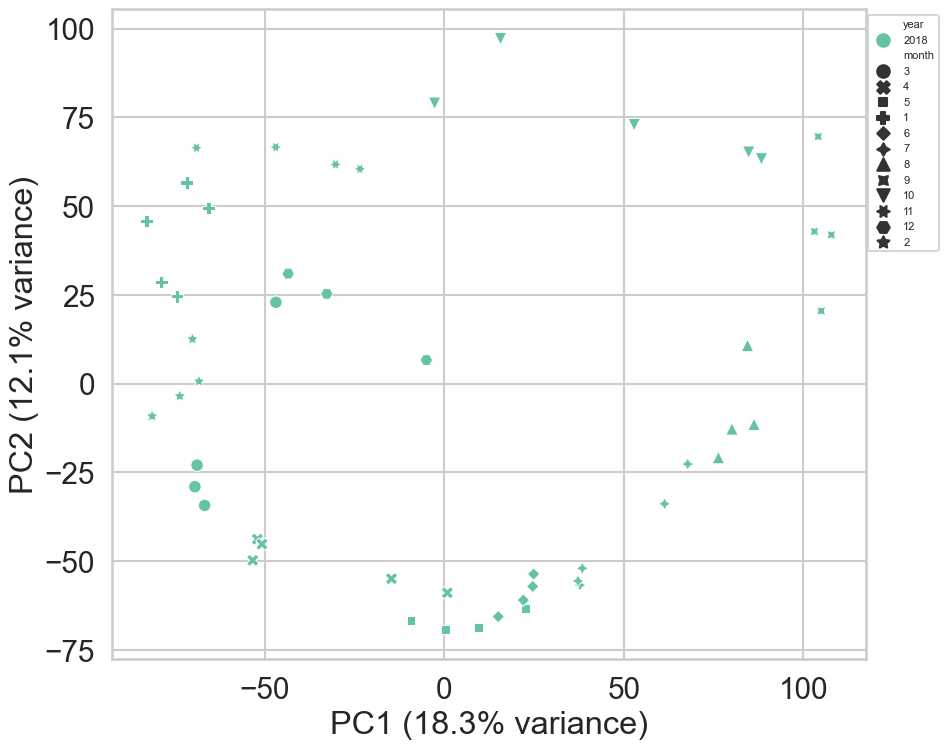

In [236]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.ordination import pcoa

# Assuming you've already created 'dist_matrix' as in your code.
# Run PCoA (Principal Coordinates Analysis) on the distance matrix.
pcoa_results = pcoa(dist_matrix)

# Extract the first two principal coordinates.
df_coords = pcoa_results.samples.iloc[:, :2].copy()
df_coords.columns = ['PC1', 'PC2']
df_coords['sampleid'] = df_coords.index

# Optionally merge in sample metadata (e.g., year) from your original data.
# This assumes that 'newseparated' has columns 'sampleid' and 'year'.
metadata = newseparated[['sampleid', 'year', 'datetime']].drop_duplicates().set_index('sampleid')
df_coords = df_coords.merge(metadata, left_index=True, right_index=True, how='left')

df_coords['datetime'] = pd.to_datetime(df_coords['datetime'])
df_coords['month'] = df_coords['datetime'].dt.month.astype(str)  # Convert month to string for categorical styling


# Create a 2D scatter plot using Seaborn.
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_coords, x='PC1', y='PC2', hue='year', palette='Set2', style='month')
#plt.title("2D PCoA Plot")
plt.xlabel(f"PC1 ({pcoa_results.proportion_explained[0]*100:.1f}% variance)")
plt.ylabel(f"PC2 ({pcoa_results.proportion_explained[1]*100:.1f}% variance)")
plt.legend(title="", bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1, fontsize=8)
plt.tight_layout()
plt.savefig('figures/braycurtis_pca'+depthc+'_SL_all.png', bbox_inches='tight')
plt.show()


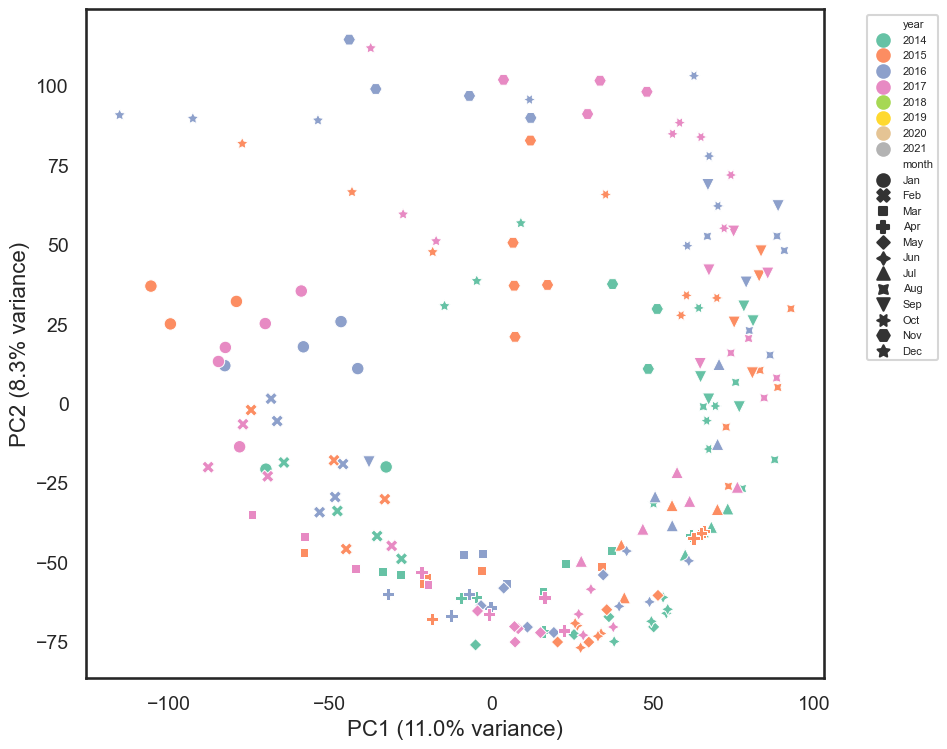

In [446]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.ordination import pcoa

# Assuming you've already created your distance matrix and computed PCoA:
pcoa_results = pcoa(dist_matrix)

# Extract the first two principal coordinates.
df_coords = pcoa_results.samples.iloc[:, :2].copy()
df_coords.columns = ['PC1', 'PC2']
df_coords['sampleid'] = df_coords.index

# Merge in sample metadata (e.g., year, datetime) from your original data.
metadata = newseparated[['sampleid', 'year', 'datetime']].drop_duplicates().set_index('sampleid')
df_coords = df_coords.merge(metadata, left_index=True, right_index=True, how='left')

# Ensure 'datetime' is a datetime object.
df_coords['datetime'] = pd.to_datetime(df_coords['datetime'])

# Convert month numbers to three-letter abbreviations, and define an ordered categorical.
month_order = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", 
               "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
df_coords['month'] = pd.Categorical(df_coords['datetime'].dt.strftime('%b'), 
                                    categories=month_order, 
                                    ordered=True)

# Create a 2D scatter plot using Seaborn.
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_coords, 
                x='PC1', 
                y='PC2', 
                hue='year', 
                style='month', 
                palette='Set2')
                
plt.xlabel(f"PC1 ({pcoa_results.proportion_explained[0]*100:.1f}% variance)")
plt.ylabel(f"PC2 ({pcoa_results.proportion_explained[1]*100:.1f}% variance)")
plt.legend(title="", bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1, fontsize=8)
plt.tight_layout()
plt.savefig('figures/braycurtis_pca'+depthc+'_SL_all_legendok.png', bbox_inches='tight')
plt.show()

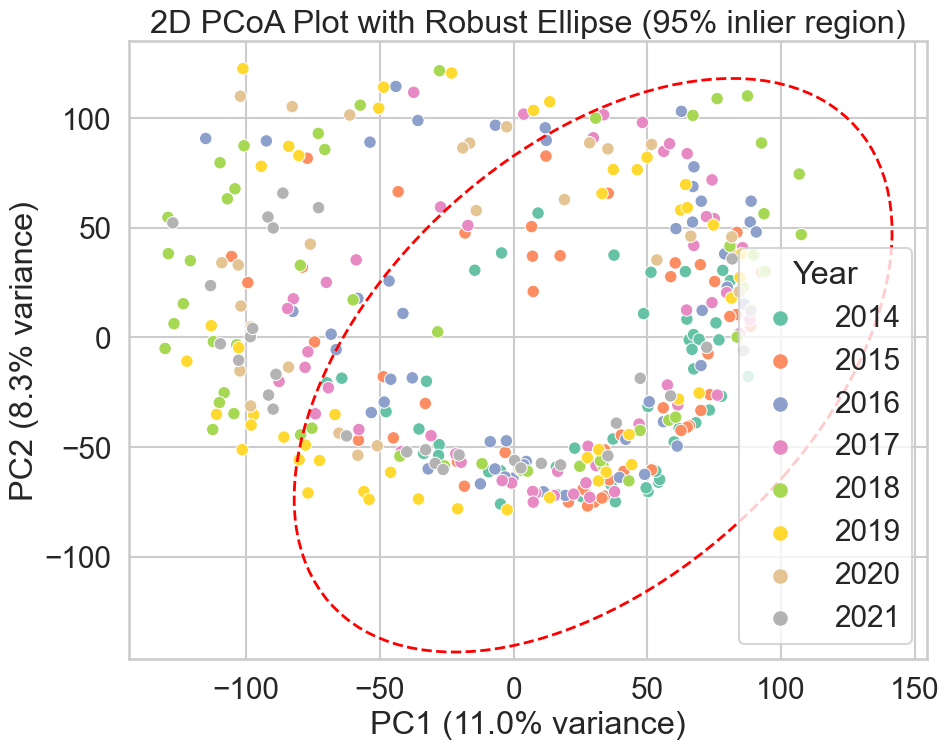

In [365]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from skbio.stats.ordination import pcoa
from skbio.stats.distance import DistanceMatrix
from scipy.spatial.distance import pdist, squareform
from sklearn.covariance import MinCovDet
from matplotlib.patches import Ellipse
from scipy.stats import chi2

# Assuming you've already computed your distance matrix (dist_matrix) from your code.
pcoa_results = pcoa(dist_matrix)

# Extract the first two principal coordinates.
df_coords = pcoa_results.samples.iloc[:, :2].copy()
df_coords.columns = ['PC1', 'PC2']
df_coords['sampleid'] = df_coords.index

# Merge in metadata (for example, 'year') from newseparated.
metadata = newseparated[['sampleid', 'year']].drop_duplicates().set_index('sampleid')
df_coords = df_coords.merge(metadata, left_index=True, right_index=True, how='left')

# Create the 2D scatter plot using Seaborn.
plt.figure(figsize=(10, 8))
ax = sns.scatterplot(data=df_coords, x='PC1', y='PC2', hue='year', palette='Set2')

# --- Compute Robust Covariance for Ellipse ---
# Use only the PC1 and PC2 values.
X = df_coords[['PC1', 'PC2']].values

# Fit a robust covariance estimator.
mcd = MinCovDet().fit(X)
robust_center = mcd.location_
robust_cov = mcd.covariance_

# Eigen decomposition on the robust covariance matrix.
eigvals, eigvecs = np.linalg.eigh(robust_cov)
order = eigvals.argsort()[::-1]
eigvals = eigvals[order]
eigvecs = eigvecs[:, order]

# Compute the angle of the ellipse.
angle = np.degrees(np.arctan2(eigvecs[1, 0], eigvecs[0, 0]))

# For a 95% confidence ellipse for the inlier data,
# use the chi-square quantile for 2 degrees of freedom.
scale = np.sqrt(chi2.ppf(0.95, 2))
width = 2 * scale * np.sqrt(eigvals[0])
height = 2 * scale * np.sqrt(eigvals[1])

# Create the ellipse patch based on the robust estimates.
ellipse = Ellipse(xy=robust_center, width=width, height=height,
                  angle=angle, edgecolor='red', facecolor='none', lw=2, ls='--')

ax.add_patch(ellipse)

# Label the axes with the proportion of variance explained.
plt.xlabel(f"PC1 ({pcoa_results.proportion_explained[0]*100:.1f}% variance)")
plt.ylabel(f"PC2 ({pcoa_results.proportion_explained[1]*100:.1f}% variance)")
plt.title("2D PCoA Plot with Robust Ellipse (95% inlier region)")
plt.legend(title="Year")
plt.tight_layout()
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


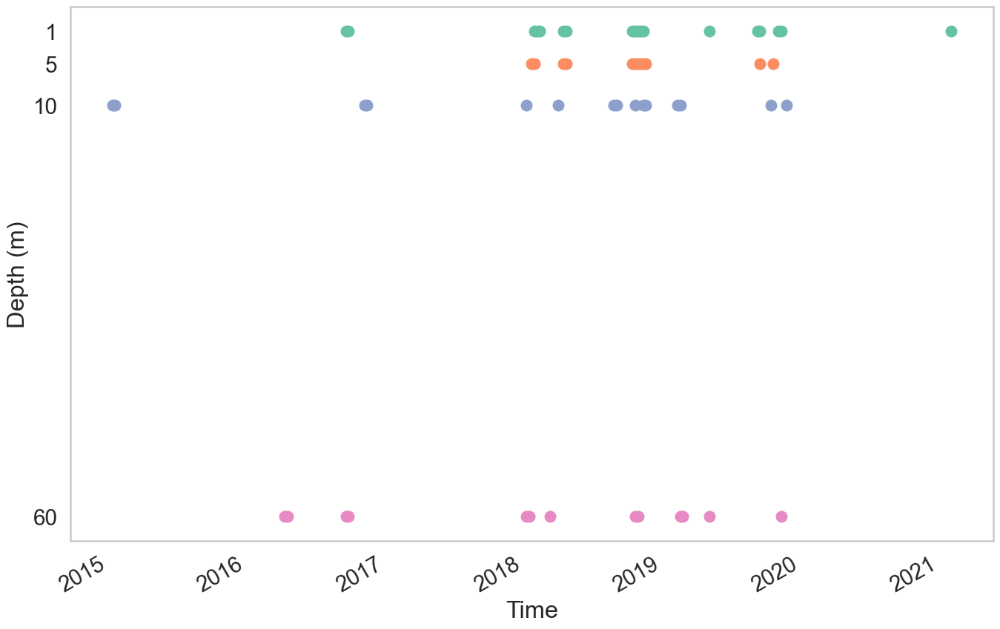

In [290]:
import re
import datetime
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Combined sorted list from all depths
codes = [
    'BB15.3C', 'BB15.4C',
    'BB16.15D', 'BB16.16D', 'BB16.38A', 'BB16.38D', 'BB16.39A', 'BB16.39D', 'BB16.45C', 'BB16.46C',
    'BB18.2CSL', 'BB18.2DSL', 'BB18.3DSL', 'BB18.4BSL', 'BB18.5ASL', 'BB18.5BSL', 'BB18.6ASL', 'BB18.7ASL', 'BB18.11DSL', 'BB18.14CSL',
    'BB18.16ASL', 'BB18.16BSL', 'BB18.17ASL', 'BB18.17BSL', 'BB18.35CSL', 'BB18.36CSL', 'BB18.42ASL', 'BB18.42BSL', 'BB18.43ASL', 'BB18.43BSL',
    'BB18.43CSL', 'BB18.43DSL', 'BB18.44ASL', 'BB18.44BSL', 'BB18.44DSL', 'BB18.45ASL', 'BB18.45BSL', 'BB18.46ASL', 'BB18.46BSL', 'BB18.46CSL',
    'BB18.47BSL', 'BB18.47CSL',
    'BB19.7CSL', 'BB19.8CSL', 'BB19.8DSL', 'BB19.9DSL', 'BB19.19ASL', 'BB19.19DSL', 'BB19.37ASL', 'BB19.38ASL', 'BB19.38BSL', 'BB19.42CSL',
    'BB19.43BSL', 'BB19.45ASL', 'BB19.46ASL', 'BB19.46DSL', 'BB19.48CSL',
    'BB21.5ASL'
]

# Define dictionary mapping for depth code to actual depth in meters.
depth_num = {
    "A": 1,
    "B": 5,
    "C": 10,
    "D": 60,
    "E": 30
}

# Use Set2 palette from matplotlib to assign colors to depth letters.
set2 = plt.get_cmap("Set2").colors
depth_colors = {
    "A": set2[0],
    "B": set2[1],
    "C": set2[2],
    "D": set2[3],
    "E": set2[4]
}

# Prepare lists for plotting
x_dates = []    # datetime objects for x-axis
y_depths = []   # Actual depth in meters from depth_num mapping
depth_labels = []  # The depth letter

# Regular expression to extract year, week, and the first depth letter
pattern = re.compile(r'BB(\d{2})\.(\d+)([A-Z])')

for code in codes:
    match = pattern.search(code)
    if match:
        year_str = match.group(1)
        week_str = match.group(2)
        depth_letter = match.group(3)
        # Convert two-digit year to full year (assuming 2000s)
        year = 2000 + int(year_str)
        week = int(week_str)
        # Convert year and week to a datetime object (Monday of that ISO week)
        date_obj = datetime.date.fromisocalendar(year, week, 1)
        x_dates.append(date_obj)
        # Map depth letter to actual depth in meters (default to 0 if not found)
        y_depths.append(depth_num.get(depth_letter, 0))
        depth_labels.append(depth_letter)
    else:
        print("No match for code:", code)

# Create a scatter plot
plt.figure(figsize=(14, 9))

# Plot all points using the same marker (circle) and Set2 palette for color.
for x, y, depth in zip(x_dates, y_depths, depth_labels):
    plt.scatter(x, y, color=depth_colors.get(depth, 'black'), marker='o', s=100)

# Format the x-axis to display only the year
plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
plt.gcf().autofmt_xdate()  # Auto rotate date labels if necessary

# Set y-axis ticks only for the sample depth values present (1, 5, 10, 60)
plt.yticks([1, 5, 10, 60])

# Invert y-axis so that shallower depths appear at the top.
plt.gca().invert_yaxis()

# Remove grid lines and hide legend
plt.grid(False)
plt.legend().set_visible(False)

# Label the axes and title
plt.xlabel("Time")
plt.ylabel("Depth (m)")
#plt.title("Chronological Visualization of BB Codes by Depth (Set2 Palette)")

#plt.axvline(x=pd.to_datetime("2019-09-12"), color='r', linestyle='--')  # Adjust this date as needed
plt.tight_layout()
plt.savefig('figures/samples_very_different.png', bbox_inches='tight')
plt.show()


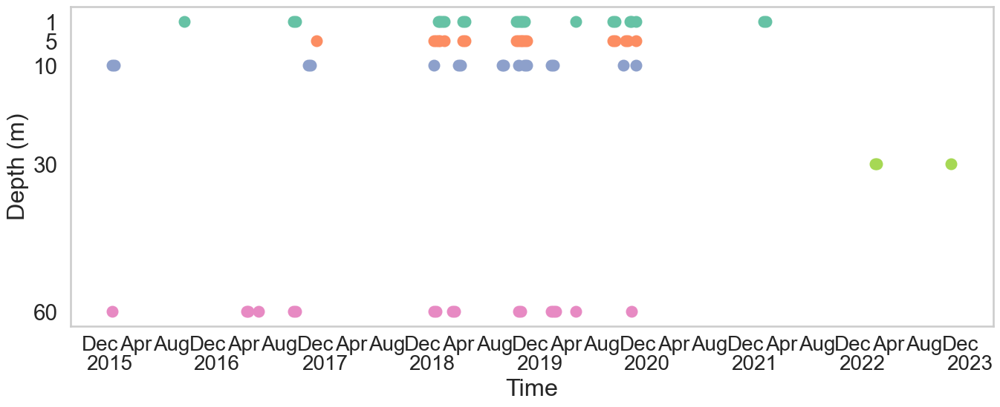

In [224]:
import re
import datetime
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Combined sorted list from all depths from initial run without 2022
#codes = [
#    'BB15.3C', 'BB15.4C',
#    'BB16.15D', 'BB16.16D', 'BB16.38A', 'BB16.38D', 'BB16.39A', 'BB16.39D', 'BB16.45C', 'BB16.46C',
#    'BB18.2CSL', 'BB18.2DSL', 'BB18.3DSL', 'BB18.4BSL', 'BB18.5ASL', 'BB18.5BSL', 'BB18.6ASL', 'BB18.7ASL', 'BB18.11DSL', 'BB18.14CSL',
#    'BB18.16ASL', 'BB18.16BSL', 'BB18.17ASL', 'BB18.17BSL', 'BB18.35CSL', 'BB18.36CSL', 'BB18.42ASL', 'BB18.42BSL', 'BB18.43ASL', 'BB18.43BSL',
#    'BB18.43CSL', 'BB18.43DSL', 'BB18.44ASL', 'BB18.44BSL', 'BB18.44DSL', 'BB18.45ASL', 'BB18.45BSL', 'BB18.46ASL', 'BB18.46BSL', 'BB18.46CSL',
#    'BB18.47BSL', 'BB18.47CSL',
#    'BB19.7CSL', 'BB19.8CSL', 'BB19.8DSL', 'BB19.9DSL', 'BB19.19ASL', 'BB19.19DSL', 'BB19.37ASL', 'BB19.38ASL', 'BB19.38BSL', 'BB19.42CSL',
#    'BB19.43BSL', 'BB19.45ASL', 'BB19.46ASL', 'BB19.46DSL', 'BB19.48CSL',
#    'BB21.5ASL'
#]

#codes = [
#    'BB15.3D', 'BB16.15D', 'BB16.16D', 'BB16.21D', 'BB16.38D', 'BB16.39D',
#    'BB18.11DSL', 'BB18.12DSL', 'BB18.2DSL', 'BB18.3DSL', 'BB18.43DSL', 'BB18.44DSL', 'BB19.19DSL',
#    'BB19.46DSL', 'BB19.7DSL', 'BB19.8DSL', 'BB19.9DSL',
    
#    'BB15.3C', 'BB15.4C', 'BB16.45C', 'BB16.46C', 'BB18.14CSL', 'BB18.2CSL', 'BB18.35CSL', 'BB18.36CSL',
#    'BB18.43CSL', 'BB18.46CSL', 'BB18.47CSL', 'BB19.42CSL', 'BB19.48CSL', 'BB19.7CSL', 'BB19.8CSL',
    
#    'BB16.49B', 'BB18.16BSL', 'BB18.17BSL', 'BB18.2BSL', 'BB18.3BSL', 'BB18.42BSL', 'BB18.43BSL',
#    'BB18.44BSL', 'BB18.45BSL', 'BB18.46BSL', 'BB18.47BSL', 'BB18.4BSL', 'BB18.5BSL', 'BB18.7BSL',
#    'BB19.37BSL', 'BB19.38BSL', 'BB19.43BSL', 'BB19.44BSL', 'BB19.48BSL',
    
#    'BB15.38A', 'BB16.38A', 'BB16.39A', 'BB18.16ASL', 'BB18.17ASL', 'BB18.42ASL', 'BB18.43ASL',
#    'BB18.44ASL', 'BB18.45ASL', 'BB18.46ASL', 'BB18.4ASL', 'BB18.5ASL', 'BB18.6ASL', 'BB18.7ASL',
#    'BB19.19ASL', 'BB19.37ASL', 'BB19.38ASL', 'BB19.45ASL', 'BB19.46ASL', 'BB21.5ASL', 'BB21.6ASL'
#]

codes = ['BB15.38A',
  'BB16.38A',
  'BB16.39A',
  'BB18.16ASL',
  'BB18.17ASL',
  'BB18.42ASL',
  'BB18.43ASL',
  'BB18.44ASL',
  'BB18.45ASL',
  'BB18.46ASL',
  'BB18.4ASL',
  'BB18.5ASL',
  'BB18.6ASL',
  'BB18.7ASL',
  'BB19.19ASL',
  'BB19.37ASL',
  'BB19.38ASL',
  'BB19.45ASL',
  'BB19.46ASL',
  'BB19.48ASL',
  'BB21.5ASL',
  'BB21.6ASL',
 'BB16.49B',
  'BB18.16BSL',
  'BB18.17BSL',
  'BB18.2BSL',
  'BB18.3BSL',
  'BB18.42BSL',
  'BB18.43BSL',
  'BB18.44BSL',
  'BB18.45BSL',
  'BB18.46BSL',
  'BB18.47BSL',
  'BB18.4BSL',
  'BB18.5BSL',
  'BB18.7BSL',
  'BB19.37BSL',
  'BB19.38BSL',
  'BB19.43BSL',
  'BB19.44BSL',
  'BB19.48BSL','BB15.3C',
  'BB15.4C',
  'BB16.45C',
  'BB16.46C',
  'BB18.14CSL',
  'BB18.15CSL',
  'BB18.2CSL',
  'BB18.35CSL',
  'BB18.36CSL',
  'BB18.43CSL',
  'BB18.46CSL',
  'BB18.47CSL',
  'BB19.42CSL',
  'BB19.48CSL',
  'BB19.7CSL',
  'BB19.8CSL', 'BB15.3D',
  'BB16.15D',
  'BB16.16D',
  'BB16.21D',
  'BB16.38D',
  'BB16.39D',
  'BB18.11DSL',
  'BB18.12DSL',
  'BB18.2DSL',
  'BB18.3DSL',
  'BB18.43DSL',
  'BB18.44DSL',
  'BB19.19DSL',
  'BB19.46DSL',
  'BB19.7DSL',
  'BB19.8DSL',
  'BB19.9DSL', 'BB22.44E', 'BB22.7ESL', 'BB22.8ESL']

# Define dictionary mapping for depth code to actual depth in meters.
depth_num = {
    "A": 1,
    "B": 5,
    "C": 10,
    "D": 60,
    "E": 30
}

# Use Set2 palette from matplotlib to assign colors to depth letters.
set2 = plt.get_cmap("Set2").colors
depth_colors = {
    "A": set2[0],
    "B": set2[1],
    "C": set2[2],
    "D": set2[3],
    "E": set2[4]
}

# Prepare lists for plotting
x_dates = []    # datetime objects for x-axis
y_depths = []   # Actual depth in meters from depth_num mapping
depth_labels = []  # The depth letter

# Regular expression to extract year, week, and the first depth letter
pattern = re.compile(r'BB(\d{2})\.(\d+)([A-Z])')

for code in codes:
    match = pattern.search(code)
    if match:
        year_str = match.group(1)
        week_str = match.group(2)
        depth_letter = match.group(3)
        # Convert two-digit year to full year (assuming 2000s)
        year = 2000 + int(year_str)
        week = int(week_str)
        # Convert year and week to a datetime object (Monday of that ISO week)
        date_obj = datetime.date.fromisocalendar(year, week, 1)
        x_dates.append(date_obj)
        # Map depth letter to actual depth in meters (default to 0 if not found)
        y_depths.append(depth_num.get(depth_letter, 0))
        depth_labels.append(depth_letter)
    else:
        print("No match for code:", code)

# Create a scatter plot
plt.figure(figsize=(14, 6))
ax = plt.gca()

for x, y, depth in zip(x_dates, y_depths, depth_labels):
    ax.scatter(x, y, color=depth_colors.get(depth, 'black'), marker='o', s=100)

ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonth=[1, 4, 8, 12]))
ax.xaxis.set_minor_formatter(mdates.DateFormatter('%b'))

# Adjust tick parameters: 
ax.tick_params(axis='x', which='major', rotation=0, pad=19, labelsize=20)
ax.tick_params(axis='x', which='minor', rotation=0, labelsize=20)


ax.set_yticks([1, 5, 10, 30, 60])
ax.invert_yaxis()


ax.grid(False)
if ax.get_legend() is not None:
    ax.get_legend().set_visible(False)

plt.xlabel("Time")
plt.ylabel("Depth (m)")
#plt.axvline(x=pd.to_datetime("2019-09-7"), color='r', linestyle='--')
#plt.axvline(x=pd.to_datetime("2018-10-12"), color='r', linestyle='--')
#plt.axvline(x=pd.to_datetime("2018-01-13"), color='r', linestyle='--')

plt.tight_layout()
plt.savefig('figures/samples_very_different_with_month_lines.png', bbox_inches='tight')
plt.show()


In [154]:
newseparated.head()

,sampleid,feature_id,size_code,depth_code,depth,weekn,datetime,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species,DNApr,[DNAt],feature_frequency,Total,ratio,nASVs,weekdepth,avg,diff,year,[DNA]ng/uL,rank,ranktot,shannon_diversity
0,BB22.10ASL,b9f32166331c95006dcc8caa2e5048de,SL,A,1,10,2022-03-07,d__Archaea; p__Crenarchaeota; c__Nitrososphaer...,0.997738,d__Archaea,p__Crenarchaeota,c__Nitrososphaeria,o__Nitrosopumilales,f__Nitrosopumilaceae,g__Candidatus_Nitrosopumilus,Unassigned,0.770619,38.8,456.206186,101561.649485,0.004492,368,101,425.545740,-57.545740,2022.0,NaN,53.5,0.145380,7.616865
1,BB22.10ASL,b9f32166331c95006dcc8caa2e5048de,SL,A,1,10,2022-03-07,d__Archaea; p__Crenarchaeota; c__Nitrososphaer...,0.999781,d__Archaea,p__Crenarchaeota,c__Nitrososphaeria,o__Nitrosopumilales,f__Nitrosopumilaceae,g__Candidatus_Nitrosopumilus,Unassigned,0.770619,38.8,456.206186,101561.649485,0.004492,368,101,425.545740,-57.545740,2022.0,NaN,53.5,0.145380,7.616865
2,BB22.10BSL,b9f32166331c95006dcc8caa2e5048de,SL,B,5,10,2022-03-07,d__Archaea; p__Crenarchaeota; c__Nitrososphaer...,0.997738,d__Archaea,p__Crenarchaeota,c__Nitrososphaeria,o__Nitrosopumilales,f__Nitrosopumilaceae,g__Candidatus_Nitrosopumilus,Unassigned,0.662698,50.4,125.912698,26107.079365,0.004823,163,105,370.470480,-207.470480,2022.0,NaN,47.5,0.291411,6.621977
3,BB22.10BSL,b9f32166331c95006dcc8caa2e5048de,SL,B,5,10,2022-03-07,d__Archaea; p__Crenarchaeota; c__Nitrososphaer...,0.999781,d__Archaea,p__Crenarchaeota,c__Nitrososphaeria,o__Nitrosopumilales,f__Nitrosopumilaceae,g__Candidatus_Nitrosopumilus,Unassigned,0.662698,50.4,125.912698,26107.079365,0.004823,163,105,370.470480,-207.470480,2022.0,NaN,47.5,0.291411,6.621977
4,BB22.10CSL,b9f32166331c95006dcc8caa2e5048de,SL,C,10,10,2022-03-07,d__Archaea; p__Crenarchaeota; c__Nitrososphaer...,0.997738,d__Archaea,p__Crenarchaeota,c__Nitrososphaeria,o__Nitrosopumilales,f__Nitrosopumilaceae,g__Candidatus_Nitrosopumilus,Unassigned,0.704797,27.1,1336.295203,162204.099631,0.008238,531,1010,374.837192,156.162808,2022.0,NaN,19.5,0.036723,8.508788


In [166]:
## prep for sparCC
#I need a df of OTUs(rows) per samples
filtered_df = newseparated[newseparated['feature_frequency'] >= 2]
subset = filtered_df.query("size_code in ['SL', 'W'] and depth_code == 'A'")

In [167]:
winter_subset = subset[subset['datetime'].dt.month.isin([12, 1, 2])]

In [171]:
df_wide = winter_subset.pivot_table(
    index='feature_id',
    columns='sampleid',
    values='feature_frequency',
    fill_value=0
)

In [172]:
zero_count = (df_wide == 0).sum().sum()
total_entries = df_wide.size
zero_count / total_entries

0.9271190547455139

In [173]:
filtered = df_wide[(df_wide > 0).sum(axis=1) > 5]  # keep OTUs seen in >5 samples

In [175]:
filtered.to_csv("sparcc_input_winterA.tsv", sep="\t")


In [176]:
filtered.head()

sampleid,BB14.3A,BB14.48A,BB14.49A,BB14.4A,BB14.50A,BB14.51A,BB14.5A,BB14.6A,BB14.7A,BB14.8A,BB15.2A,BB15.3A,BB15.49A,BB15.4A,BB15.50A,BB15.51A,BB15.5A,BB15.6A,BB15.7A,BB15.8A,BB16.1A,BB16.2A,BB16.3A,BB16.49A,BB16.4A,BB16.50A,BB16.51A,BB16.5A,BB16.6A,BB16.7A,BB16.8A,BB16.9A,BB17.1A,BB17.2A,BB17.3A,BB17.49A,BB17.4A,BB17.50A,BB17.51A,BB17.5A,BB17.6A,BB17.7A,BB17.8A,BB17.9A,BB18.1ASL,BB18.2ASL,BB18.3ASL,BB18.49ASL,BB18.4ASL,BB18.50ASL,BB18.51ASL,BB18.5ASL,BB18.6ASL,BB18.7ASL,BB18.8ASL,BB18.9ASL,BB19.2ASL,BB19.3ASL,BB19.48ASL,BB19.49ASL,BB19.4ASL,BB19.50ASL,BB19.51ASL,BB19.5ASL,BB19.6ASL,BB19.7ASL,BB19.8ASL,BB20.2ASL,BB20.3ASL,BB20.49ASL,BB20.4ASL,BB20.50ASL,BB20.51ASL,BB20.52ASL,BB20.5ASL,BB20.6ASL,BB20.7ASL,BB20.8ASL,BB21.1ASL,BB21.2ASL,BB21.3ASL,BB21.4ASL,BB21.5ASL,BB21.6ASL,BB21.7ASL,BB21.8ASL,BB22.1A,BB22.1ASL,BB22.2A,BB22.2ASL,BB22.3A,BB22.3ASL,BB22.4A,BB22.4ASL,BB22.50A,BB22.5A,BB22.5ASL,BB22.6A,BB22.6ASL,BB22.7A,BB22.7ASL,BB22.8A,BB22.8ASL,BB22.9A,BB22.9ASL
feature_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
00101009628bd733b50369257df00d1b,14,0,0,0,0,0,0,0,0,0,31,20,20,0,0,16,19,0,0,0,0,23,0,32,23,0,37,0,27,0,0,0,0,0,0,18,0,0,18,0,0,0,0,0,0.000000,0.000000,31.476395,0.000000,0.000000,0.000000,0.000000,0.000000,48.034549,23.162791,0.000000,0.000000,0.000000,0.000000,91.897321,31.899791,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.134907,15.012285,0.000000,0,0.000000,0,0.000000,0,0.000000,0,0.000000,23,0,0.000000,0,0.000000,0,0.000000,0,0.000000,0,0.000000
0089c2ee62e4e072faf4a080fc7ae6e5,0,9,14,8,8,0,6,0,0,0,90,30,9,12,41,99,0,0,16,0,12,11,4,40,15,43,30,9,3,2,0,3,0,0,7,53,3,0,9,4,3,0,0,0,73.934426,24.925373,22.987124,16.216216,8.282353,2.470588,2.000000,17.741176,7.247601,2.209302,0.000000,6.106195,0.000000,3.325843,256.383929,104.701461,0.000000,172.286334,140.493724,0.0,0.0,2.347826,0.000000,23.819199,30.312945,41.001838,39.629158,222.580645,262.572687,323.437500,25.277778,12.441860,2.638581,5.357079,79.825581,41.233803,98.717557,141.378238,32.868895,46.354132,45.641278,9.191489,35,122.019231,30,33.009434,15,3.745223,20,36.785340,18,0,3.312281,8,5.141304,0,0.000000,0,0.000000,0,0.000000
008d11c0689fd62d7a19f9e1fbb54268,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,9,0,0,0,0,0,0.000000,0.000000,9.939914,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.530387,0.000000,0.000000,0.000000,5.263393,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.196429,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5,0.000000,0,4.783019,0,0.000000,0,0.000000,6,0,0.000000,0,0.000000,0,0.000000,0,0.000000,0,0.000000
009cdbab8ec4e73afa9896e976ef4e79,0,0,0,0,0,0,0,0,0,0,28,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,3.081081,0.000000,0.000000,0.000000,0.000000,5.435701,4.418605,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0,0.000000,0,0.000000,10,0.000000,0,0,7.929825,0,0.000000,0,0.000000,0,0.000000,0,0.000000
012054e3f62502aff7f455e1592ea87f,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,120.655738,64.537313,100.832618,49.054054,92.594118,46.682353,82.666667,83.294118,81.992322,65.145349,110.071823,0.000000,144.963855,187.910112,50.879464,30.304802,105.472973,0.000000,0.000000,0.0,0.0,0.000000,23.669617,78.732526,0.000000,0.000000,48.461430,19.055718,23.629956,32.946429,0.000000,55.224806,50.314856,37.250223,40.343023,0.000000,3

In [185]:
m2021 = pd.read_csv('/Users/Diana/Documents/escuela/phd/ch2/bb_data/2021/METADATA.txt', sep='\t')
m2021_becca = pd.read_csv('/Users/Diana/Downloads/metadata.csv')

In [186]:
m2021

,sampleid,year,date,weekn,depth,depth_code,size_code,[DNA]ng/uL,A260/280,extraction_date,extracted_by,elution_volume,new_id,notes,Freezer Box (1.5mL),filtration_volume
0,BB21.1AL,2021,06-Jan,1,1,A,L,8.7,1.78,2022-08-12,Anna,100.0,BB21.1AL,NaN,Box 3,435.0
1,BB21.1AS,2021,06-Jan,1,1,A,S,25.7,1.86,2022-08-12,Anna,100.0,BB21.1AS,NaN,Box 3,435.0
2,BB21.1BL,2021,06-Jan,1,5,B,L,8.8,1.71,2022-08-12,Anna,100.0,BB21.1BL,NaN,Box 3,480.0
3,BB21.1BS,2021,06-Jan,1,5,B,S,53.7,1.69,2022-08-12,Anna,100.0,BB21.1BS,NaN,Box 3,480.0
4,BB21.1CL,2021,06-Jan,1,10,C,L,20.5,1.57,2022-08-12,Anna,100.0,BB21.1CL,NaN,Box 3,430.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,BB21.50BS,2021,15-Dec,50,5,B,S,NaN,NaN,NaN,NaN,NaN,BB21.50BS,NaN,NaN,NaN
396,BB21.50CL,2021,15-Dec,50,10,C,L,NaN,NaN,NaN,NaN,NaN,BB21.50CL,NaN,NaN,NaN
397,BB21.50CS,2021,15-Dec,50,10,C,S,NaN,NaN,NaN,NaN,NaN,BB21.50CS,NaN,NaN,NaN
398,BB21.50DL,2021,15-Dec,50,60,D,L,NaN,NaN,NaN,NaN,NaN,BB21.50DL,NaN,NaN,NaN


In [187]:
newpotentially = pd.merge(m2021, m2021_becca[['sampleid', 'X.DNA.ng.uL']], on='sampleid', how='left')

In [189]:
newpotentially.to_csv('newMETADATA.tsv')

In [285]:
bbmp_updated18=bbmp_updated[bbmp_updated['year']>2010]

/var/folders/kv/yq6jygk116l27q2bwnk25k0w0000gn/T/ipykernel_70626/2091552260.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



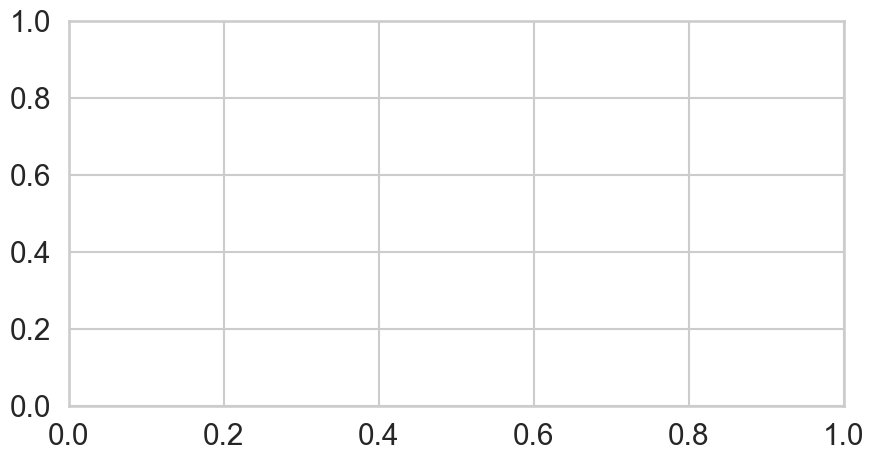

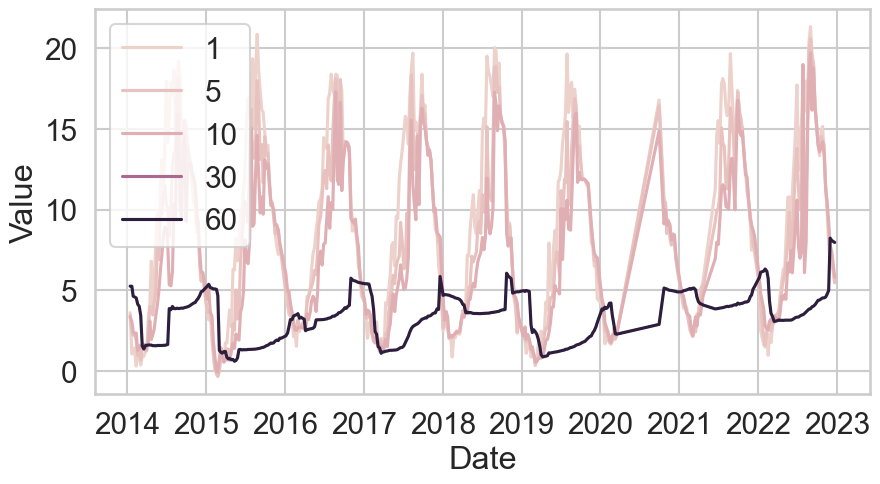

In [288]:
bbmp_updated18['date'] = pd.to_datetime(bbmp_updated18['date'])

# Plot the environmental parameters over time
plt.figure(figsize=(10, 5))
sns.lineplot(data = bbmp_updated18, x="date", y="Temperature_BIO_bbmp", hue="depth")

plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [126]:
def identify_conditionally_rare_taxa(df, 
                                     feature_col='feature_id', 
                                     ratio_col='ratio', 
                                     bloom_threshold=0.01, 
                                     avg_threshold=0.001,
                                     target_size_code="W_SL"):

    # Filter the DataFrame based on the specified size code.
    if target_size_code == "S":
        df_subset = df[df['size_code'] == "S"]
    elif target_size_code == "L":
        df_subset = df[df['size_code'] == "L"]
    elif target_size_code == "W_SL":
        df_subset = df[df['size_code'].isin(["W", "SL"])]
    else:
        raise ValueError("Invalid target_size_code. Please specify 'S', 'L', or 'W_SL'.")
    
    # Compute feature-level summary statistics.
    stats = df_subset.groupby(feature_col)[ratio_col].agg(
        avg_ratio='mean',
        max_ratio='max',
        bloom_count=lambda x: (x > bloom_threshold).sum()
    ).reset_index()
    
    # Identify conditionally rare taxa: normally rare but with at least one bloom event.
    crt = stats[(stats['avg_ratio'] < avg_threshold) & (stats['bloom_count'] > 0)]
    
    return crt

In [ ]:
newseparatedd1 = newseparated.

In [159]:
print(crt_tabled1["feature_id"].nunique())  # Should be 63

62


In [160]:
print(presence_df["in_df1"].sum())  

62


In [161]:
presence_df.to_csv('presence_df_crts.csv')

depth 1 = 62
depth 5; 37
depth 10 = 39
depth 60 = 33

In [155]:
set1 = set(crt_tabled1["feature_id"].unique())
set2 = set(crt_tabled5["feature_id"].unique())
set3 = set(crt_tabled10["feature_id"].unique())
set4 = set(crt_tabled60["feature_id"].unique())

all_features = set1 | set2 | set3 | set4

presence_df = pd.DataFrame({
    "feature_id": list(all_features),
    "in_df1": [fid in set1 for fid in all_features],
    "in_df2": [fid in set2 for fid in all_features],
    "in_df3": [fid in set3 for fid in all_features],
    "in_df4": [fid in set4 for fid in all_features],
})

# Optional: add a count of how many dataframes each feature is present in
presence_df["num_present"] = (
    presence_df[["in_df1", "in_df2", "in_df3", "in_df4"]].sum(axis=1)
)

# Optional: sort by num_present descending
presence_df = presence_df.sort_values(by="num_present", ascending=False)
presence_df

,feature_id,in_df1,in_df2,in_df3,in_df4,num_present
23,e0bcc4ff45b4c9a6efc1d52def1dba5d,True,True,True,False,3
123,29e147348364f25451b2729361ae568f,True,True,True,False,3
45,88d53316693e14de82bb3e5bdeedb951,True,True,True,False,3
43,c982c2431272645f713662ac2fa97dcb,True,True,True,False,3
32,c25c62b8b63ad45f4fb5e4b82ed82e1b,True,False,True,True,3
...,...,...,...,...,...,...
46,e1fdbb4c1f7d2cd1e16c9a7c02a026c6,True,False,False,False,1
44,29773bfdf1daa07764938772ed7e38e7,False,True,False,False,1
42,029ad2e1900c4019bd98d0e96b51a1a2,True,False,False,False,1
41,b5c91d2ed1db7f5ec72fd7efc16512df,True,False,False,False,1


/var/folders/kv/yq6jygk116l27q2bwnk25k0w0000gn/T/ipykernel_38724/2481164375.py:14: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



<Figure size 1000x600 with 0 Axes>

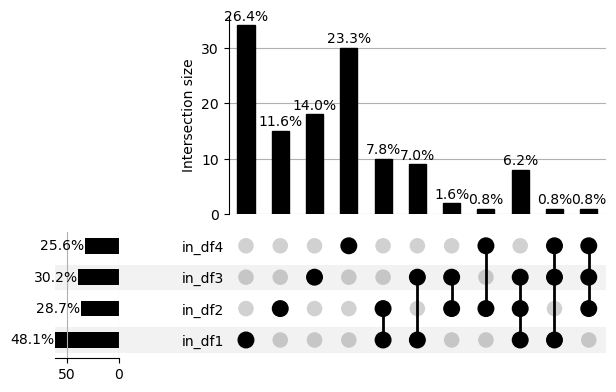

In [165]:
ordered_columns = ["in_df1", "in_df2", "in_df3", "in_df4"]

upset_data = from_indicators(ordered_columns, presence_df)

plt.figure(figsize=(10, 6))
upset = UpSet(
    upset_data,
    subset_size='count',
    show_percentages=True,
    sort_by='degree',
    sort_categories_by=None  # Keeps your input order
)
upset.plot()
plt.tight_layout()
plt.show()

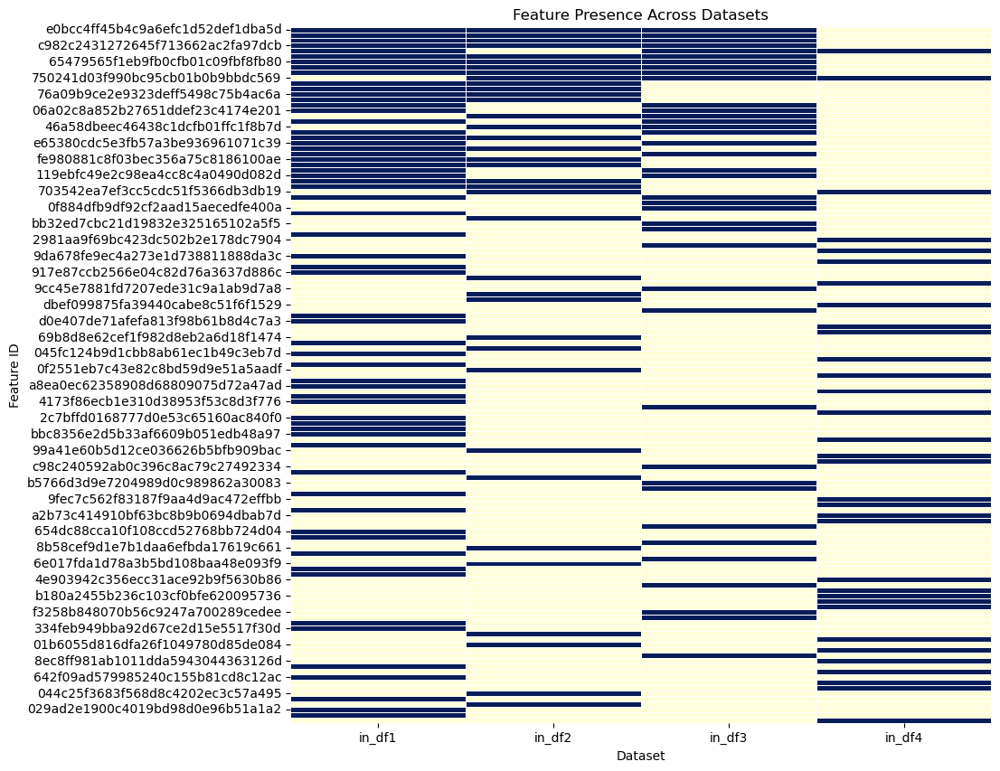

In [164]:
heatmap_data = presence_df.set_index("feature_id")[["in_df1", "in_df2", "in_df3", "in_df4"]].astype(int)

plt.figure(figsize=(10, 10))
sns.heatmap(heatmap_data, cmap="YlGnBu", cbar=False, linewidths=0.5)
plt.title("Feature Presence Across Datasets")
plt.xlabel("Dataset")
plt.ylabel("Feature ID")
plt.show()

NameError: name 'mdates' is not defined

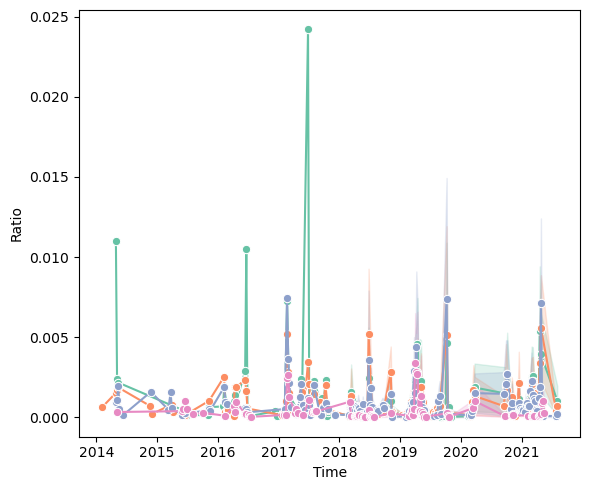

In [181]:
# Specify the feature ID to plot
target_feature = '2c7bffd0168777d0e53c65160ac840f0'  # replace with the actual feature id

# Filter the DataFrame for the target feature.
# Assuming newseparated has columns 'feature_id', 'datetime', and 'ratio'
df_feature = newseparated[newseparated['feature_id'] == target_feature].copy()


# Sort by datetime to ensure proper ordering
df_feature.sort_values('datetime', inplace=True)

# Create the time series plot using Seaborn
plt.figure(figsize=(6, 5))
sns.lineplot(data=df_feature, x='datetime', y='ratio', marker='o', hue='depth', palette="Set2", legend=False)
#plt.title("g__Taeseokella;s__Arcticibacterium_luteifluviistationis")
plt.xlabel("Time")
plt.ylabel("Ratio")
plt.grid(False)
plt.tight_layout()

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.YearLocator())       # set major ticks to each year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # format ticks as 'YYYY'

plt.savefig('figures/TS'+target_feature+'.png', bbox_inches='tight')
plt.show()


In [176]:
crt_tabled1["gap"] = crt_tabled1["max_ratio"] - crt_tabled1["avg_ratio"]

crt_tabled1 = crt_tabled1.sort_values(by="gap", ascending=False)

crt_tabled1.head(10)

,feature_id,avg_ratio,max_ratio,bloom_count,gap
10455,8d4e05e85d75927ef8acf8b56e34d096,0.000875,0.038462,1,0.037586
7432,65479565f1eb9fb0cfb01c09fbf8fb80,0.000896,0.037803,3,0.036907
10003,87855b23b68f7618817db4b257189b5b,0.000696,0.030973,1,0.030277
6260,5556427308f27c2bac8d992d50706b06,0.000777,0.028787,1,0.028011
16900,e65380cdc5e3fb57a3be936961071c39,0.000624,0.027798,1,0.027173
14251,c25c62b8b63ad45f4fb5e4b82ed82e1b,0.000605,0.027630,1,0.027025
1441,1456ed4162ba9c260c19da6b2d924673,0.000864,0.026316,1,0.025451
4798,4207b89526530972c49169b7dc2358bd,0.000822,0.024892,1,0.024070
1021,0e46659798f4871df8791ea441a88a9c,0.000852,0.024611,3,0.023759
3242,2c7bffd0168777d0e53c65160ac840f0,0.000779,0.024197,3,0.023418


In [153]:
newseparatedd10= newseparated[newseparated["depth"]==10]

In [154]:
crt_tabled10 = identify_conditionally_rare_taxa(newseparatedd10,
                                             feature_col='feature_id',
                                             ratio_col='ratio',
                                             bloom_threshold=0.01,  # bloom if >1%
                                             avg_threshold=0.001)   # normally rare if average <0.1%

print(crt_tabled10)

                             feature_id  avg_ratio  max_ratio  bloom_count
388    06a02c8a852b27651ddef23c4174e201   0.000998   0.010596            1
828    0e46659798f4871df8791ea441a88a9c   0.000809   0.012491            3
910    0f884dfb9df92cf2aad15aecedfe400a   0.000530   0.012011            1
1020   119ebfc49e2c98ea4cc8c4a0490d082d   0.000376   0.010903            1
1163   1456ed4162ba9c260c19da6b2d924673   0.000771   0.011319            1
...                                 ...        ...        ...          ...
13446  e65380cdc5e3fb57a3be936961071c39   0.000433   0.010937            1
13758  eb8a0de250c9ebe3eaf2d609b763f2c6   0.000538   0.016839            1
13790  ec0e6c467f506d49e9f9e92d5ed92a9d   0.000329   0.011490            1
14217  f3258b848070b56c9247a700289cedee   0.000800   0.012460            1
14506  f808ba3b4da4e18d70752105d5c16d95   0.000490   0.010549            1

[39 rows x 4 columns]


In [169]:
merged_df = crt_tabled1.merge(newseparated, on='feature_id', how='left')

In [130]:
crt_table.sort_values('bloom_count')

,feature_id,avg_ratio,max_ratio,bloom_count
10003,87855b23b68f7618817db4b257189b5b,0.000696,0.030973,1
7434,654dc88cca10f108ccd52768bb724d04,0.000532,0.010638,1
8257,70928e3f0cbfdb7d1211a7f79cc6dd46,0.000745,0.011867,1
8275,70e14beead4f00c0ea5be2a9c00494f9,0.000550,0.010082,1
8733,76a09b9ce2e9323deff5498c75b4ac6a,0.000753,0.013556,1
...,...,...,...,...
18688,fe980881c8f03bec356a75c8186100ae,0.000818,0.021800,2
10098,88d53316693e14de82bb3e5bdeedb951,0.000611,0.014607,3
7432,65479565f1eb9fb0cfb01c09fbf8fb80,0.000896,0.037803,3
3242,2c7bffd0168777d0e53c65160ac840f0,0.000779,0.024197,3


In [427]:
merged_df[merged_df['feature_id']=='88d53316693e14de82bb3e5bdeedb951'].head()

,feature_id,avg_ratio,max_ratio,bloom_count,sampleid,size_code,depth_code,depth,weekn,datetime,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species,DNApr,[DNAt],feature_frequency,Total,ratio,nASVs,weekdepth,avg,diff,year,[DNA]ng/uL,weekdepthyr,rank,ranktot,shannon_diversity
28202,88d53316693e14de82bb3e5bdeedb951,0.000714,0.014607,5,BB19.18ASL,SL,A,1,18,2019-05-06,d__Bacteria; p__Bacteroidota; c__Bacteroidia; ...,0.719275,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Cytophagales,f__Spirosomaceae,g__Taeseokella,s__Arcticibacterium_luteifluviistationis,0.000878,19243.9,0.681889,181.521313,0.003757,890,NaN,716.312269,173.687731,2019,NaN,181nan,57.5,0.064607,7.668060
28203,88d53316693e14de82bb3e5bdeedb951,0.000714,0.014607,5,BB19.18ASL,SL,A,1,18,2019-05-06,d__Bacteria; p__Bacteroidota; c__Bacteroidia; ...,0.719275,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Cytophagales,f__Spirosomaceae,g__Taeseokella,s__Arcticibacterium_luteifluviistationis,0.000946,19243.9,0.681889,181.521313,0.003757,890,NaN,716.312269,173.687731,2019,NaN,181nan,57.5,0.064607,7.668060
28204,88d53316693e14de82bb3e5bdeedb951,0.000714,0.014607,5,BB19.18BSL,SL,B,5,18,2019-05-06,d__Bacteria; p__Bacteroidota; c__Bacteroidia; ...,0.719275,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Cytophagales,f__Spirosomaceae,g__Taeseokella,s__Arcticibacterium_luteifluviistationis,0.001423,15245.3,0.413655,263.327885,0.001571,648,NaN,648.507359,-0.507359,2019,NaN,185nan,85.5,0.131944,6.606150
28205,88d53316693e14de82bb3e5bdeedb951,0.000714,0.014607,5,BB19.18BSL,SL,B,5,18,2019-05-06,d__Bacteria; p__Bacteroidota; c__Bacteroidia; ...,0.719275,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Cytophagales,f__Spirosomaceae,g__Taeseokella,s__Arcticibacterium_luteifluviistationis,0.001056,15245.3,0.413655,263.327885,0.001571,648,NaN,648.507359,-0.507359,2019,NaN,185nan,85.5,0.131944,6.606150
28206,88d53316693e14de82bb3e5bdeedb951,0.000714,0.014607,5,BB19.18CSL,SL,C,10,18,2019-05-06,d__Bacteria; p__Bacteroidota; c__Bacteroidia; ...,0.719275,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Cytophagales,f__Spirosomaceae,g__Taeseokella,s__Arcticibacterium_luteifluviistationis,0.003900,9616.5,0.352831,157.011283,0.002247,342,NaN,527.674139,-185.674139,2019,NaN,1810nan,63.5,0.185673,6.283266


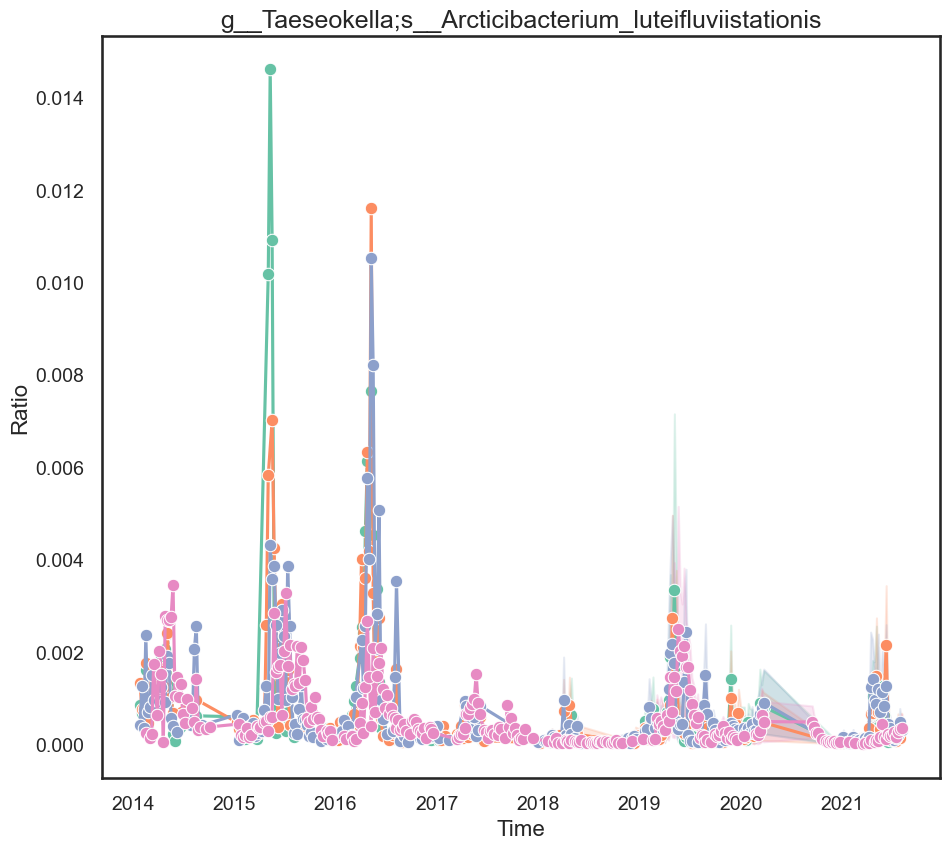

In [428]:
# Specify the feature ID to plot
target_feature = '88d53316693e14de82bb3e5bdeedb951'  # replace with the actual feature id

# Filter the DataFrame for the target feature.
# Assuming newseparated has columns 'feature_id', 'datetime', and 'ratio'
df_feature = newseparated[newseparated['feature_id'] == target_feature].copy()


# Sort by datetime to ensure proper ordering
df_feature.sort_values('datetime', inplace=True)

# Create the time series plot using Seaborn
plt.figure(figsize=(10, 9))
sns.lineplot(data=df_feature, x='datetime', y='ratio', marker='o', hue='depth', palette="Set2", legend=False)
plt.title("g__Taeseokella;s__Arcticibacterium_luteifluviistationis")
plt.xlabel("Time")
plt.ylabel("Ratio")
plt.grid(False)
plt.tight_layout()

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.YearLocator())       # set major ticks to each year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # format ticks as 'YYYY'

plt.savefig('figures/TS'+target_feature+'.png', bbox_inches='tight')
plt.show()


In [435]:
merged_df.sort_values('datetime')

,feature_id,avg_ratio,max_ratio,bloom_count,sampleid,size_code,depth_code,depth,weekn,datetime,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species,DNApr,[DNAt],feature_frequency,Total,ratio,nASVs,weekdepth,avg,diff,year,[DNA]ng/uL,weekdepthyr,rank,ranktot,shannon_diversity,blooming
603,0089c2ee62e4e072faf4a080fc7ae6e5,0.000742,0.022229,7,BB14.3D,W,D,60,3,2014-01-20,d__Bacteria; p__Planctomycetota; c__Planctomyc...,0.961286,d__Bacteria,p__Planctomycetota,c__Planctomycetes,o__Pirellulales,f__Pirellulaceae,g__Blastopirellula,s__uncultured_planctomycete,NaN,NaN,3.000000,16191.000000,0.000185,290,360,290.000000,0.000000,2014,NaN,3602014,268.0,0.924138,6.132187,False
5915,0f884dfb9df92cf2aad15aecedfe400a,0.000659,0.012011,1,BB14.3C,W,C,10,3,2014-01-20,d__Bacteria; p__Bacteroidota; c__Bacteroidia; ...,0.999954,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Flavobacteriales,f__Cryomorphaceae,g__uncultured,s__metagenome,NaN,NaN,4.000000,7233.000000,0.000553,190,310,190.000000,0.000000,2014,NaN,3102014,172.0,0.905263,5.274932,False
49471,eb8a0de250c9ebe3eaf2d609b763f2c6,0.000776,0.016839,1,BB14.3A,W,A,1,3,2014-01-20,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.999663,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Rickettsiales,f__Mitochondria,g__Mitochondria,s__uncultured_bacterium,NaN,NaN,7.000000,27724.000000,0.000252,438,31,438.000000,0.000000,2014,NaN,312014,272.5,0.622146,5.395147,False
1674,01b6055d816dfa26f1049780d85de084,0.000971,0.010537,1,BB14.3C,W,C,10,3,2014-01-20,d__Bacteria; p__Bacteroidota; c__Bacteroidia; ...,0.711154,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Sphingobacteriales,f__NS11-12_marine_group,g__NS11-12_marine_group,s__unidentified_marine,NaN,NaN,20.000000,7233.000000,0.002765,190,310,190.000000,0.000000,2014,NaN,3102014,56.0,0.294737,5.274932,False
34633,9fec7c562f83187f9aa4d9ac472effbb,0.000838,0.028026,10,BB14.3A,W,A,1,3,2014-01-20,d__Bacteria; p__Bacteroidota; c__Bacteroidia; ...,0.999245,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Bacteroidales,f__Marinifilaceae,g__uncultured,s__uncultured_marine,NaN,NaN,4.000000,27724.000000,0.000144,438,31,438.000000,0.000000,2014,NaN,312014,351.5,0.802511,5.395147,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28613,88d53316693e14de82bb3e5bdeedb951,0.000714,0.014607,5,BB21.31DSL,SL,D,60,31,2021-08-02,d__Bacteria; p__Bacteroidota; c__Bacteroidia; ...,0.719275,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Cytophagales,f__Spirosomaceae,g__Taeseokella,s__Arcticibacterium_luteifluviistationis,0.001275,15453.3,0.024221,135.022539,0.000179,467,NaN,458.056180,8.943820,2021,NaN,3160nan,363.0,0.777302,7.173619,False
40248,b8bb9acc65aeb1dc365e4dbb6ce4dca1,0.000494,0.014637,2,BB21.31DL,L,D,60,31,2021-08-02,d__Bacteria; p__Proteobacteria; c__Gammaproteo...,1.000000,d__Bacteria,p__Proteobacteria,c__Gammaproteobacteria,o__Vibrionales,f__Vibrionaceae,Unassigned,Unassigned,NaN,NaN,14.000000,29143.000000,0.000480,369,3160,318.162562,50.837438,2021,19.7,31602021,195.0,0.528455,6.175466,False
2285,029ad2e1900c4019bd98d0e96b51a1a2,0.000915,0.011494,1,BB21.31BSL,SL,B,5,31,2021-08-02,d__Bacteria; p__Proteobacteria; c__Alphaproteo...,0.989975,d__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Caulobacterales,f__Hyphomonadaceae,g__uncultured,Unassigned,0.001378,28163.2,0.076412,132.293646,0.000578,386,NaN,331.228661,54.771339,2021,NaN,315nan,293.5,0.760363,7.772675,False
44690,d4669f212ebaa4217d7049c411bbbbe0,0.000847,0.015712,2,BB21.31BSL,SL,B,5,31,2021-08-02,d__Bacteria; p__Bacteroidota; c__Bacteroidia; ...,0.867277,d__Bacteria,p__Bacteroidota,c__Bacteroidia,o__Sphingobacteriales,f__NS11-12_marine_group,g__NS11-12_marine_group,s__uncultured_marine,0.001378,28163.2,0.149813,132.293646,0.001132,386,NaN,331.228661,54.771339,2021,NaN,315nan,197.5,0.511658,7.772675,False


In [436]:
bloom_counts

,datetime,depth,bloom_count
0,2014-02-03,1,0
1,2014-02-03,5,1
2,2014-02-03,10,0
3,2014-02-03,60,1
4,2014-02-17,1,0
...,...,...,...
779,2021-07-26,60,1
780,2021-08-02,1,0
781,2021-08-02,5,0
782,2021-08-02,10,1


<Figure size 1200x800 with 0 Axes>

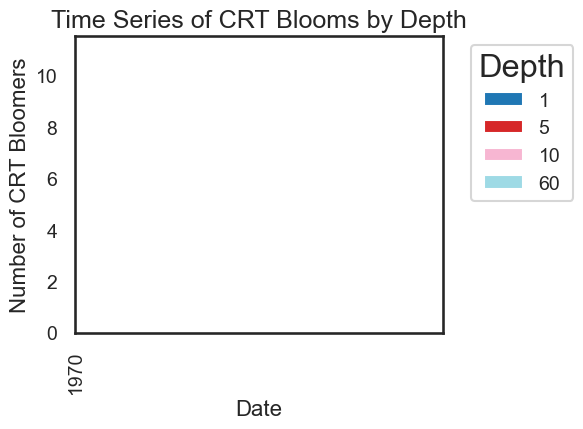

In [432]:
# Ensure datetime is parsed correctly
merged_df['datetime'] = pd.to_datetime(merged_df['datetime'])

# Define a bloom threshold (e.g. features with ratio > 0.01 are considered blooming)
bloom_threshold = 0.01

# Add a boolean column 'blooming'
merged_df['blooming'] = merged_df['ratio'] > bloom_threshold

# For each sample (date) and depth, count the number of unique features that are blooming.
# (We use nunique() in case the same feature appears more than once.)
bloom_counts = merged_df[merged_df['blooming']].groupby(['datetime', 'depth'])['feature_id'] \
                .nunique().reset_index(name='bloom_count')

# Pivot the table so that rows are datetime and columns are depths
bloom_pivot = bloom_counts.pivot(index='datetime', columns='depth', values='bloom_count').fillna(0)

# Sort by datetime
bloom_pivot = bloom_pivot.sort_index()

In [438]:
import pandas as pd
import plotly.express as px

# Assume bloom_counts is your DataFrame with the following columns:
# 'datetime' (sample date), 'depth' (depth), and 'bloom_count' (number of blooms for that depth at that date).
# Ensure datetime is in datetime format.
bloom_counts['datetime'] = pd.to_datetime(bloom_counts['datetime'])

# Create a line plot with different lines for each depth.
fig = px.line(
    bloom_counts,
    x='datetime',
    y='bloom_count',
    color='depth',
    title='CRT Blooms Over Time by Depth',
    labels={
        'datetime': 'Date',
        'bloom_count': 'Number of CRT Blooms',
        'depth': 'Depth'
    }
)

# Format the x-axis to display only the year.
fig.update_layout(xaxis=dict(tickformat='%Y'))

fig.show()


In [182]:
newseparated

,sampleid,feature_id,size_code,depth_code,depth,weekn,datetime,Taxon,Confidence,Domain,Phylum,Class,Order,Family,Genus,Species,DNApr,[DNAt],feature_frequency,Total,ratio,nASVs,weekdepth,avg,diff,year,[DNA]ng/uL,rank,ranktot,shannon_diversity
0,BB22.18ASL,75ceeaa937c64399438614ca3706cf2a,SL,A,1,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.518519,35.1,246.296296,222269.539190,0.001108,1469,181,869.375560,599.624440,NaN,NaN,191.0,0.130020,8.757472
1,BB22.18BSL,75ceeaa937c64399438614ca3706cf2a,SL,B,5,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.574074,37.8,4570.055556,250615.859519,0.018235,1308,185,780.497482,527.502518,NaN,NaN,3.5,0.002676,8.491775
2,BB22.18BSL,75ceeaa937c64399438614ca3706cf2a,SL,B,5,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.425926,37.8,4570.055556,250615.859519,0.018235,1308,185,780.497482,527.502518,NaN,NaN,3.5,0.002676,8.491775
3,BB22.18CSL,75ceeaa937c64399438614ca3706cf2a,SL,C,10,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.824176,45.5,1923.318681,181488.024830,0.010597,1002,1810,588.251292,413.748708,NaN,NaN,13.5,0.013473,8.220470
4,BB22.18CSL,75ceeaa937c64399438614ca3706cf2a,SL,C,10,18,2019-05-06,d__Bacteria; p__Cyanobacteria; c__Cyanobacteri...,1.000000,d__Bacteria,p__Cyanobacteria,c__Cyanobacteriia,o__Chloroplast,f__Chloroplast,g__Chloroplast,s__Eutreptiella_pomquetensis,0.175824,45.5,1923.318681,181488.024830,0.010597,1002,1810,588.251292,413.748708,NaN,NaN,13.5,0.013473,8.220470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072833,BB18.47BS,cd1c78b74af80f29c42521cc5560532a,S,B,5,47,2018-11-19,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,26567.000000,0.000038,487,475,826.008729,-339.008729,2018,24.2,483.5,0.992813,7.227867
1072834,BB18.48AS,c6df4cd74a21372a43bf3b4a3b4e5ef8,S,A,1,48,2018-11-26,d__Bacteria; p__Proteobacteria; c__Gammaproteo...,0.737806,d__Bacteria,p__Proteobacteria,c__Gammaproteobacteria,o__Enterobacterales,f__Yersiniaceae,g__Serratia,Unassigned,NaN,NaN,1.000000,44691.000000,0.000022,670,481,966.594962,-296.594962,2018,25.2,666.5,0.994776,7.549046
1072835,BB18.5DS,9ccbc4dd1d0b20027261de36938930e6,S,D,60,5,2018-01-29,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,84946.000000,0.000012,725,560,826.428390,-101.428390,2018,24.2,721.0,0.994483,6.608167
1072836,BB18.8DS,b79a88263ae65bbcfc700a592229c142,S,D,60,8,2018-02-19,NaN,NaN,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,Unassigned,NaN,NaN,1.000000,66930.000000,0.000015,707,860,980.103193,-273.103193,2018,20.7,704.0,0.995757,7.051237


In [ ]:
#prep for network

In [184]:
df=newseparated.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df['weekn'] = df['datetime'].dt.isocalendar().week
df['year'] = df['datetime'].dt.year  # if not already int


In [185]:
# Define the mask
mask_common = (
    (df['depth'] == 1) &
    (df['size_code'].isin(['W', 'SL'])) &
    (df['weekn'] >= 36) &
    (df['weekn'] <= 41)
)

# One for all years EXCEPT 2019
df_non_2019 = df[mask_common & (df['year'] != 2019)]

# One for ONLY 2019
df_2019 = df[mask_common & (df['year'] == 2019)]


In [190]:
def make_asv_table(df):
    # Sum abundances per sampleid and ASV (feature_id)
    pivot = df.groupby(['sampleid', 'feature_id'])['ratio'].sum().unstack(fill_value=0)
    return pivot

asv_non_2019 = make_asv_table(df_non_2019)
asv_2019 = make_asv_table(df_2019)


In [191]:
asv_non_2019

feature_id,0008eaa2273f0f3b5fe8c23dfa8526b1,00101009628bd733b50369257df00d1b,0014615dbc7bed50b074a0db764ca4f5,0022080d04d9ad505c6f314184bb7f71,0025cae6234be7776fa607cf19cbf87a,004c7bce163f9388ec1ddc2152ea2ba4,005a74c1ad32aaf0ce86eb7f5affba17,008512f96af645cd0190af89f917f0b0,0089c2ee62e4e072faf4a080fc7ae6e5,009cdbab8ec4e73afa9896e976ef4e79,00b7dd923d56dc05c116471cdc12fd9d,00e047a89c3cc1d2d459545ac75f18ed,00e6c13fe86364a5084987093afa1916,00e709526cbd2288c828a9a3c9665780,00fa2d811eef1b56a62909c2cd8b0711,01077bdd175ece73501a988d4f4ba4c9,012054e3f62502aff7f455e1592ea87f,0129f982224a5b1bca12f2ffe6a7d845,0153d3563d0b5035739322eb6572d3f4,0153e0d434f3c609249b0a651ad8db16,0169015d2a76d4890d8db7265da59e50,0180392035a98ecc99efc2bc4839136c,01814f7f5b7124f5fab3ecce1a85328f,0184b0e8cdfb040dfd7e1d74c2cdc76e,01874a5f6a88aa5196a4c6d1db4d910d,01b5c89090e1742775fd079608e32ea5,01b6055d816dfa26f1049780d85de084,01d2ef376d0da4d9d4545ca325125b15,01e3a10453a0f7cc6f327b8091090c58,01eb892495890df5ed35ff5ece71bfce,01f81b77beac72bb2b7ec0725643c68a,01f8c9d4340f8edd4717b8d00260427c,021829170463632e041095dab11c0e95,023afc3a991fd3d034caa37683e1b7c0,023bd0a00038705284fd5a83c817f9ff,02541fa082aa960dbf17e925a5bb585d,0257df5ce232ff8a46974cb959347ab4,02598367c3084826db395f6a326aa50f,02655a5ef7185614f9edd8945dc93578,026bd86bedc14ae8e7b65a17018e1de3,027d51e2ec04b5b34f84b81c66d15843,02840be01bf066f2008e106a552e98f4,0294f941b3b29cb483087d59457e5d89,0298327a0db38bca5a44d0248aaa168d,029ad2e1900c4019bd98d0e96b51a1a2,029bd041ca0c7b76bbd128368a34416a,02a866ccb1a98e57168e1b363ce2110d,02b580d891306ba259d08220a03c7cda,02c9e3ca47db18e965bd406cd940a37e,02dd2eb5fefdc3d770b2d8cb56eb93ec,02f958a986eaec38e427007101c2a413,0305d01a68a585a3df8286ffd0ee9ded,033e54071234cb056e7db1dc58a021be,034f7f84476669bb8dd14d9b37171207,0379ae1dbafc948a7616a05a269c8df9,0390c8ed1635332aefc6e78e01f39f43,03b575bd7ea07947c68c3a4a7035eda6,03f01a2d8ead2af6143f4af447ecc5f5,03f9b4536cfa51fc6adddc65b22bbfc8,040326cfa264b512d23d6dc4920af828,0428d4091415129af55f930cf94cfbce,044c25f3683f568d8c4202ec3c57a495,045714384947ffd7e867681fa377c7b2,045fc124b9d1cbb8ab61ec1b49c3eb7d,0474303ad3962c3705e794cc3d3c7191,047bc5d9acd6864d3e7cbaf477d546ff,04884d87bd1633b949087fdb05b101b7,04c7537a847372f5c15a44d417213437,04d23e5c0a16672f8f0c99f9c8f80548,04df532cb5409811856791807a2b41ef,04e0ca07505ebc90a0efcb9a7a5e629f,04e22041f4a5c01f14a94b48c269ca4b,04eb36b8ca8b96a4035d3ec9c00e68ca,04f5c18fd5bd6486b3afa7374a05da41,05183b9353b8ee3e970c988b6aeb94cf,0518d6c0acb98dea5fb0da154dba8ad4,05335fb9933cfc0899e96a25f733b664,05587ee10c3a853b51335cb24a7a21f3,05667db2c2977769a7dbc18622cfd939,05704f527495abc3f1a5a6ee5d4d8b2e,058eb3bc5314ff1bb56b2d9647fbe2ca,058f90cda0a4f438dbaf12d015479658,05923c0ff8e39d61e11fb9d39aef9da0,05ab703387f697ac849eaf2e1e53a161,05b1a3ab2aede05c0794a9a83eb5a936,05b23de1fc1776cf3040ae3285139c39,05ce9423190fc1a0fadea3c10d96c449,05d092be3fbfe1ad00a40b88cd943292,05d69eb35aa651db2dd85f1c374bedc5,05e1d44741bf3c25ed5a8773ce1d971b,05f14b83c8e4b68fdd8422a77b23e198,0654efbf7abb8e47161a7c3b46140335,0659140fbf4d944a0111bc4f95e54a7e,065f718c0519522661f2d3b088f3bdee,0663ade4d06e30955491ebeae3b9fe19,067c3a5c3554628a444e6d8042248599,067c4a92a656d4091ecf04a292908758,069a6a0049be0ba7fb522db79ecbfc60,06a02c8a852b27651ddef23c4174e201,06ad8aee2710d4b77d4121a90e32bfb7,06b38c9c1b4191b8a7cb9d3b4e5aa40a,06dd3084e0a4af75d007a7d97735ee29,06e148ad8b35489ea97e51ef733e9550,071539b5d2f8e1d990035f66c9f1fb0f,072427541158f9d9069b174f85df2bb3,0742e826b67344f7acd05797aed205ac,07684c39e9745c2660134a8a1eacfa03,076ab9f3090189179024fd8d1faa16de,0780c22c545ff02f8993b1837b08b3c5,07834598dad6fc557d0e588f8538cee9,079371fb8cd7f51322f235bee045e597,07aaa77ecf15feb1425c3214f44f3695,07c746bc83ad0a05fcdcfcc201cd246c,07fcb594f125139297b506f9b821b34c,081137d110528eb47e413d73a6e3b465,081555c102b8b025bc9dd63d24e813e6,08279f309b55a907243d77fa5d8506f2,083fcf2bd04f2655663b1cebb52587a4,085108636a561ad2068b45ee0d4a31c6,085dad8dcf1a0bce9bfab7d66525aa66,0880ca692fccac905d681be047989

In [192]:
def preprocess_asv_matrix(asv_table, min_prevalence=0.2):
    min_samples = int(min_prevalence * asv_table.shape[0])
    return asv_table.loc[:, (asv_table > 0).sum(axis=0) >= min_samples]

asv_non_2019_filtered = preprocess_asv_matrix(asv_non_2019)
asv_2019_filtered = preprocess_asv_matrix(asv_2019)


In [193]:
corr_non_2019 = asv_non_2019_filtered.corr(method='spearman')
corr_2019 = asv_2019_filtered.corr(method='spearman')


In [194]:
import networkx as nx
import numpy as np

def build_network(corr_matrix, threshold=0.6):
    np.fill_diagonal(corr_matrix.values, 0)  # remove self-loops
    G = nx.Graph()

    for i in corr_matrix.index:
        for j in corr_matrix.columns:
            if i != j and abs(corr_matrix.loc[i, j]) >= threshold:
                G.add_edge(i, j, weight=corr_matrix.loc[i, j])
    return G

G_non_2019 = build_network(corr_non_2019)
G_2019 = build_network(corr_2019)


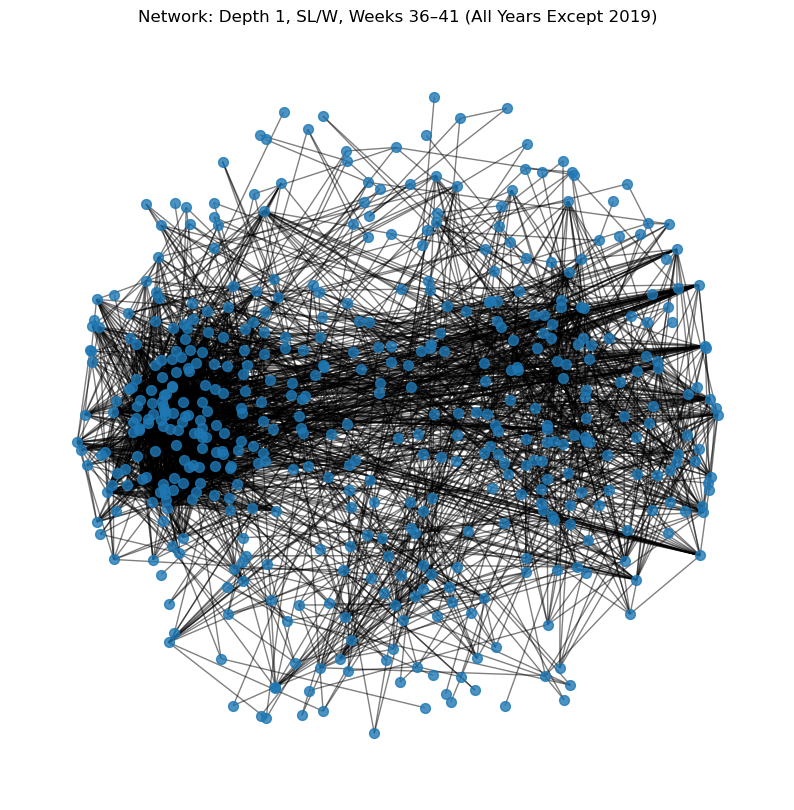

In [ ]:
import matplotlib.pyplot as plt

def plot_network(G, title):
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(G, k=0.3)
    nx.draw_networkx_nodes(G, pos, node_size=50, alpha=0.8)
    nx.draw_networkx_edges(G, pos, alpha=0.5)
    plt.title(title)
    plt.axis('off')
    plt.show()

plot_network(G_non_2019, "Network: Depth 1, SL/W, Weeks 36–41 (All Years Except 2019)")

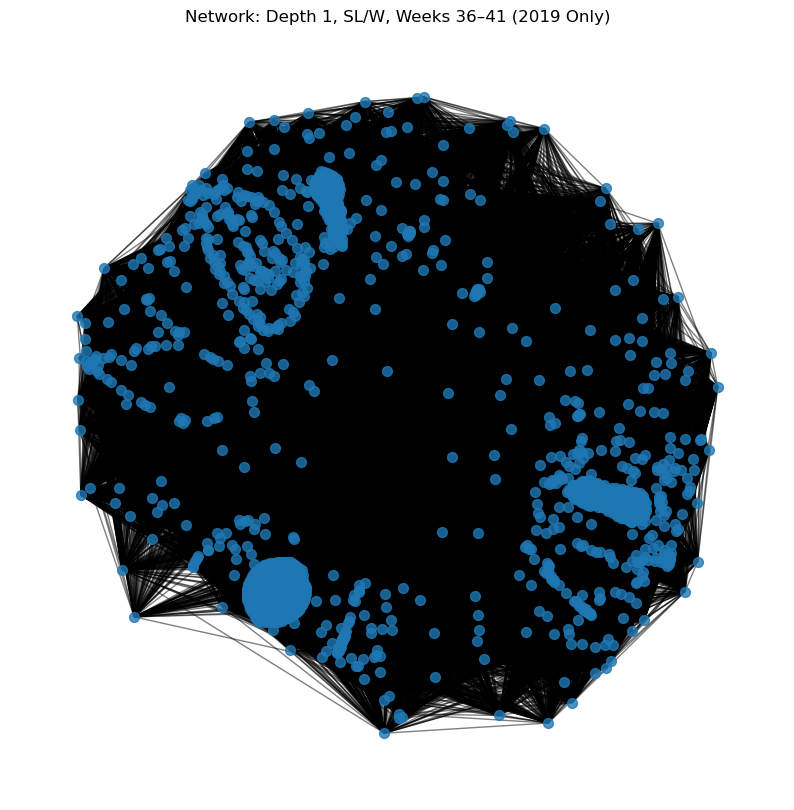

In [197]:
plot_network(G_2019, "Network: Depth 1, SL/W, Weeks 36–41 (2019 Only)")

In [198]:
def top_asvs_by_abundance(asv_matrix, n=50):
    top_asvs = asv_matrix.sum(axis=0).sort_values(ascending=False).head(n).index
    return asv_matrix[top_asvs]

asv_non_2019_top = top_asvs_by_abundance(asv_non_2019_filtered, n=50)
asv_2019_top = top_asvs_by_abundance(asv_2019_filtered, n=50)


In [199]:
corr_non_2019_top = asv_non_2019_top.corr(method='spearman')
corr_2019_top = asv_2019_top.corr(method='spearman')

G_non_2019_top = build_network(corr_non_2019_top, threshold=0.6)
G_2019_top = build_network(corr_2019_top, threshold=0.6)


In [200]:
# Extract feature_id to Genus mapping from full df
feature_to_genus = df.drop_duplicates(subset='feature_id').set_index('feature_id')['Genus'].to_dict()

In [201]:
def assign_genus_labels(G, mapping):
    for node in G.nodes:
        genus = mapping.get(node, "Unknown")
        G.nodes[node]['genus'] = genus

assign_genus_labels(G_non_2019_top, feature_to_genus)
assign_genus_labels(G_2019_top, feature_to_genus)


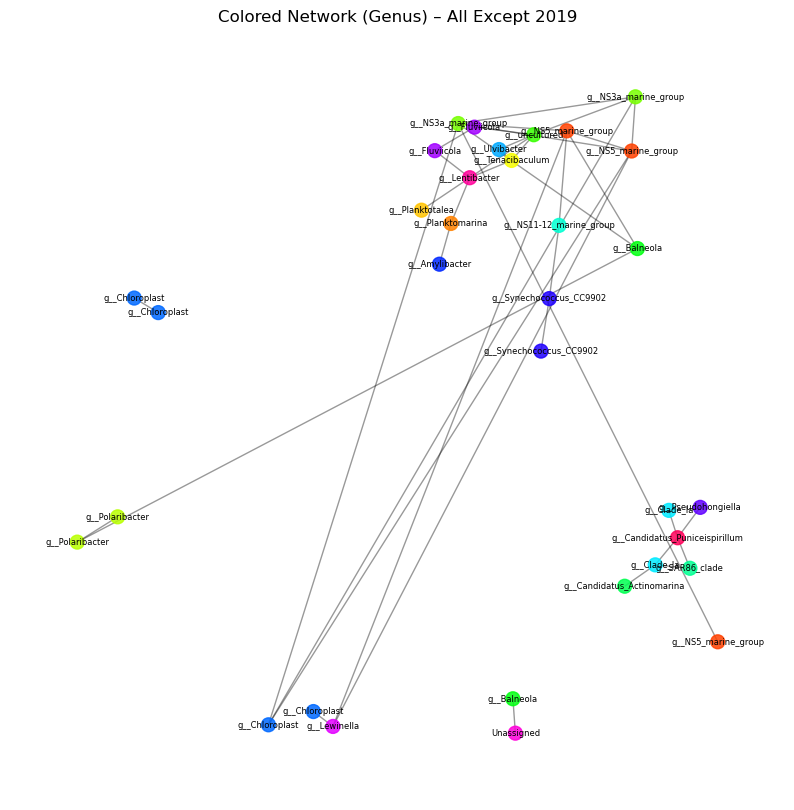

In [202]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_colored_network(G, title):
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(G, seed=42)

    # Get unique genera and assign colors
    genera = [G.nodes[n]['genus'] for n in G.nodes]
    unique_genera = list(set(genera))
    color_map = dict(zip(unique_genera, sns.color_palette("hsv", len(unique_genera))))
    node_colors = [color_map[G.nodes[n]['genus']] for n in G.nodes]

    nx.draw_networkx_nodes(G, pos, node_size=100, node_color=node_colors, alpha=0.85)
    nx.draw_networkx_edges(G, pos, alpha=0.4)
    nx.draw_networkx_labels(G, pos, labels={n: G.nodes[n]['genus'] for n in G.nodes}, font_size=6)

    plt.title(title)
    plt.axis('off')
    plt.show()

plot_colored_network(G_non_2019_top, "Colored Network (Genus) – All Except 2019")

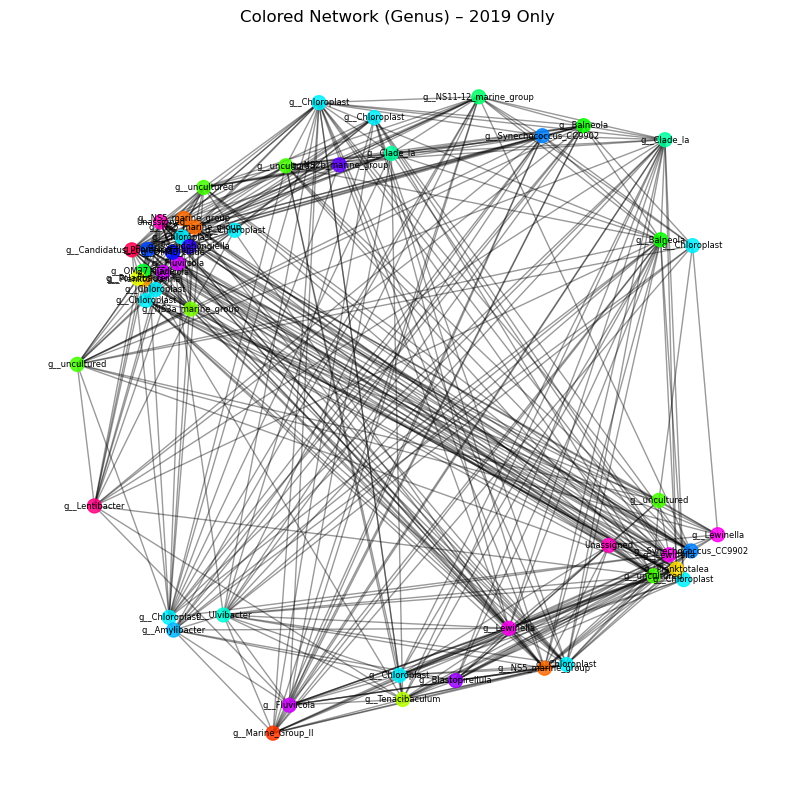

In [ ]:
plot_colored_network(G_2019_top, "Colored Network (Genus) – 2019 Only")

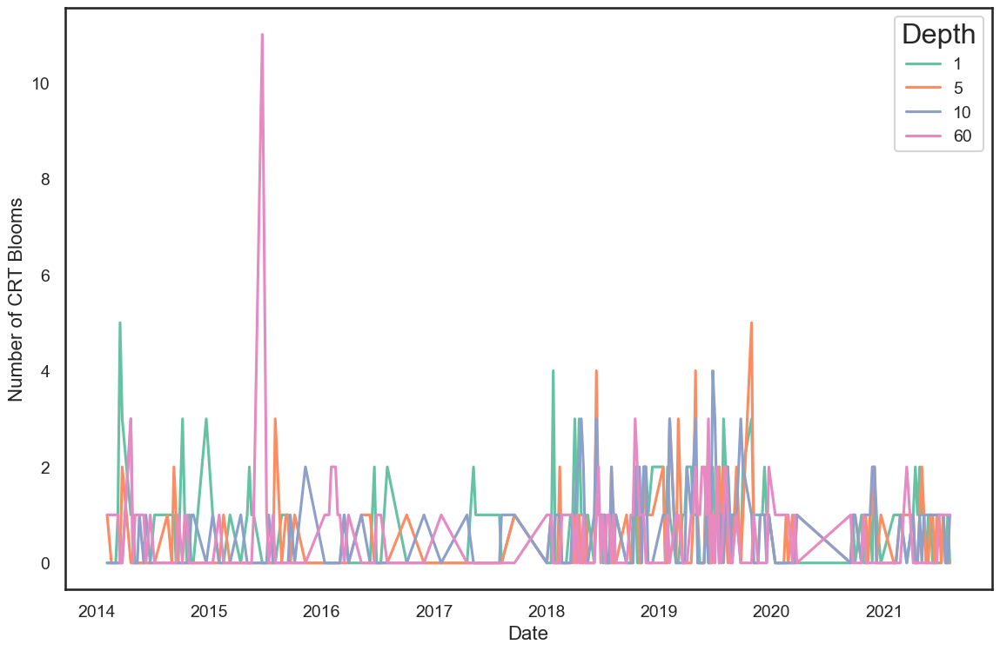

In [445]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates

# Ensure that the 'datetime' column is in datetime format.
bloom_counts['datetime'] = pd.to_datetime(bloom_counts['datetime'])
depth1=bloom_counts[bloom_counts['depth']==1]

plt.figure(figsize=(12, 8))
ax = sns.lineplot(data=bloom_counts, x='datetime', y='bloom_count', hue='depth', palette='Set2')

# Format the x-axis to display only the year.
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.xlabel('Date')
plt.ylabel('Number of CRT Blooms')
#plt.title('CRT Blooms Over Time by Depth')
plt.legend(title='Depth')

plt.tight_layout()

plt.savefig('figures/TS_CRTs.png', bbox_inches='tight')
plt.show()


In [358]:
import pandas as pd
import plotly.express as px
from math import ceil

def plot_phylo_time_series(df, level='family'):
    """
    Plots a time series stacked bar chart of relative abundances at a specified taxonomic level.
    
    Parameters:
      df: pandas DataFrame with at least the following columns:
          - 'sampleid': unique sample identifier
          - 'datetime': sample collection time (will be converted to datetime if needed)
          - 'ratio': relative abundance for each feature in that sample
          - <level>: the taxonomic column (e.g., 'family', 'genus', etc.)
      level: string; the taxonomic level to plot (e.g., 'family').
    
    Returns:
      A Plotly figure showing the stacked bar chart over time.
    """
    # Ensure the datetime column is parsed as datetime.
    df['datetime'] = pd.to_datetime(df['datetime'])
    
    # Subset to the columns we need.
    df_subset = df[['sampleid', 'datetime', 'ratio', level]].copy()
    
    # Group by sample, datetime, and the chosen taxonomic level.
    # Sum the ratio in case there are multiple entries per sample for the same taxon.
    df_grouped = df_subset.groupby(['sampleid', 'datetime', level])['ratio'].sum().reset_index()
    
    # If there are multiple samples per datetime, you could further aggregate 
    # (e.g., by taking the mean). Here, we assume one sample per time point.
    
    # Create a color palette with 20 colors based on Set2.
    base_colors = px.colors.qualitative.Set2  # This typically has 8 colors.
    n_base = len(base_colors)
    extended_colors = base_colors * ceil(20/n_base)
    extended_colors = extended_colors[:20]
    
    # Create the stacked bar chart.
    fig = px.bar(
        df_grouped,
        x='datetime',
        y='ratio',
        color=level,
        title=f"Time Series Stacked Bar Chart at {level.capitalize()} Level",
        labels={'datetime': 'Collection Time', 'ratio': 'Relative Abundance'},
        color_discrete_sequence=extended_colors,
        hover_data=['sampleid']
    )
    fig.update_layout(barmode='stack')
    fig.show()

# Example usage:
# Suppose your DataFrame is named newseparated and you want to plot at the 'family' level:
mergeddf1 = merged_df[merged_df['depth']==1]
plot_phylo_time_series(mergeddf1, level='Family')


/var/folders/kv/yq6jygk116l27q2bwnk25k0w0000gn/T/ipykernel_70626/1659877823.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [316]:
import plotly.express as px

# Specify the feature ID you want to plot
target_feature = '0089c2ee62e4e072faf4a080fc7ae6e5'  # replace with your actual feature id

# Filter the DataFrame for the target feature.
# Assumes newseparated has columns 'feature_id', 'datetime', 'ratio', and 'sampleid'
df_feature = newseparated[newseparated['feature_id'] == target_feature].copy()

# Optionally, sort by datetime if not already sorted.
df_feature.sort_values('datetime', inplace=True)

# Create the time series plot
fig = px.line(df_feature, 
              x='datetime', 
              y='ratio', 
              markers=True,
              title=f"Time Series of {target_feature}",
              hover_data=['sampleid'])
fig.update_layout(xaxis_title="Time", yaxis_title="Ratio")
fig.show()


In [307]:
crt_features = set(crt_table['feature_id'])
bloom_threshold = 0.01

# Filter newseparated for CRT features and rows where the ratio exceeds the bloom threshold.
crt_blooms = newseparated[newseparated['feature_id'].isin(crt_features) & (newseparated['ratio'] > bloom_threshold)]

# Count the number of CRT blooms per sample.
bloom_counts = crt_blooms.groupby('sampleid').size().reset_index(name='crt_bloom_count')

# ------------------
# Step 3. Merge with Sample Metadata.
# ------------------
# We assume newseparated has a 'datetime' column.
# Get one record per sample for datetime information.
sample_info = newseparated[['sampleid', 'datetime', 'depth']].drop_duplicates()

# Merge bloom counts with sample info.
sample_blooms = pd.merge(sample_info, bloom_counts, on='sampleid', how='left')
sample_blooms['crt_bloom_count'] = sample_blooms['crt_bloom_count'].fillna(0)
sample_blooms.sort_values('datetime', inplace=True)

# ------------------
# Step 4. Plot Time Series of CRT Blooms.
# ------------------
fig = px.line(sample_blooms, 
              x='datetime', 
              y='crt_bloom_count', 
              color='depth',
              markers=True,
              title='Time Series: Number of CRT Blooms per Sample',
              labels={'datetime': 'Collection Time', 'crt_bloom_count': 'Number of CRT Blooms'},
             hover_data=['sampleid'])

fig.show()

In [353]:
target_years = ['2019']

merged_df['weekn'] = pd.to_numeric(merged_df['weekn'])

filtered_df = merged_df[
    (merged_df['year'].isin(target_years)) &
    (merged_df['weekn'] >= 34) &
    (merged_df['weekn'] <= 50)
]
crt_in_samples = filtered_df[filtered_df['avg_ratio'].notna()]

crt_in_samples['feature_id'].unique()

array(['0089c2ee62e4e072faf4a080fc7ae6e5',
       '01b6055d816dfa26f1049780d85de084',
       '029ad2e1900c4019bd98d0e96b51a1a2',
       '044c25f3683f568d8c4202ec3c57a495',
       '045fc124b9d1cbb8ab61ec1b49c3eb7d',
       '06b38c9c1b4191b8a7cb9d3b4e5aa40a',
       '0f2551eb7c43e82c8bd59d9e51a5aadf',
       '0f6b6c63ffd11c2f72d06547917dfe21',
       '0f884dfb9df92cf2aad15aecedfe400a',
       '16c5237b7e0b26a6fb853b557396d68c',
       '195ea247db83e0610b18d380550c48e5',
       '1dda53416f231a3345668df39d4ae780',
       '2189a641530497ce7c6ca753e9d54666',
       '28803a23f1e05d8c3e750ebf6c2496c4',
       '29689715fec79e515e6210431c7fd28c',
       '2c58fb3cd7af382778c7aac4d37b9b6a',
       '309d51bdfc0949389ee4df96a446586f',
       '36898120f9081bdce1973ea2dba535a8',
       '372a9db1684d5f090deed89272461e57',
       '3a8a7409bdc33da14a01ec3e3313b9a7',
       '3aae25e731c488012db96988f8daaf52',
       '3bf21ecc00c50880519f91355eea5f7e',
       '3c82fd433295a1ce7c75545fddd80217',
       '3e8

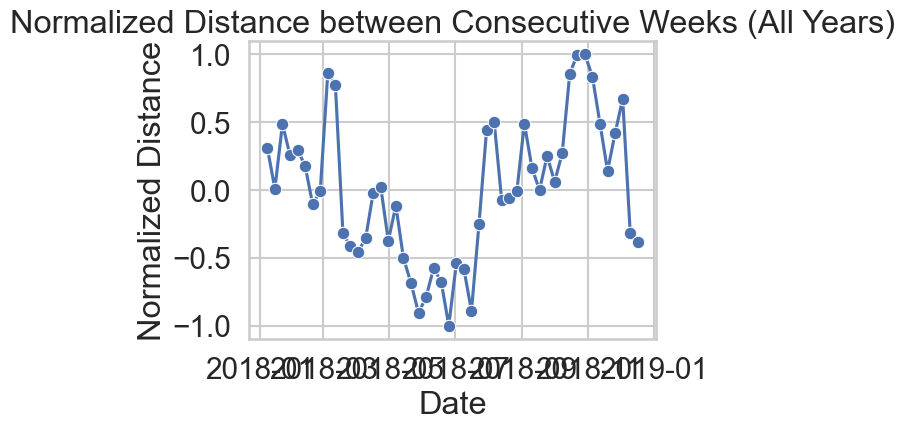

In [235]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.composition import multiplicative_replacement, clr
from skbio.stats.distance import DistanceMatrix
from scipy.spatial.distance import pdist, squareform
from skbio.diversity import beta_diversity

# Filter the dataframe for the desired size and depth only (all years)
df_filtered = newseparated.query("size_code == 'S' and depth_code == 'A' and year == 2018")

# Pivot the data to have samples x features
df_wide = df_filtered.pivot_table(
    index='sampleid',
    columns='feature_id',
    values='feature_frequency',
    fill_value=0
)

# Replace zeros for CLR transformation
data_replaced = multiplicative_replacement(df_wide.values)
data_clr = clr(data_replaced)
df_clr = pd.DataFrame(data_clr, index=df_wide.index, columns=df_wide.columns)

# Choose the distance metric: 'euclidean' for CLR or 'braycurtis' for raw counts.
metric = 'euclidean'  # change to 'braycurtis' if preferred

if metric == 'euclidean':
    # Compute Euclidean distances on CLR-transformed data
    dists = squareform(pdist(df_clr.values, metric='euclidean'))
    dist_ids = df_clr.index
else:
    # Compute Bray-Curtis distances on the raw count data
    bc_dm = beta_diversity(metric='braycurtis', counts=df_wide.values, ids=df_wide.index)
    dists = bc_dm.data
    dist_ids = bc_dm.ids

# Create a distance matrix and convert it to a DataFrame
dist_matrix = DistanceMatrix(dists, ids=dist_ids)
dist_df = dist_matrix.to_data_frame()

# Convert the square distance matrix to long format
dist_long = dist_df.reset_index().melt(
    id_vars='index', var_name='sample2', value_name='distance'
)
dist_long.rename(columns={'index': 'sample1'}, inplace=True)
dist_long = dist_long[dist_long['sample1'] != dist_long['sample2']].copy()  # remove self-comparisons

# Create metadata with sampleid, year, and week number. Compute a date and a numerical timepoint.
metadata_df = df_filtered[['sampleid', 'year', 'weekn']].drop_duplicates().copy()

# Convert year and weekn to numeric types
metadata_df['year'] = pd.to_numeric(metadata_df['year'], errors='coerce')
metadata_df['weekn'] = pd.to_numeric(metadata_df['weekn'], errors='coerce')

# Compute a timepoint that orders the samples chronologically.
# Here we assume each year has 52 weeks.
metadata_df['timepoint'] = metadata_df['year'] * 52 + metadata_df['weekn']

# Also compute a date from year and week number (assuming week starts on Monday)
metadata_df['date'] = metadata_df.apply(
    lambda row: pd.to_datetime(f"{int(row['year'])}-W{int(row['weekn']):02d}-1", format="%Y-W%W-%w"),
    axis=1
)

# Merge metadata into the distance long dataframe for both samples
dist_long = dist_long.merge(
    metadata_df[['sampleid', 'timepoint', 'date']].rename(
        columns={'sampleid': 'sample1', 'timepoint': 'tp1', 'date': 'date1'}
    ),
    on='sample1', how='left'
).merge(
    metadata_df[['sampleid', 'timepoint', 'date']].rename(
        columns={'sampleid': 'sample2', 'timepoint': 'tp2', 'date': 'date2'}
    ),
    on='sample2', how='left'
)

# Filter only consecutive timepoints (i.e. the later sample is exactly one week after the earlier)
dist_consecutive = dist_long[dist_long['tp2'] == dist_long['tp1'] + 1].copy()

# Normalize the distance metric to the interval [-1, 1]
min_d = dist_consecutive['distance'].min()
max_d = dist_consecutive['distance'].max()
dist_consecutive['norm_distance'] = 2 * (dist_consecutive['distance'] - min_d) / (max_d - min_d) - 1

# For plotting, we use the date of the second sample as the x-axis value.
sns.lineplot(data=dist_consecutive, x="date2", y="norm_distance", marker="o")
plt.title('Normalized Distance between Consecutive Weeks (All Years)')
plt.xlabel('Date')
plt.ylabel('Normalized Distance')
#plt.axvline(x=pd.to_datetime("2019-09-12"), color='r', linestyle='--')  # Replace with an appropriate date if needed
plt.tight_layout()
plt.show()


In [ ]:
taxonomic_bar_plot_by_week_no_other

In [403]:
df_y['weekn'] = pd.to_numeric(df_y['weekn'])
df_yW = df_y[df_y['weekn'] > 25 ]

In [406]:
fig = taxo_barplot(df_yW, tax_level='Genus', topn=300, order='least', 
                   abundance_col='feature_frequency', week_col='weekn')
fig.show()

In [339]:
crt_table = identify_CRT(df_y, feature_col='feature_id', 
                         abundance_col='ratio', bloom_threshold=0.0025, filter_crt=True)

print(crt_table)

fig = px.scatter(crt_table, 
                 x='avg_feature_frequency', 
                 y='max_feature_frequency',
                 size='bloom_count', 
                 hover_data=['feature_id'],

fig.show()


                            feature_id  avg_feature_frequency  max_feature_frequency  bloom_count
12    012054e3f62502aff7f455e1592ea87f               0.001057               0.002782            1
13    0129f982224a5b1bca12f2ffe6a7d845               0.001022               0.005814            1
18    0180392035a98ecc99efc2bc4839136c               0.001391               0.005766            3
19    0184b0e8cdfb040dfd7e1d74c2cdc76e               0.001266               0.003022            1
22    01b6055d816dfa26f1049780d85de084               0.001617               0.007592            3
...                                ...                    ...                    ...          ...
3876  fcf11ec8b80994412cebcb3c12ac3d58               0.002325               0.002700            1
3908  fe980881c8f03bec356a75c8186100ae               0.001045               0.004616            4
3918  ff1bd8113a59e63cbb44713fe3645ed6               0.001789               0.006271            6
3928  ff85d0744f1137

In [431]:
fig = plot_crt(df_y, feature_col='feature_id', 
               abundance_col='ratio', week_col='weekn', bloom_threshold=0.0035)
fig.show()

In [394]:
plotemp = bbmp_updated[['year', 'weekn', 'Temperature_BIO_bbmp', 'depth']]

In [397]:
plotemp = plotemp[plotemp['depth'] == 1]
plotemp = plotemp[plotemp['weekn'] > 30]
#plotemp = plotemp[plotemp['year'] == 2019]
plotemp['year'] = plotemp.year.astype(str)

<AxesSubplot: xlabel='weekn', ylabel='Temperature_BIO_bbmp'>

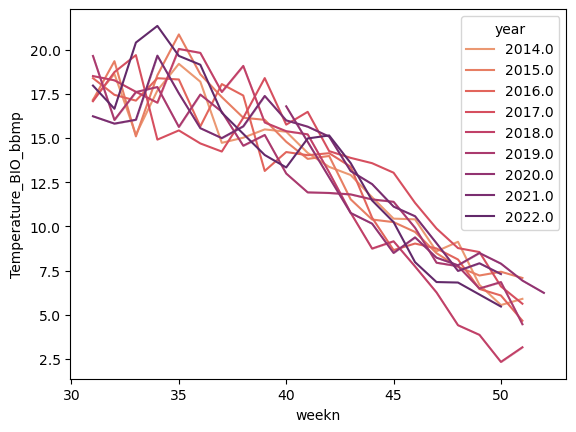

In [398]:
sns.lineplot(data=plotemp, x="weekn", y="Temperature_BIO_bbmp", hue="year", palette="flare")

In [400]:
fig = px.line(plotemp, x="weekn", y="Temperature_BIO_bbmp", color='year')
fig.show()
#in year 2019 -- big drop in temperature (earlier than usual at week 41)

In [17]:
data = newseparated[newseparated['year'] == 2019]
data = data[data['weekn'] >32]
data = data[data['weekn'] <45]

In [18]:
figs = taxbarplot_by_year(comm="mycomm", table=data, level="Family", depth=5, topn=15, include_other=False)

Find candidate events:
Determine the magnitude environmental shift
Duration:
Community level effect: (high, moderate, low)

What is our main question + subquestions?

In [60]:
def repeat_rarefy_df(df, sampling_depth: int, repeat_times: int, with_replacement: bool = True, random_state: int = None) -> pd.DataFrame:

    df_wide = df.pivot_table(index='sampleid', columns='feature_id', 
                             values='feature_frequency', fill_value=0)

    sample_totals = df_wide.sum(axis=1)


    samples_to_keep = sample_totals[sample_totals >= sampling_depth].index
    df_wide_filtered = df_wide.loc[samples_to_keep]

    print(f"Removed {df_wide.shape[0] - df_wide_filtered.shape[0]} samples from {df_wide.shape[0]} below the rarefaction depth of {sampling_depth}.")

    if random_state is not None:
        np.random.seed(random_state)
    
    # Check that each sample has enough counts to be rarefied.
    sample_totals = df_wide_filtered.sum(axis=1)
    if (sample_totals < sampling_depth).any():
        missing = sample_totals[sample_totals < sampling_depth]
        raise ValueError(f"Some samples have total counts below the sampling depth:\n{missing}")
    
    # Prepare to store each replicate's rarefied DataFrame.
    replicate_list = []
    
    # For each replicate, rarefy each sample.
    for rep in range(repeat_times):
        rarefied_rows = {}
        for sample in df_wide_filtered.index:
            counts = df_wide_filtered.loc[sample].values
            total = counts.sum()
            # Compute the relative proportions.
            proportions = counts / total
            
            # For now, we'll use np.random.multinomial which simulates sampling with replacement.
            # (If with_replacement=False, a different approach would be needed.)
            rarefied = np.random.multinomial(sampling_depth, proportions)
            rarefied_rows[sample] = rarefied
        rep_df = pd.DataFrame.from_dict(rarefied_rows, orient='index', columns=df_wide_filtered.columns)
        replicate_list.append(rep_df)
    
    # Average the replicate rarefied DataFrames.
    mean_rarefied = sum(replicate_list) / repeat_times
    # Apply ceiling to get integer counts.
    mean_rarefied = np.ceil(mean_rarefied).astype(int)
    
    return mean_rarefied

# Example usage:
# Assume df_counts is your DataFrame (samples as rows, features as columns)
# For example, if you want a rarefaction depth of 20,000 reads and 100 repeats:
# rarefied_df = repeat_rarefy_df(df_counts, sampling_depth=20000, repeat_times=100, random_state=42)
# print(rarefied_df)


In [143]:
# Extract only the columns of interest and remove duplicates.
df_plot = newseparated[['Total', 'nASVs', 'year', 'sampleid', 'weekn', 'depth', 'size_code']].drop_duplicates()

# Create a scatter plot.
fig = px.scatter(
    df_plot,
    x='Total',          # Sequencing depth (total reads)
    y='nASVs',          # Observed ASVs (richness)
    color='size_code',       # Color by year
    hover_data=['sampleid', 'weekn', 'depth'],
    title='Rarefaction Plot: Observed ASVs vs. Sequencing Depth'
)

fig.update_layout(
    xaxis_title='Sequencing Depth (Total Reads)',
    yaxis_title='Observed ASVs'
)

fig.show()

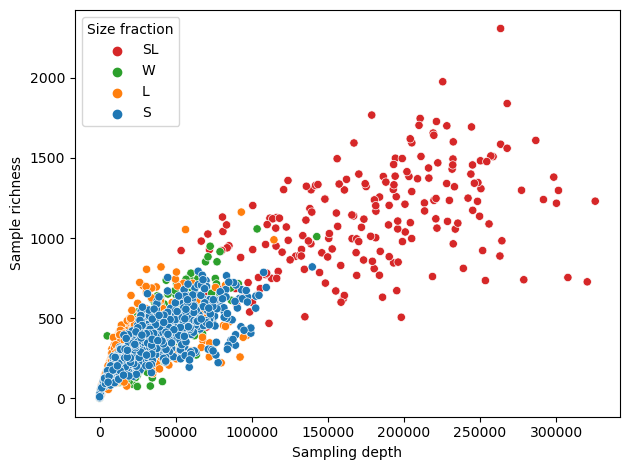

In [149]:
sns.scatterplot(data=df_plot, x="Total", y="nASVs", hue="size_code", palette=palette_dict)#, style="year")
plt.legend(title='Size fraction', loc='upper left')#, labels=['Hell Yeh', 'Nah Bruh'])
plt.xlabel('Sampling depth')
plt.ylabel('Sample richness')
plt.tight_layout()
plt.savefig('figures/Rarefaction_curve_all_depths_allSC.png', bbox_inches='tight')
plt.show()

In [61]:
import numpy as np
import pandas as pd
from skbio.diversity import alpha_diversity
from scipy.stats import entropy

# Assumes `df` is your feature table with samples as rows and features (ASVs) as columns
# If not, transpose: df = df.T

def shannon_diversity(counts):
    counts = counts[counts > 0]
    return entropy(counts, base=np.e)

def evenness(counts):
    counts = counts[counts > 0]
    if len(counts) <= 1:
        return 0.0
    return shannon_diversity(counts) / np.log(len(counts))

def rarefy_and_calc_metrics(counts, depth):
    if counts.sum() < depth:
        return np.nan, np.nan, np.nan  # Cannot rarefy
    # Subsample without replacement
    rarefied = np.random.choice(counts.index.repeat(counts.values), size=depth, replace=False)
    rare_counts = pd.Series(rarefied).value_counts()
    
    richness = rare_counts.count()
    shannon = shannon_diversity(rare_counts.values)
    even = evenness(rare_counts.values)
    
    return richness, shannon, even

def repeat_rarefy(table, depth, n_iter=100):
    results = []

    for i in range(n_iter):
        metrics = table.apply(lambda x: rarefy_and_calc_metrics(x, depth), axis=1)
        metrics_df = pd.DataFrame(metrics.tolist(), index=table.index, columns=['richness', 'shannon', 'evenness'])
        results.append(metrics_df)

    combined = pd.concat(results, axis=0, keys=range(n_iter))
    summary = combined.groupby(level=1).agg(['mean', 'std'])
    return summary

In [205]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def build_comparison_networks(df, 
                              excluded_years=[2019], 
                              weeks=[36, 37, 38, 39, 40, 41], 
                              max_asvs=50, 
                              tax_level='Genus', 
                              size_codes=['W', 'SL'],
                              depth_value=1,
                              corr_threshold=0.6):
    """
    Build and visualize two co-occurrence networks:
    1. For the specified year(s)
    2. For all other years
    Parameters:
        df (pd.DataFrame): long-format dataframe with abundance values and metadata
        excluded_years (list): year(s) to compare separately (e.g., [2019])
        weeks (list): week numbers to filter (default: 36–41)
        max_asvs (int): maximum number of ASVs to retain (top by abundance)
        tax_level (str): taxonomic level to label nodes (e.g., 'Genus', 'Family')
        size_codes (list): list of size codes to keep (e.g., ['W', 'SL'])
        depth_value (int): depth to include (e.g., 1)
        corr_threshold (float): threshold for edge creation based on correlation
    Returns:
        Tuple of two NetworkX graphs
    """

    # 1. Filter base data
    df['datetime'] = pd.to_datetime(df['datetime'])
    df['weekn'] = df['datetime'].dt.isocalendar().week
    df['year'] = df['datetime'].dt.year

    base_mask = (
        (df['depth'] == depth_value) &
        (df['size_code'].isin(size_codes)) &
        (df['weekn'].isin(weeks))
    )

    df_excluded = df[base_mask & (df['year'].isin(excluded_years))]
    df_rest = df[base_mask & (~df['year'].isin(excluded_years))]

    def make_asv_table(sub_df):
        pivot = sub_df.groupby(['sampleid', 'feature_id'])['[DNAt]'].sum().unstack(fill_value=0)
        return pivot

    def preprocess_and_filter(asv_table):
        # Keep top ASVs by total abundance
        top_asvs = asv_table.sum(axis=0).sort_values(ascending=False).head(max_asvs).index
        filtered = asv_table[top_asvs]
        return filtered

    def build_network(asv_matrix):
        corr = asv_matrix.corr(method='spearman')
        np.fill_diagonal(corr.values, 0)
        G = nx.Graph()
        for i in corr.index:
            for j in corr.columns:
                if abs(corr.loc[i, j]) >= corr_threshold:
                    G.add_edge(i, j, weight=corr.loc[i, j])
        return G

    def assign_taxonomy_labels(G, mapping):
        for node in G.nodes:
            taxon = mapping.get(node, "Unknown")
            G.nodes[node]['taxon'] = taxon

    def plot_network(G, title, filename):
        pos = nx.spring_layout(G, seed=42)
        taxa = [G.nodes[n]['taxon'] for n in G.nodes]
        unique_taxa = list(set(taxa))
        color_map = dict(zip(unique_taxa, sns.color_palette("hsv", len(unique_taxa))))
        node_colors = [color_map[G.nodes[n]['taxon']] for n in G.nodes]

        plt.figure(figsize=(10, 10))
        nx.draw_networkx_nodes(G, pos, node_size=100, node_color=node_colors, alpha=0.85)
        nx.draw_networkx_edges(G, pos, alpha=0.4)
        nx.draw_networkx_labels(G, pos, labels={n: G.nodes[n]['taxon'] for n in G.nodes}, font_size=6)
        plt.title(title)
        plt.axis('off')

        # Save the figure
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        plt.show()

    # Build ASV tables
    asv_excluded = preprocess_and_filter(make_asv_table(df_excluded))
    asv_rest = preprocess_and_filter(make_asv_table(df_rest))

    # Correlation-based networks
    G_excluded = build_network(asv_excluded)
    G_rest = build_network(asv_rest)

    # Map feature_id to taxon level
    feature_to_tax = df.drop_duplicates('feature_id').set_index('feature_id')[tax_level].to_dict()

    assign_taxonomy_labels(G_excluded, feature_to_tax)
    assign_taxonomy_labels(G_rest, feature_to_tax)

    # Plot
    plot_network(G_excluded, f"Network: Year(s) {excluded_years}", f"network_years_{'_'.join(map(str, excluded_years))}.png")
    plot_network(G_rest, f"Network: All Years Except {excluded_years}", f"network_all_except_{'_'.join(map(str, excluded_years))}.png")


    return G_excluded, G_rest


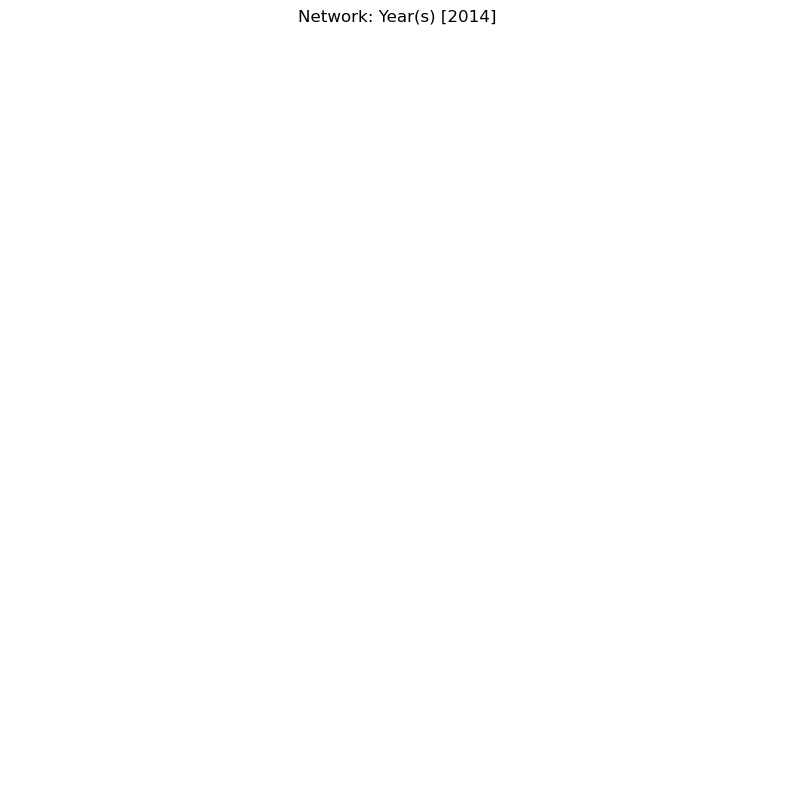

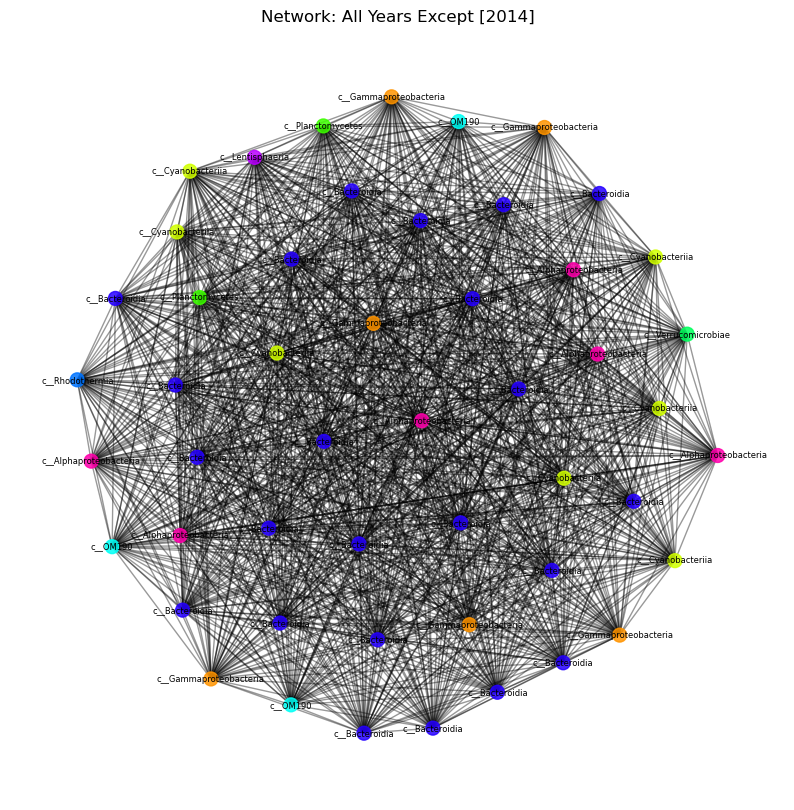

In [211]:
G_2019, G_others = build_comparison_networks(
    df=newseparated,
    excluded_years=[],
    max_asvs=50,
    tax_level='Class',
    weeks=list(range(36, 42))
)

In [220]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def build_comparison_networks_flexible(df, 
                                       excluded_years=[2019], 
                                       weeks=[36, 37, 38, 39, 40, 41], 
                                       max_asvs=50, 
                                       tax_level='Genus', 
                                       size_codes=['W', 'SL'],
                                       depth_value=1,
                                       corr_threshold=0.6,
                                       strict_size_code=True,
                                       output_prefix="network"):

    df['datetime'] = pd.to_datetime(df['datetime'])
    df['weekn'] = df['datetime'].dt.isocalendar().week
    df['year'] = df['datetime'].dt.year


    if strict_size_code:
        size_mask = df['size_code'].isin(size_codes)
    else:
        size_mask = df['size_code'].notna()  # allow all available codes

    base_mask = (
        (df['depth'] == depth_value) &
        size_mask &
        (df['weekn'].isin(weeks))
    )

    df_excluded = df[base_mask & (df['year'].isin(excluded_years))]
    df_rest = df[base_mask & (~df['year'].isin(excluded_years))]

    def make_asv_table(sub_df):
        if sub_df.empty:
            return pd.DataFrame()
        pivot = sub_df.groupby(['sampleid', 'feature_id'])['[DNAt]'].sum().unstack(fill_value=0)
        return pivot

    def preprocess_and_filter(asv_table):
        if asv_table.empty:
            return pd.DataFrame()
        top_asvs = asv_table.sum(axis=0).sort_values(ascending=False).head(max_asvs).index
        return asv_table[top_asvs]

    def build_network(asv_matrix):
        if asv_matrix.empty or asv_matrix.shape[1] < 2:
            return nx.Graph()

        # Apply log1p transformation
        log_asv = np.log1p(asv_matrix)

        # Pearson correlation on log-transformed data
        corr = log_asv.corr(method='pearson')
        np.fill_diagonal(corr.values, 0)

        G = nx.Graph()
        for i in corr.index:
            for j in corr.columns:
                if abs(corr.loc[i, j]) >= corr_threshold:
                    G.add_edge(i, j, weight=corr.loc[i, j])
        return G

    def assign_taxonomy_labels(G, mapping):
        for node in G.nodes:
            taxon = mapping.get(node, "Unknown")
            G.nodes[node]['taxon'] = taxon

    def plot_network(G, title, filename):
        if G.number_of_nodes() == 0:
            print(f"[!] Skipping plot for {title} — no valid nodes.")
            return
        pos = nx.spring_layout(G, seed=42)
        taxa = [G.nodes[n]['taxon'] for n in G.nodes]
        unique_taxa = list(set(taxa))
        color_map = dict(zip(unique_taxa, sns.color_palette("hsv", len(unique_taxa))))
        node_colors = [color_map[G.nodes[n]['taxon']] for n in G.nodes]

        plt.figure(figsize=(10, 10))
        nx.draw_networkx_nodes(G, pos, node_size=100, node_color=node_colors, alpha=0.85)
        nx.draw_networkx_edges(G, pos, alpha=0.4)
        nx.draw_networkx_labels(G, pos, labels={n: G.nodes[n]['taxon'] for n in G.nodes}, font_size=6)
        plt.title(title)
        plt.axis('off')
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        plt.show()

    # Process
    asv_excluded = preprocess_and_filter(make_asv_table(df_excluded))
    asv_rest = preprocess_and_filter(make_asv_table(df_rest))

    G_excluded = build_network(asv_excluded)
    G_rest = build_network(asv_rest)

    # Get taxonomy map
    feature_to_tax = df.drop_duplicates('feature_id').set_index('feature_id')[tax_level].to_dict()
    assign_taxonomy_labels(G_excluded, feature_to_tax)
    assign_taxonomy_labels(G_rest, feature_to_tax)

    # Plot and save
    year_label = '_'.join(map(str, excluded_years))
    size_label = '_'.join(size_codes) if strict_size_code else 'auto'

    plot_network(G_excluded, f"Excluded Year(s): {year_label}", f"{output_prefix}_excluded_{year_label}_{size_label}.png")
    plot_network(G_rest, f"All Except: {year_label}", f"{output_prefix}_rest_not_{year_label}_{size_label}.png")

    return G_excluded, G_rest


[!] Skipping plot for Excluded Year(s): 2014 — no valid nodes.


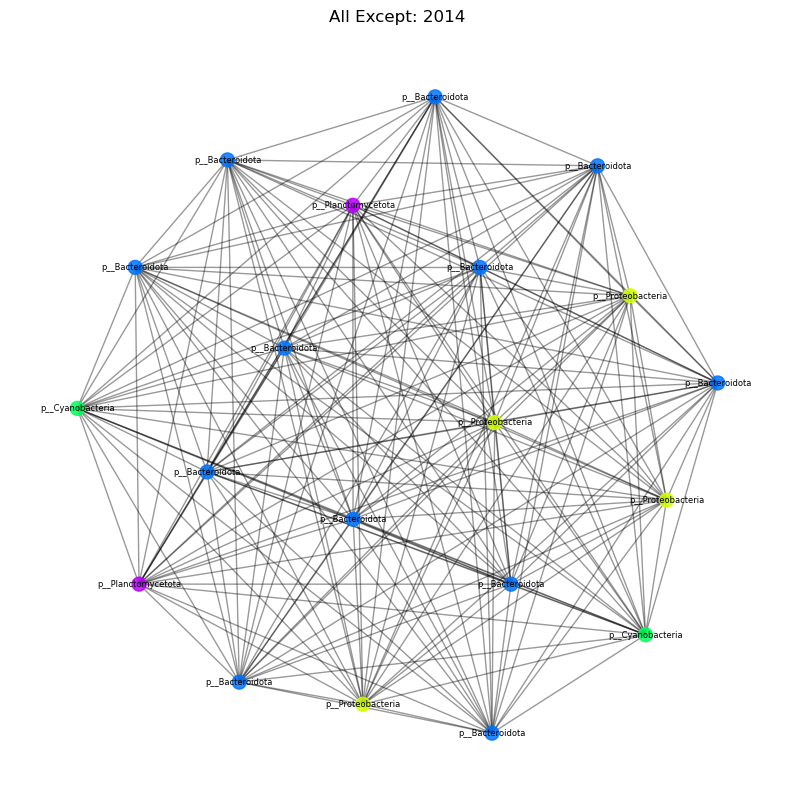

In [222]:
G_old, G_rest = build_comparison_networks_flexible(
    df=newseparated,
    excluded_years=[2014],
    max_asvs=20,
    tax_level='Phylum',
    size_codes=['W', 'SL'],
    strict_size_code=False  # ← allows any size code present in each group
)

In [233]:
def build_taxonomic_networks(df, 
                              excluded_years=[2019], 
                              weeks=[36, 37, 38, 39, 40, 41], 
                              max_nodes=50, 
                              tax_level='Genus', 
                              size_codes=['W', 'SL'],
                              depth_value=1,
                              corr_threshold=0.6,
                              strict_size_code=True,
                              output_prefix="network"):

    # Prepare datetime and filtering columns
    df['datetime'] = pd.to_datetime(df['datetime'])
    df['weekn'] = df['datetime'].dt.isocalendar().week
    df['year'] = df['datetime'].dt.year

    # Filter size code
    size_mask = df['size_code'].isin(size_codes) if strict_size_code else df['size_code'].notna()

    # Base filter for all data
    base_mask = (
        (df['depth'] == depth_value) &
        size_mask &
        (df['weekn'].isin(weeks))
    )

    df_excluded = df[base_mask & (df['year'].isin(excluded_years))]
    df_rest = df[base_mask & (~df['year'].isin(excluded_years))]

    # Function to create a taxon-level abundance table
    def make_tax_table(sub_df):
        if sub_df.empty:
            return pd.DataFrame()
        pivot = sub_df.groupby(['sampleid', tax_level])['ratio'].sum().unstack(fill_value=0)
        return pivot

    # Keep only top N most abundant taxonomic groups
    def filter_top_taxa(table):
        if table.empty:
            return pd.DataFrame()
        top_taxa = table.sum(axis=0).sort_values(ascending=False).head(max_nodes).index
        return table[top_taxa]

    # Build correlation-based network
    def build_network(table):
        if table.empty or table.shape[1] < 2:
            return nx.Graph()
        log_table = np.log1p(table)
        corr = log_table.corr(method='pearson')
        np.fill_diagonal(corr.values, 0)
        G = nx.Graph()
        for i in corr.index:
            for j in corr.columns:
                if abs(corr.loc[i, j]) >= corr_threshold:
                    G.add_edge(i, j, weight=corr.loc[i, j])
        return G

    # Plot and save network
    def plot_network(G, title, filename):
        if G.number_of_nodes() == 0:
            print(f"[!] Skipping plot for {title} — no valid nodes.")
            return
        pos = nx.spring_layout(G, seed=42)
        nodes = list(G.nodes)
        color_map = dict(zip(nodes, sns.color_palette("hsv", len(nodes))))
        node_colors = [color_map[n] for n in nodes]

        plt.figure(figsize=(6, 6))
        nx.draw_networkx_nodes(G, pos, node_size=100, node_color=node_colors, alpha=0.85)
        nx.draw_networkx_edges(G, pos, alpha=0.4)
        nx.draw_networkx_labels(G, pos, font_size=7)
        plt.title(title)
        plt.axis('off')
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        plt.show()

    # Process both groups
    tax_table_excluded = filter_top_taxa(make_tax_table(df_excluded))
    tax_table_rest = filter_top_taxa(make_tax_table(df_rest))

    G_excluded = build_network(tax_table_excluded)
    G_rest = build_network(tax_table_rest)

    # Plot and save
    year_label = '_'.join(map(str, excluded_years))
    size_label = '_'.join(size_codes) if strict_size_code else 'auto'

    plot_network(G_excluded, 
                 f"{tax_level} network – year(s): {year_label}", 
                 f"{output_prefix}_{tax_level.lower()}_excluded_{year_label}_{size_label}.png")

    plot_network(G_rest, 
                 f"{tax_level} network – all but: {year_label}", 
                 f"{output_prefix}_{tax_level.lower()}_not_{year_label}_{size_label}.png")

    return G_excluded, G_rest


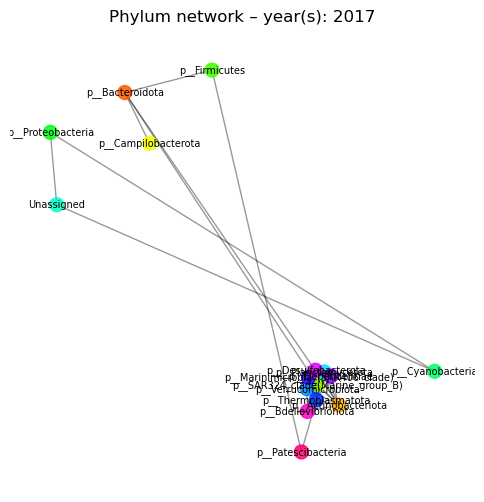

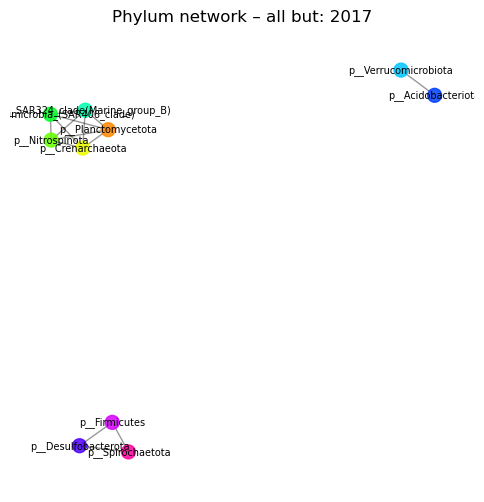

In [253]:
G_phylum_2019, G_phylum_rest = build_taxonomic_networks(df=newseparated, excluded_years=[2017], weeks=[37,38,39,40,41,42], #disturbance was 36.5 at 2019
                                                        depth_value=1,tax_level='Phylum', max_nodes=20,size_codes=['W', 'SL'],strict_size_code=True,corr_threshold=0.7)


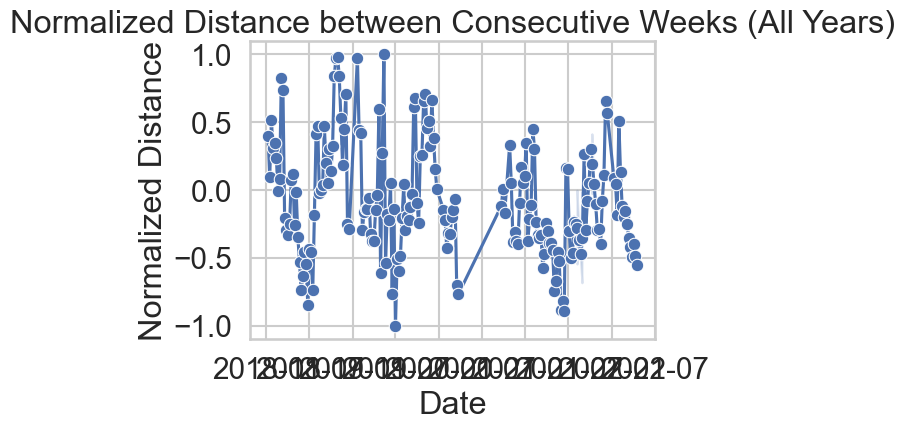

In [259]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.composition import multiplicative_replacement, clr
from skbio.stats.distance import DistanceMatrix
from scipy.spatial.distance import pdist, squareform
from skbio.diversity import beta_diversity

# Filter the dataframe for the desired size and depth only (all years)
df_filtered = newseparated.query("size_code == 'S' and depth_code == 'A'")
                                 #and year == 2019")

# Pivot the data to have samples x features
df_wide = df_filtered.pivot_table(
    index='sampleid',
    columns='feature_id',
    values='feature_frequency',
    fill_value=0
)

# Replace zeros for CLR transformation
data_replaced = multiplicative_replacement(df_wide.values)
data_clr = clr(data_replaced)
df_clr = pd.DataFrame(data_clr, index=df_wide.index, columns=df_wide.columns)

# Choose the distance metric: 'euclidean' for CLR or 'braycurtis' for raw counts.
metric = 'euclidean'  # change to 'braycurtis' if preferred

if metric == 'euclidean':
    # Compute Euclidean distances on CLR-transformed data
    dists = squareform(pdist(df_clr.values, metric='euclidean'))
    dist_ids = df_clr.index
else:
    # Compute Bray-Curtis distances on the raw count data
    bc_dm = beta_diversity(metric='braycurtis', counts=df_wide.values, ids=df_wide.index)
    dists = bc_dm.data
    dist_ids = bc_dm.ids

# Create a distance matrix and convert it to a DataFrame
dist_matrix = DistanceMatrix(dists, ids=dist_ids)
dist_df = dist_matrix.to_data_frame()

# Convert the square distance matrix to long format
dist_long = dist_df.reset_index().melt(
    id_vars='index', var_name='sample2', value_name='distance'
)
dist_long.rename(columns={'index': 'sample1'}, inplace=True)
dist_long = dist_long[dist_long['sample1'] != dist_long['sample2']].copy()  # remove self-comparisons

# Create metadata with sampleid, year, and week number. Compute a date and a numerical timepoint.
metadata_df = df_filtered[['sampleid', 'year', 'weekn']].drop_duplicates().copy()

# Convert year and weekn to numeric types
metadata_df['year'] = pd.to_numeric(metadata_df['year'], errors='coerce')
metadata_df['weekn'] = pd.to_numeric(metadata_df['weekn'], errors='coerce')

# Compute a timepoint that orders the samples chronologically.
# Here we assume each year has 52 weeks.
metadata_df['timepoint'] = metadata_df['year'] * 52 + metadata_df['weekn']

# Also compute a date from year and week number (assuming week starts on Monday)
metadata_df['date'] = metadata_df.apply(
    lambda row: pd.to_datetime(f"{int(row['year'])}-W{int(row['weekn']):02d}-1", format="%Y-W%W-%w"),
    axis=1
)

# Merge metadata into the distance long dataframe for both samples
dist_long = dist_long.merge(
    metadata_df[['sampleid', 'timepoint', 'date']].rename(
        columns={'sampleid': 'sample1', 'timepoint': 'tp1', 'date': 'date1'}
    ),
    on='sample1', how='left'
).merge(
    metadata_df[['sampleid', 'timepoint', 'date']].rename(
        columns={'sampleid': 'sample2', 'timepoint': 'tp2', 'date': 'date2'}
    ),
    on='sample2', how='left'
)

# Filter only consecutive timepoints (i.e. the later sample is exactly one week after the earlier)
dist_consecutive = dist_long[dist_long['tp2'] == dist_long['tp1'] + 1].copy()

# Normalize the distance metric to the interval [-1, 1]
min_d = dist_consecutive['distance'].min()
max_d = dist_consecutive['distance'].max()
dist_consecutive['norm_distance'] = 2 * (dist_consecutive['distance'] - min_d) / (max_d - min_d) - 1

# For plotting, we use the date of the second sample as the x-axis value.
sns.lineplot(data=dist_consecutive, x="date2", y="norm_distance", marker="o")
plt.title('Normalized Distance between Consecutive Weeks (All Years)')
plt.xlabel('Date')
plt.ylabel('Normalized Distance')
#plt.axvline(x=pd.to_datetime("2019-09-12"), color='r', linestyle='--')  # Replace with an appropriate date if needed
plt.tight_layout()
plt.show()


In [260]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from skbio.stats.ordination import pcoa

# Function to plot PCoA from a precomputed distance matrix
def plot_pcoa_from_dist(dist_matrix, df_metadata):
    # Run PCoA
    pcoa_results = pcoa(dist_matrix)

    # Extract the first two principal coordinates
    df_coords = pcoa_results.samples.iloc[:, :2].copy()
    df_coords.columns = ['PC1', 'PC2']
    df_coords['sampleid'] = df_coords.index

    # Merge sample metadata (week number and size code)
    metadata = df_metadata[['sampleid', 'weekn', 'size_code']].drop_duplicates().set_index('sampleid')
    df_coords = df_coords.merge(metadata, left_index=True, right_index=True, how='left')

    # Ensure 'week' is numerical for gradient coloring
    df_coords['weekn'] = pd.to_numeric(df_coords['weekn'], errors='coerce')

    # Plot
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(
        df_coords['PC1'], df_coords['PC2'],
        c=df_coords['weekn'], cmap='Blues', s=100, edgecolor='k'
    )

    # Add symbols for size code
    for size_code, marker in zip(df_coords['size_code'].unique(), ['o', 's', '^', 'P', '*', 'X', 'D']):
        subset = df_coords[df_coords['size_code'] == size_code]
        plt.scatter(subset['PC1'], subset['PC2'], c=subset['weekn'], cmap='Blues', label=size_code, s=100, marker=marker, edgecolor='k')

    plt.colorbar(scatter, label='Week Number')

    plt.xlabel(f"PC1 ({pcoa_results.proportion_explained[0]*100:.1f}% variance)")
    plt.ylabel(f"PC2 ({pcoa_results.proportion_explained[1]*100:.1f}% variance)")
    plt.title('PCoA Plot for Year 2018')
    plt.grid(True)
    plt.legend(title='Size Code', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


# Example usage:
# plot_pcoa_from_dist(dist_matrix, newseparated[newseparated['year'] == 2018])


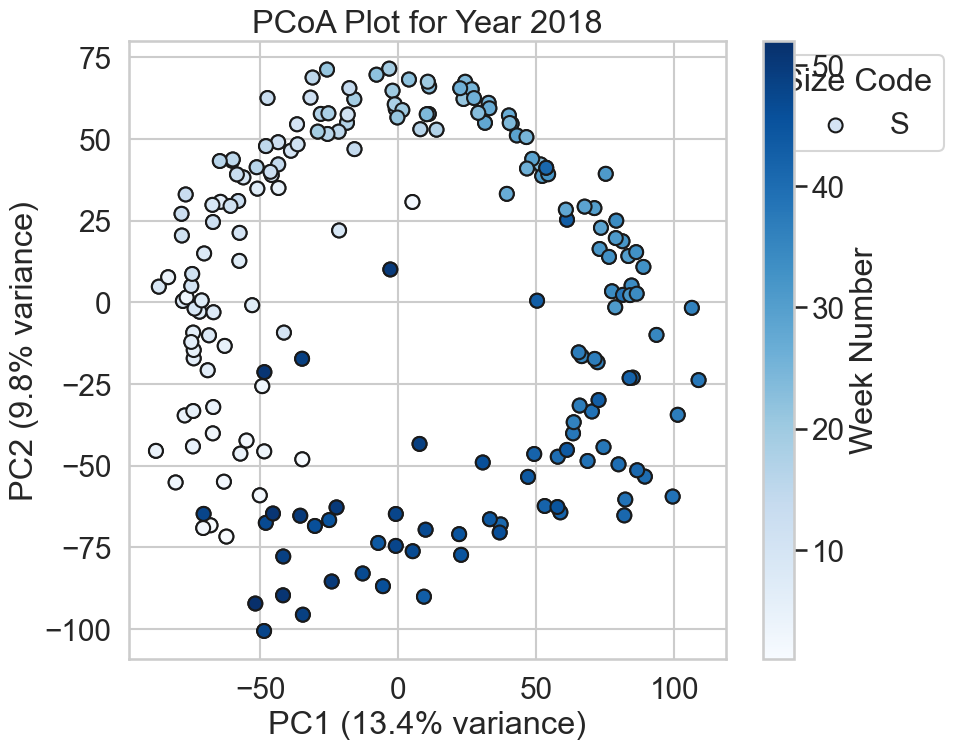

In [262]:
plot_pcoa_from_dist(dist_matrix, newseparated)

In [232]:
plot_pcoa_2018(newseparated)  # all size codes
# plot_pcoa_2018(newseparated, 'SL')  # single size code
# plot_pcoa_2018(newseparated, ['SL', 'L'])  # multiple size codes


DistanceMatrixError: Data must be symmetric and cannot contain NaNs.